Model evaluation
- regressors
        - R2
        - MSE
- Classifiers
        - ROC
        - AUC
        - Precision
        - Recall
        
Feature selection

- Feature importance
- Class probabilities

Tuning parameters



In [2]:
#Import a load of packages
import numpy as np
import pandas as pd
import statsmodels.api as sm
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error
import warnings

import patsy

from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import r2_score

plt.style.use('fivethirtyeight')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [3]:
data_prep = {'Col0' : ['row1', 'row2','row3', 'row4', 'row5', 'row6', 'row_7', 'row_8', 'Row9', 'Row10'],
        'Col1' : [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
       'col2' : [1.1, 2.2, 3.3, 4.4, np.NaN, 6.6, 7.7, 8.8, np.NaN, 100.10],
       'col3' : [-4, -3, -2, -1, 0, 1, 2, 'Nan', 4, 5],
       'col_a' : ['aaa', 'bbb', 'ccc', 'ddd', 'eee', 'fff', 'ggg', 'hhh', 'iii', 'jjj'],
       'col_b' : ['red', 'blue', 'green', 'orange', np.NaN, 'purple', 'white', 'black', 'brown', 'gray'],
        'colc' : [np.NaN,'square','square', 'circle', 'circle', '???', 'triangle', 'triangle', 'triangle','triangle'],
       'ycol' : [True, True, True, True, True, False, False, False, False, False],
       'col4' : ['excellent', 'excellent', 'very good', 'very good', 'good', 'good', 'fair', 'fair', 'appalling', 'appalling']}

In [34]:
#create data set for regression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import datasets
data_regression = datasets.load_diabetes()
df = pd.DataFrame(data_regression['data'], columns=data_regression['feature_names'])
df['ycol'] = data_regression['target']
df.head()
X = df.drop('ycol', axis=1)
y = df['ycol'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=0)
ss = StandardScaler()
ss.fit_transform(X_train)
ss.transform(X_test)
ss.transform(X)

In [4]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import datasets
data_clf = datasets.load_iris()
df = pd.DataFrame(data_clf['data'], columns=data_clf['feature_names'])
df['ycol'] = data_clf['target']
df.head()
X = df.drop('ycol', axis=1)
y = df['ycol'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=0)
ss = StandardScaler()
ss.fit_transform(X_train)
ss.transform(X_test)
ss.transform(X)

In [60]:
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

    
data_binary_clf = datasets.load_breast_cancer()
df = pd.DataFrame(data_binary_clf['data'], columns=data_binary_clf['feature_names'])
df['ycol'] = data_binary_clf['target']
X = df.drop('ycol', axis=1)
y = df['ycol'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=0)
ss = StandardScaler()
ss.fit_transform(X_train)
ss.transform(X_test)
ss.transform(X)

array([[ 1.05648412, -2.12214756,  1.23095452, ...,  2.2958899 ,
         2.6310774 ,  1.93735609],
       [ 1.78070995, -0.3712478 ,  1.64303832, ...,  1.07295807,
        -0.21284679,  0.28716004],
       [ 1.53368719,  0.4532625 ,  1.52471723, ...,  1.95088143,
         1.11308869,  0.20763252],
       ...,
       [ 0.66630044,  2.07148243,  0.63934907, ...,  0.39218241,
        -1.03022533, -0.31040091],
       [ 1.78913118,  2.36764274,  1.93680103, ...,  2.28972904,
         1.84135453,  2.21901606],
       [-1.8151555 ,  1.23275643, -1.82417763, ..., -1.79184446,
        -0.02693927, -0.74172726]])

# Python

#  Data cleaning/EDA
## Considerations
### Big Data vs Small Data

Before starting consider if the data is **'small'** data or **'big'** data.  

Small data is typically:
-  Collected for the purpose at hand
-  Therefore structured and, relatively, complete
-  A sample or subset of the reality which is used to make generalized statements using inferential maths/stats
-  Low in quantity  
  
Big data on the other hand is typically:
- Collected as a by-product
- Unstructured and not complete
- 3/4/5/6/7/8 V's apply *:
    1. Volume (teramegagigapetabytes of it)
    - Variety (text, sound, pictures, numbers, all in x-number of formats)
    - Velocity (online-realtime and the pace of growth)
    - Veracity (little validation, often 'opinions')
    - Value (the business models are based on it)
    - Vulnerability (Lots of security and business continuity issues)
    - Viability (Lots of 'dead wood': 5% of the attributes drive 95% of the rewards)
    - Visualization (Data is best visually represented, also think of GPS data)
- May represent the complete reality.
  
EDA/cleaning for a 'small' data set will often need to be handled with care. The smaller the data set the more care needs to be taken in order to maintain an acceptable sized data set. Careful imputation of missing data will more likely need to be considered rather than just 'dropna(how='any').
  
EDA for 'big' data will likely be focused on reducing the data in terms of number of features in and/or volume of the data. A plain 'dropna' and sample data reduction are very likely venues.
  
In practice a combination of the approaches are likely. Typically the Viability V's critical data columns will have missing data which will require minute surgical imputation in order to achieve the  Value V.

**Big Data** may often be so big that it is a 'black box': it is difficult to get a sense of what goes on inside it. This may lead to application of many models and just seeing what 'works' i.e. gives the best R^2 or best recall. A verification of the result 'making sense' is always required and make sure you have a 'baseline' which a model needs to beat. Check-out http://tylervigen.com/spurious-correlations



(*Dawn. E Holmes, Big Data, A Very Short Introduction, Oxford University Press, 2017)

### Purpose of the analysis/model

It makes a difference if you are modeling the likelihood of some fatal decease or trying to determine the 'who to target' for a marketing campaign based on webtraffic. In the first case careful, well documented, micro data cleaning/prep is required. In the latter case it may fine to ruthlessly drop 30K out of 100K records and run a LassoCV blindly.

### Lesson from EliteDataScience:
 "Finally, remember that better data beats fancier algorithms. In applied machine learning, algorithms are commodities because you can easily switch them in and out depending on the problem. However, effective exploratory analysis, data cleaning, and feature engineering can significantly boost your results."
https://elitedatascience.com/machine-learning-algorithms

## Getting data
### Importing

#### Models

In [178]:
from sklearn import svm
from sklearn import datasets
clf = svm.SVC()
iris = datasets.load_iris()
X, y = iris.data, iris.target
clf.fit(X, y)  
SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

import pickle
s = pickle.dumps(clf)
clf2 = pickle.loads(s)
clf2.predict(X[0:1])
np.array([0])
y[0]


/anaconda3/lib/python3.6/site-packages/sklearn/svm/base.py:194: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


0

### Webscraping
## Intitial EDA

In [113]:
#create some data
df = pd.DataFrame(data_prep)
df

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
0,row1,1,1.1,-4,excellent,aaa,red,NaN,True
1,row2,2,2.2,-3,excellent,bbb,blue,square,True
2,row3,3,3.3,-2,very good,ccc,green,square,True
3,row4,4,4.4,-1,very good,ddd,orange,circle,True
4,row5,5,NaN,0,good,eee,NaN,circle,True
5,row6,6,6.6,1,good,fff,purple,???,False
6,row_7,7,7.7,2,fair,ggg,white,triangle,False
7,row_8,8,8.8,Nan,fair,hhh,black,triangle,False
8,Row9,9,NaN,4,appalling,iii,brown,triangle,False
9,Row10,10,100.1,5,appalling,jjj,gray,triangle,False


In [114]:
df.shape

(10, 9)

In [115]:
df.columns

Index(['Col0', 'Col1', 'col2', 'col3', 'col4', 'col_a', 'col_b', 'colc',
       'ycol'],
      dtype='object')

In [116]:
df.dtypes

Col0      object
Col1       int64
col2     float64
col3      object
col4      object
col_a     object
col_b     object
colc      object
ycol        bool
dtype: object

In [117]:
df.head()

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
0,row1,1,1.1,-4,excellent,aaa,red,NaN,True
1,row2,2,2.2,-3,excellent,bbb,blue,square,True
2,row3,3,3.3,-2,very good,ccc,green,square,True
3,row4,4,4.4,-1,very good,ddd,orange,circle,True
4,row5,5,NaN,0,good,eee,NaN,circle,True


In [118]:
df.tail()

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
5,row6,6,6.6,1,good,fff,purple,???,False
6,row_7,7,7.7,2,fair,ggg,white,triangle,False
7,row_8,8,8.8,Nan,fair,hhh,black,triangle,False
8,Row9,9,NaN,4,appalling,iii,brown,triangle,False
9,Row10,10,100.1,5,appalling,jjj,gray,triangle,False


In [119]:
df.sample(5)

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
1,row2,2,2.2,-3,excellent,bbb,blue,square,True
8,Row9,9,NaN,4,appalling,iii,brown,triangle,False
5,row6,6,6.6,1,good,fff,purple,???,False
3,row4,4,4.4,-1,very good,ddd,orange,circle,True
9,Row10,10,100.1,5,appalling,jjj,gray,triangle,False


In [120]:
df.describe(include='all')

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
count,10,10.00000,8.000000,10.0,10,10,9,9,10
unique,10,NaN,NaN,10.0,5,10,9,4,2
top,row4,NaN,NaN,-1.0,good,bbb,red,triangle,True
freq,1,NaN,NaN,1.0,2,1,1,4,5
mean,NaN,5.50000,16.775000,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,3.02765,33.775297,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,1.00000,1.100000,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,3.25000,3.025000,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,5.50000,5.500000,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,7.75000,7.975000,NaN,NaN,NaN,NaN,NaN,NaN


In [121]:
#Initial EDA
from pandas_summary import DataFrameSummary
dfs = DataFrameSummary(df)
dfs.columns_stats # select suspect columns

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
counts,10,10,8,10,10,10,9,9,10
uniques,10,10,8,10,5,10,9,4,2
missing,0,0,2,0,0,0,1,1,0
missing_perc,0%,0%,20%,0%,0%,0%,10%,10%,0%
types,unique,numeric,numeric,unique,categorical,unique,unique,categorical,bool


In [101]:
dfs.summary() # inspect the suspects

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
count,NaN,10,8,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,5.5,16.775,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,3.02765,33.7753,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,1,1.1,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,3.25,3.025,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,5.5,5.5,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,7.75,7.975,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,10,100.1,NaN,NaN,NaN,NaN,NaN,NaN
counts,10,10,8,10,10,10,9,9,10
uniques,10,10,8,10,5,10,9,4,2


/anaconda3/lib/python3.6/site-packages/pandas_summary/__init__.py:130: RuntimeWarning: invalid value encountered in minimum
  capped_series = np.minimum(series, series.mean() + multiplier * series.std())
/anaconda3/lib/python3.6/site-packages/pandas_summary/__init__.py:143: RuntimeWarning: invalid value encountered in minimum
  capped_series = np.minimum(series, series.median() + multiplier * series.mad())


mean                              16.775
std                              33.7753
variance                         1140.77
min                                  1.1
max                                100.1
5%                                 1.485
25%                                3.025
50%                                  5.5
75%                                7.975
95%                               68.145
iqr                                 4.95
kurtosis                         7.84875
skewness                          2.7928
sum                                134.2
mad                              20.8312
cv                               2.01343
zeros_num                              0
zeros_perc                            0%
deviating_of_mean                      2
deviating_of_mean_perc               20%
deviating_of_median                    3
deviating_of_median_perc             30%
top_correlations            Col1: 68.79%
counts                                 8
uniques         

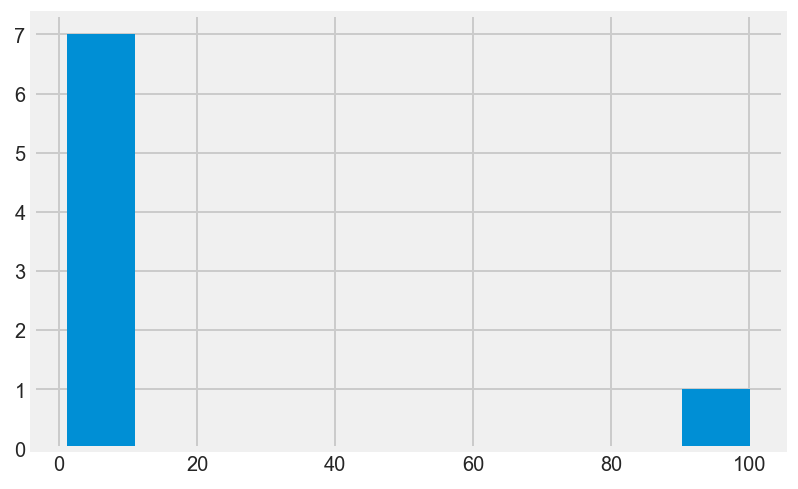

In [102]:
dfs['col2'] # detail the suspects

### Summerizing the data

#### Group by

In [129]:
# Example in the works

#### Numericals:  Excel-like pivot tables

In [130]:
import datetime
df = pd.DataFrame({'A': ['one', 'one', 'two', 'three'] * 6,
                   'B': ['A', 'B', 'C'] * 8,
                    'C': ['foo', 'foo', 'foo', 'bar', 'bar', 'bar'] * 4,
                    'D': np.random.randn(24),
                    'E': np.random.randn(24),
                    'F': [datetime.datetime(2013, i, 1) for i in range(1, 13)] +
                        [datetime.datetime(2013, i, 15) for i in range(1, 13)]}) 
pd.pivot_table(df, values='D', index=['B'], columns=['A', 'C'], aggfunc=np.mean)

A       one               three                 two          
C       bar       foo       bar       foo       bar       foo
B                                                            
A -0.864340 -0.349467 -0.649230       NaN       NaN  0.220230
B -0.835415 -1.652864       NaN  0.257063 -1.194081       NaN
C  0.928423 -0.257519  0.146123       NaN       NaN  1.077633

In [131]:
table = pd.pivot_table(df, values='D', index=pd.Grouper(freq='M', key='F'), columns='C')
print(table.to_string(na_rep=''))

C                bar       foo
F                             
2013-01-31           -0.349467
2013-02-28           -1.652864
2013-03-31            1.077633
2013-04-30 -0.649230          
2013-05-31 -0.835415          
2013-06-30  0.928423          
2013-07-31            0.220230
2013-08-31            0.257063
2013-09-30           -0.257519
2013-10-31 -0.864340          
2013-11-30 -1.194081          
2013-12-31  0.146123          


#### Categoricals: Old-fashioned Cross-Tabs

In [126]:
#counts
foo, bar, dull, shiny, one, two = 'foo', 'bar', 'dull', 'shiny', 'one', 'two'
a = np.array([foo, foo, bar, bar, foo, foo], dtype=object)
b = np.array([one, one, two, one, two, one], dtype=object)
c = np.array([dull, dull, shiny, dull, dull, shiny], dtype=object)
pd.crosstab(a, [b, c], rownames=['a'], colnames=['b', 'c'])
# see that you do not need to create a DataFrame to use pandas functionality

b    one        two      
c   dull shiny dull shiny
a                        
bar    1     0    0     1
foo    2     1    1     0

In [106]:
#percentages 
pd.crosstab(a, [b, c], rownames=['a'], colnames=['b', 'c'], normalize=True)

b         one                 two          
c        dull     shiny      dull     shiny
a                                          
bar  0.166667  0.000000  0.000000  0.166667
foo  0.333333  0.166667  0.166667  0.000000

## Real world: Imperfect data

### Target(y) is skewed (i.e. not 'Bell'-shaped)
- Apply log Transformation
- Models less sensitive to this problem:
    - KNN (Regressor/Classifier)
    - (Boosted) Forest/Trees

### Non-linear relationships
- Apply Polynomial transformations
- Model less sensitive to this problem:
    - (Boosted) Forest/Trees
    
### Imbalanced (y) in data sets
- Adjust **training** data set; sklearn.imbalanced-learn  
I.e. the model is trained on the synthetically balanced set and tested on the original unbalanced test set.
    **Note** set stratify=True @ train/test split; this ensures that all splits have the same y/target category/value distribution.
    
    - Under-sampling (for 1 large category among smaller ones)
   
    

In [101]:
df

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
0,row1,1,1.1,-4,excellent,aaa,red,NaN,True
1,row2,2,2.2,-3,excellent,bbb,blue,square,True
2,row3,3,3.3,-2,very good,ccc,green,square,True
3,row4,4,4.4,-1,very good,ddd,orange,circle,True
4,row5,5,NaN,0,good,eee,NaN,circle,True
5,row6,6,6.6,1,good,fff,purple,???,False
6,row_7,7,7.7,2,fair,ggg,white,triangle,False
7,row_8,8,8.8,Nan,fair,hhh,black,triangle,False
8,Row9,9,NaN,4,appalling,iii,brown,triangle,False
9,Row10,10,100.1,5,appalling,jjj,gray,triangle,False


In [166]:
df = pd.DataFrame(data_prep) #create data
df['col2'].fillna(method='ffill', inplace=True) # Nan's are not appreciated
df['col4'] = ['excellent', 'excellent', 'excellent',
              'excellent', 'good', 'good', 'fair', 'fair', 'fair', 'fair'] #unbalance the y
df = df.append([df]*5) #SMOTES needs a larger dataset
df.reset_index()
X_train = df[['col2']]
y_train = df['col4'].values
from imblearn.under_sampling import RandomUnderSampler

under_sampler = RandomUnderSampler(
    random_state=123, return_indices=True, replacement=False)
under_sampler.fit(X_train, y_train)
X_train_u, y_train_u, idx_returned = under_sampler.sample(X_train, y_train)

In [167]:
X_train_u.shape #6 of 10 records left

(36, 1)

In [168]:
y_train_u # nicely equally distributed

array(['excellent', 'excellent', 'excellent', 'excellent', 'excellent',
       'excellent', 'excellent', 'excellent', 'excellent', 'excellent',
       'excellent', 'excellent', 'fair', 'fair', 'fair', 'fair', 'fair',
       'fair', 'fair', 'fair', 'fair', 'fair', 'fair', 'fair', 'good',
       'good', 'good', 'good', 'good', 'good', 'good', 'good', 'good',
       'good', 'good', 'good'], dtype=object)

    - Over-sampling(1 small category among larger ones)

In [165]:
df = pd.DataFrame(data_prep)  # create data
df['col2'].fillna(method='ffill', inplace=True)  # Nan's are not appreciated
df['col4'] = ['excellent', 'excellent', 'excellent',
              'excellent', 'excellent', 'excellent', 'excellent', 'fair', 'fair', 'good']  # create un balance

df = df.append([df]*5) #SMOTES needs a larger dataset
df.reset_index()

X_train = df[['col2']]
y_train = df['col4'].values
# Using SMOTE to Balance the classes in Training set:

from imblearn.over_sampling import SMOTE
SMOTEsampler = SMOTE(random_state=123)
X_train_o, y_train_o = SMOTEsampler.fit_sample(X_train, y_train)
print(f'Size of the original X: {len(X_train)}')
print(f'Size of the SMOTE X: {len(X_train_o)}')
print('Value count original y:')
print(df['col4'].value_counts())
print('Value count SMOTE y:')
pd.DataFrame(y_train_o)[0].value_counts()

Size of the original X: 60
Size of the SMOTE X: 126
Value count original y:
excellent    42
fair         12
good          6
Name: col4, dtype: int64
Value count SMOTE y:


fair         42
excellent    42
good         42
Name: 0, dtype: int64

    - Hybrid
    see https://github.com/cthacker/class-balancer
    
- Models less sensitive to this problem:

    - AdaBoost
    - Naive Bayes
    
### Too many features
Having (too) many features may pose a problem productionalizing the model. E.g. a model may make a near prefect prediction of the amount of money a customer will spend during his next purchase using 100 features but then all those 100 features need to be available completely for forecasting. This may not always be the case in practise. So check which features will be readily available in production @ acceptable effort/cost.
<br><br>
Always used in case of NLP

- Extract
    - Principle Component Analysis
    - Linear Discriminant Analysis
- Select
    - Correlation Thresholds  
    Only choose the features with the highest correlation/predictive value
    - Variance thresholds  
    Eliminate any feature where the majority of observations have the same value
    (different from Co-variance)
- Models with built in feature selection
    - Lasso Regression (Unimportant features get a 0 coefficient)
    - Random forests/decisions trees (feature that do not add information get left out)
    
## Cleaning

### Intitial Validation 

### Outliers

Wikipedia: "an outlier is an observation point that is distant from other observations"  
Considerations:
-  Purpose of the analysis
    - Predicting anomalies/Black Swans, e.g. detecting fraud:    
    outliers are a blessing
    - Predicting averages e.g. average house prices  
    It is a common practice to limit the dataset to the mean +/- 2 or 3 std's on key independent variables
-  Number of outliers vis a vis the quantity of data
-  Overall data quality
-  Type of model likely to be applied, some models e.g regression are sensitive to outliers.

**note:** Categorical data may also have outliers: an 'outlier' category will have a frequency of a different magnitude than the others  (e.g. {FavoriteColorBlue : 1000, FavoriteColorRed :2000, FavoriteColorMauve: 5}

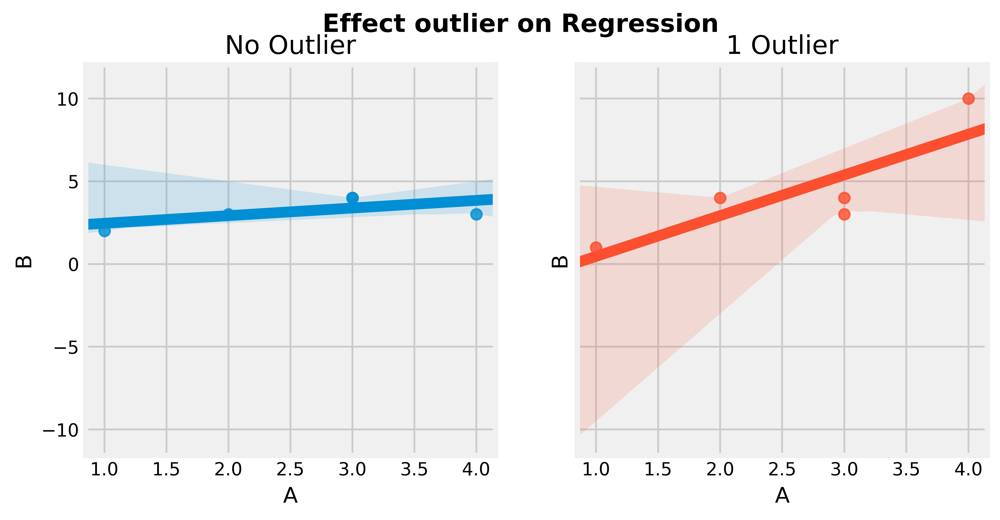

In [72]:
#Illustration of impact of outlier on simple regression
df_ = pd.DataFrame({'A': [1, 2, 3, 3, 4], 'B': [2, 3, 4, 4, 3]})
df = pd.DataFrame({'A': [1, 3, 2, 3, 4], 'B': [1, 3, 4, 4, 10]})
import seaborn as sns
fig, axs = plt.subplots(ncols=2,figsize=(8,4), sharey=True)

sns.regplot(x='A', y='B', data=df_, ax=axs[0])
axs[0].set_title("No Outlier")
sns.regplot(x='A', y='B', data=df, ax=axs[1])
axs[1].set_title("1 Outlier")
fig.suptitle('Effect outlier on Regression', fontsize=14, fontweight='bold')

plt.show()
# it took me 2 hours to figure out sns.lmplots cannot be subplotted

#### Identify outliers
##### Visually by plotting
##### Filtering
- Z scores
- Medians

##### More Advanced methodologies

- DBScan
- Isolation Forest

#### Establish the cause of the outlier
For all outliers the cause should be established. Or rather, error as a cause should be ruled out. Outliers should be 'presumed innocent until proven guilty'. Sources of error include:
    -  (Manual) Input error
    -  Error in interface/conversion
    -  Malfunction of the recording technology (chain)

##### Error

If an error is established:
1. Correct if possible
2. Treat as NaN

##### True outlier, aka 'Novelty'

Course of action is determined by the **purpose of the model/analysis** :

Remove records with outliers from the data set if:

- Focus on prediction of averages
- Overall data quality is poor anyway
- Susceptibility for outliers of the anticipated models

Retain them for:

- Anomaly detection/prediction 


In [170]:
# Approach using Mean/Std, good for (close to) normally districuted data
df = pd.DataFrame(data_prep)
# set values
avg = df['col2'].mean()
dev = df['col2'].std()
# set boundaries
outlmin = avg - 2 * dev
outlmax = avg + 2 * dev
#create mask
mask = (df['col2'] > outlmax) | (df['col2'] < outlmin) #() around each condition
#apply mask to DF
df = df[~mask].copy() #.copy helps avoiding error messages
df

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
0,row1,1,1.1,-4,excellent,aaa,red,NaN,True
1,row2,2,2.2,-3,excellent,bbb,blue,square,True
2,row3,3,3.3,-2,very good,ccc,green,square,True
3,row4,4,4.4,-1,very good,ddd,orange,circle,True
4,row5,5,NaN,0,good,eee,NaN,circle,True
5,row6,6,6.6,1,good,fff,purple,???,False
6,row_7,7,7.7,2,fair,ggg,white,triangle,False
7,row_8,8,8.8,Nan,fair,hhh,black,triangle,False
8,Row9,9,NaN,4,appalling,iii,brown,triangle,False


In [171]:
# InterQuartileRange approach, good for data not normally distributed
df = pd.DataFrame(data_prep)
df = df.dropna() #np.percentile does not like NaN

quartile_1, quartile_3 = np.percentile(df['col2'], [25, 75])
iqr = quartile_3 - quartile_1
# set boundaries
outlmin = quartile_1 - (iqr * 1.5)
outlmax = quartile_3 + (iqr * 1.5)

#create mask
mask = (df['col2'] > outlmax) | (df['col2'] < outlmin) #() around each condition
#apply mask to DF
df = df[~mask].copy() #.copy helps avoiding error messages
df

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
1,row2,2,2.2,-3,excellent,bbb,blue,square,True
2,row3,3,3.3,-2,very good,ccc,green,square,True
3,row4,4,4.4,-1,very good,ddd,orange,circle,True
5,row6,6,6.6,1,good,fff,purple,???,False
6,row_7,7,7.7,2,fair,ggg,white,triangle,False
7,row_8,8,8.8,Nan,fair,hhh,black,triangle,False


In [172]:
df = pd.DataFrame(data_prep)
# 1 sided outlier elimination, pandas way
df[df['col2'] < 3 * df['col2'].mean()]


,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
0,row1,1,1.1,-4,excellent,aaa,red,NaN,True
1,row2,2,2.2,-3,excellent,bbb,blue,square,True
2,row3,3,3.3,-2,very good,ccc,green,square,True
3,row4,4,4.4,-1,very good,ddd,orange,circle,True
5,row6,6,6.6,1,good,fff,purple,???,False
6,row_7,7,7.7,2,fair,ggg,white,triangle,False
7,row_8,8,8.8,Nan,fair,hhh,black,triangle,False


In [173]:
df = pd.DataFrame(data_prep)
# 2 sided outlier elimination, pandas way
df[(df['col2'] < df['col2'].mean() + 2 * df['col2'].std()) | (df['col2'] > df['col2'].mean() - 2 * df['col2'].std())]

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
0,row1,1,1.1,-4,excellent,aaa,red,NaN,True
1,row2,2,2.2,-3,excellent,bbb,blue,square,True
2,row3,3,3.3,-2,very good,ccc,green,square,True
3,row4,4,4.4,-1,very good,ddd,orange,circle,True
5,row6,6,6.6,1,good,fff,purple,???,False
6,row_7,7,7.7,2,fair,ggg,white,triangle,False
7,row_8,8,8.8,Nan,fair,hhh,black,triangle,False
9,Row10,10,100.1,5,appalling,jjj,gray,triangle,False


Accuracy: 0.93
Accuracy: 0.96


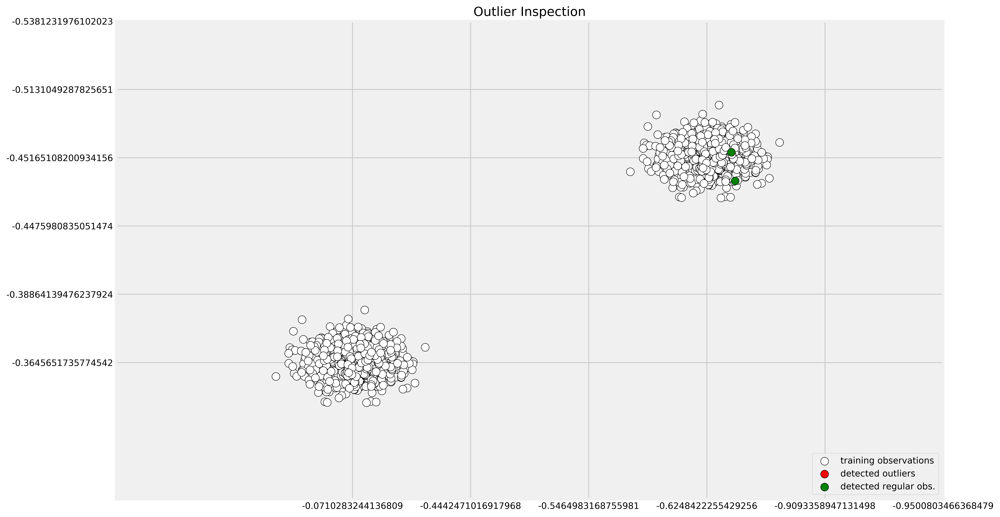

In [181]:
# Isolation Forest ----

# training the model
clf = IsolationForest(max_samples=100, contamination = 0.1, random_state=rng)
clf.fit(X_train)

# predictions
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)
y_pred_outliers = clf.predict(X_outliers)

# new, 'normal' observations
print("Accuracy:", list(y_pred_test).count(1)/y_pred_test.shape[0])
# outliers
print("Accuracy:", list(y_pred_outliers).count(-1)/y_pred_outliers.shape[0])
# Inspecting the outliers ----

# adding the predicted label
X_outliers = X_outliers.assign(y = y_pred_outliers)

plt.title("Outlier Inspection")

p1 = plt.scatter(X_train.x1, X_train.x2, c='white',
                 s=20*4, edgecolor='k')
p2 = plt.scatter(X_outliers.loc[X_outliers.y == -1, ['x1']], 
                 X_outliers.loc[X_outliers.y == -1, ['x2']], 
                 c='red', s=20*4, edgecolor='k')
p3 = plt.scatter(X_outliers.loc[X_outliers.y == 1, ['x1']], 
                 X_outliers.loc[X_outliers.y == 1, ['x2']], 
                 c='green', s=20*4, edgecolor='k')

plt.axis('tight')
plt.xlim((-2, 5))
plt.ylim((-2, 5))
plt.legend([p1, p2, p3],
           ["training observations",
            "detected outliers", 
            "detected regular obs."],
           loc="lower right")

# saving the figure
plt.savefig('outlier_inspection.png', dpi=300)

plt.show()

### Isolation Forest

Eliminating outliers in multi dimensional space. It labels a desired fraction ('contamination') of the dataset as outlier, which may be inspected and deleted. It may perform better compared to manual individual row inspection. Outlier elimination takes place on the full data set.(https://towardsdatascience.com/outlier-detection-with-isolation-forest-3d190448d45e)

In [14]:
#get the data ready
data = datasets.load_iris()
df = pd.DataFrame(data['data'], columns=data['feature_names'])
df['ycol'] = data['target']
X = df.drop('ycol', axis=1)
y = df['ycol'].values
print(f'The shape of the full data frame: {df.shape}')
from sklearn.preprocessing import StandardScaler
# initialize the Scaler
ss = StandardScaler()
# Fit the data using the scaler (scale the data)
ss.fit_transform(X) #scale on X-train



from sklearn.ensemble import IsolationForest
# training the model
outliers_fraction = 0.05
outlier_clf = IsolationForest(max_samples=100, contamination = outliers_fraction, random_state=42)
outlier_clf.fit(X)

# predictions - mark the outliers
df['outlier'] = outlier_clf.predict(X)

The shape of the full data frame: (150, 5)


In [15]:
# eliminate outliers
mask = df['outlier'] == 1
df = df[mask]
print(f' the shape of the data farme with {outliers_fraction} outliers eliminated is: {df.shape}')

 the shape of the data farme with 0.05 outliers eliminated is: (142, 6)


In [16]:
#alternative method (https://chrisalbon.com/machine_learning/preprocessing_structured_data/detecting_outliers/)
from sklearn.covariance import EllipticEnvelope

outliers_fraction = 0.05

# Create detector
outlier_clf = EllipticEnvelope(contamination=outliers_fraction)

# Fit detector
outlier_clf.fit(X)

# Predict outliers
outlier_clf.predict(X)

array([ 1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1, -1,  1,  1, -1,  1,
        1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1, -1,  1,
        1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1])

In [ ]:
#also look at radius knn

### Missing data

Considerations:

-  Volume of the data
-  Origin/nature of the data (e.g. sample of tweets  vs a scientific experiment)
-  Phase in the modeling process(e.g. initial stages vs final feature selection)
-  Are NaN's likely to occur in production?

Essentially 3 strategies. 
1.  Dropping  
Common 'Big Data' approach. If data is ambundant. NaN's low in volume. During initial stage of the modeling.
2.  Imputing  
Traditional 'Small Data' approach. Low data volumes, NaN's low in volume
3.  Categorizing  
Considers the presence of NaN's to hold information by its virtue. Dropping or Imputing will lose this information. (e.g. certain age groups may be more hesitant to state their age. By dropping the records the specific age group may be underrepresented)

By using this technique of flagging and filling, you are essentially allowing the algorithm to estimate the optimal constant for 'missingness', instead of just filling it in with the mean.
  
Additional advantage is that this makes a productionalized model more robust as it will allow for NaN's (e.g. even if somebody does in fill in her age the model can still predict)



#### Identify missing data



In [174]:
df = pd.DataFrame(data_prep)
df__ = df.isnull().sum(axis=1) # by index (by row in db terms)
df_ = df.isnull().sum() # by column
print(df__, df_)

0    1
1    0
2    0
3    0
4    2
5    0
6    0
7    0
8    1
9    0
dtype: int64 Col0     0
Col1     0
col2     2
col3     0
col4     0
col_a    0
col_b    1
colc     1
ycol     0
dtype: int64


Decide if there are other values that should be considered 'null' or NaN. These may include: '?', 999(as an integer), ' ' (space). In a wider sense: anything that is not appropriate for the purpose of variable. E.g. the variable 'sex' may include the answer 'yes, please!', although a KNN will likely impute in a 14 year old male, it is best to regard this joker as a np.NaN .
<br><br>
It may be tricky to identify these, check the data dictionary for valid data. If not available do a value count on objects (not for NLP obviously)

In [175]:
df['colc'].value_counts()

triangle    4
circle      2
square      2
???         1
Name: colc, dtype: int64

Numeric columns replace the identified missing values with np.NaN

For object columns, it is a little more tricky technically. For Python string operations do not like np.NaN's.
    1. identify missing values
    2. replace the strings with a generic string 
    3. convert generic string to np.NaN
    4. Convert column to integer/

### Dropna

The classic 'Big Data' approach; 

In [176]:
df = pd.DataFrame(data_prep)
# Dropping all rows with an(y) NA
df.dropna(axis=0)

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
1,row2,2,2.2,-3,excellent,bbb,blue,square,True
2,row3,3,3.3,-2,very good,ccc,green,square,True
3,row4,4,4.4,-1,very good,ddd,orange,circle,True
5,row6,6,6.6,1,good,fff,purple,???,False
6,row_7,7,7.7,2,fair,ggg,white,triangle,False
7,row_8,8,8.8,Nan,fair,hhh,black,triangle,False
9,Row10,10,100.1,5,appalling,jjj,gray,triangle,False


In [177]:
df = pd.DataFrame(data_prep)
# Dropping columns
df.dropna(axis=1)

,Col0,Col1,col3,col4,col_a,ycol
0,row1,1,-4,excellent,aaa,True
1,row2,2,-3,excellent,bbb,True
2,row3,3,-2,very good,ccc,True
3,row4,4,-1,very good,ddd,True
4,row5,5,0,good,eee,True
5,row6,6,1,good,fff,False
6,row_7,7,2,fair,ggg,False
7,row_8,8,Nan,fair,hhh,False
8,Row9,9,4,appalling,iii,False
9,Row10,10,5,appalling,jjj,False


Nifty trick: df.dropna(axis=1, thres=3), defines the acceptable number of NaN's along the axis

### Imputing
#### SKlearn Impute
Fits into pipelines

In [178]:
df = pd.DataFrame(data_prep)
# by column
import numpy as np
from sklearn.preprocessing import Imputer
imp = Imputer(axis=0, copy=True, missing_values='NaN', strategy='mean', verbose=10)
X = df[['col2']]
imp.fit(X)
df['col2'] = (imp.transform(X)) 
df

/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:58: DeprecationWarning: Class Imputer is deprecated; Imputer was deprecated in version 0.20 and will be removed in 0.22. Import impute.SimpleImputer from sklearn instead.
  warnings.warn(msg, category=DeprecationWarning)


,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
0,row1,1,1.100,-4,excellent,aaa,red,NaN,True
1,row2,2,2.200,-3,excellent,bbb,blue,square,True
2,row3,3,3.300,-2,very good,ccc,green,square,True
3,row4,4,4.400,-1,very good,ddd,orange,circle,True
4,row5,5,16.775,0,good,eee,NaN,circle,True
5,row6,6,6.600,1,good,fff,purple,???,False
6,row_7,7,7.700,2,fair,ggg,white,triangle,False
7,row_8,8,8.800,Nan,fair,hhh,black,triangle,False
8,Row9,9,16.775,4,appalling,iii,brown,triangle,False
9,Row10,10,100.100,5,appalling,jjj,gray,triangle,False


In [179]:
#by column
from sklearn.impute import SimpleImputer
import numpy as np
imp = SimpleImputer(missing_values='NaN', strategy='mean')
X = [[np.nan, 2], [6, np.nan], [7, 6]]
imp.fit(X)
print(imp.transform(X))           

[[6.5 2. ]
 [6.  4. ]
 [7.  6. ]]


In [180]:
#categoricals : impute 1 column NaN with most frequent for the column
df = df.fillna(df['colc'].value_counts().index[0])
df

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
0,row1,1,1.100,-4,excellent,aaa,red,triangle,True
1,row2,2,2.200,-3,excellent,bbb,blue,square,True
2,row3,3,3.300,-2,very good,ccc,green,square,True
3,row4,4,4.400,-1,very good,ddd,orange,circle,True
4,row5,5,16.775,0,good,eee,triangle,circle,True
5,row6,6,6.600,1,good,fff,purple,???,False
6,row_7,7,7.700,2,fair,ggg,white,triangle,False
7,row_8,8,8.800,Nan,fair,hhh,black,triangle,False
8,Row9,9,16.775,4,appalling,iii,brown,triangle,False
9,Row10,10,100.100,5,appalling,jjj,gray,triangle,False


In [181]:
# All columns:
df = df.apply(lambda x:x.fillna(x.value_counts().index[0]))
df

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
0,row1,1,1.100,-4,excellent,aaa,red,triangle,True
1,row2,2,2.200,-3,excellent,bbb,blue,square,True
2,row3,3,3.300,-2,very good,ccc,green,square,True
3,row4,4,4.400,-1,very good,ddd,orange,circle,True
4,row5,5,16.775,0,good,eee,triangle,circle,True
5,row6,6,6.600,1,good,fff,purple,???,False
6,row_7,7,7.700,2,fair,ggg,white,triangle,False
7,row_8,8,8.800,Nan,fair,hhh,black,triangle,False
8,Row9,9,16.775,4,appalling,iii,brown,triangle,False
9,Row10,10,100.100,5,appalling,jjj,gray,triangle,False


In SKLearn 0.20 a ChainedImputer will be included which has more advanced features, like using models for determining the best value for the NA

#### Pandas 
##### Fillna

In [182]:
df.fillna(2) #fills with integer 2

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
0,row1,1,1.100,-4,excellent,aaa,red,triangle,True
1,row2,2,2.200,-3,excellent,bbb,blue,square,True
2,row3,3,3.300,-2,very good,ccc,green,square,True
3,row4,4,4.400,-1,very good,ddd,orange,circle,True
4,row5,5,16.775,0,good,eee,triangle,circle,True
5,row6,6,6.600,1,good,fff,purple,???,False
6,row_7,7,7.700,2,fair,ggg,white,triangle,False
7,row_8,8,8.800,Nan,fair,hhh,black,triangle,False
8,Row9,9,16.775,4,appalling,iii,brown,triangle,False
9,Row10,10,100.100,5,appalling,jjj,gray,triangle,False


In [183]:
df.fillna(method='ffill') #repeats last value before NaN

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
0,row1,1,1.100,-4,excellent,aaa,red,triangle,True
1,row2,2,2.200,-3,excellent,bbb,blue,square,True
2,row3,3,3.300,-2,very good,ccc,green,square,True
3,row4,4,4.400,-1,very good,ddd,orange,circle,True
4,row5,5,16.775,0,good,eee,triangle,circle,True
5,row6,6,6.600,1,good,fff,purple,???,False
6,row_7,7,7.700,2,fair,ggg,white,triangle,False
7,row_8,8,8.800,Nan,fair,hhh,black,triangle,False
8,Row9,9,16.775,4,appalling,iii,brown,triangle,False
9,Row10,10,100.100,5,appalling,jjj,gray,triangle,False


In [184]:
df.fillna(method='bfill') #repeats first value after NaN

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
0,row1,1,1.100,-4,excellent,aaa,red,triangle,True
1,row2,2,2.200,-3,excellent,bbb,blue,square,True
2,row3,3,3.300,-2,very good,ccc,green,square,True
3,row4,4,4.400,-1,very good,ddd,orange,circle,True
4,row5,5,16.775,0,good,eee,triangle,circle,True
5,row6,6,6.600,1,good,fff,purple,???,False
6,row_7,7,7.700,2,fair,ggg,white,triangle,False
7,row_8,8,8.800,Nan,fair,hhh,black,triangle,False
8,Row9,9,16.775,4,appalling,iii,brown,triangle,False
9,Row10,10,100.100,5,appalling,jjj,gray,triangle,False


In [185]:
df['col2'] = df['col2'].fillna(df['col2'].mean()) # fill with mean for the column
df

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
0,row1,1,1.100,-4,excellent,aaa,red,triangle,True
1,row2,2,2.200,-3,excellent,bbb,blue,square,True
2,row3,3,3.300,-2,very good,ccc,green,square,True
3,row4,4,4.400,-1,very good,ddd,orange,circle,True
4,row5,5,16.775,0,good,eee,triangle,circle,True
5,row6,6,6.600,1,good,fff,purple,???,False
6,row_7,7,7.700,2,fair,ggg,white,triangle,False
7,row_8,8,8.800,Nan,fair,hhh,black,triangle,False
8,Row9,9,16.775,4,appalling,iii,brown,triangle,False
9,Row10,10,100.100,5,appalling,jjj,gray,triangle,False


In [399]:
df = pd.DataFrame(data_prep)
df[['col3', 'colc']].replace(['???', 'Nan'], np.nan, inplace=True)#replace strings with np.nan
df

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
0,row1,1,1.1,-4,excellent,aaa,red,NaN,True
1,row2,2,2.2,-3,excellent,bbb,blue,square,True
2,row3,3,3.3,-2,very good,ccc,green,square,True
3,row4,4,4.4,-1,very good,ddd,orange,circle,True
4,row5,5,NaN,0,good,eee,NaN,circle,True
5,row6,6,6.6,1,good,fff,purple,???,False
6,row_7,7,7.7,2,fair,ggg,white,triangle,False
7,row_8,8,8.8,Nan,fair,hhh,black,triangle,False
8,Row9,9,NaN,4,appalling,iii,brown,triangle,False
9,Row10,10,100.1,5,appalling,jjj,gray,triangle,False


#### Interpolation

In [192]:

df['col3'] = df['col3'].astype(float)
df['col3'] = df['col3'].interpolate(axis=0)#, inplace=True)
df
#df.interpolate(axis=1, limit=2, inplace=True)

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
0,row1,1,1.1,-4.0,excellent,aaa,red,NaN,True
1,row2,2,2.2,-3.0,excellent,bbb,blue,square,True
2,row3,3,3.3,-2.0,very good,ccc,green,square,True
3,row4,4,4.4,-1.0,very good,ddd,orange,circle,True
4,row5,5,NaN,0.0,good,eee,NaN,circle,True
5,row6,6,6.6,1.0,good,fff,purple,???,False
6,row_7,7,7.7,2.0,fair,ggg,white,triangle,False
7,row_8,8,8.8,3.0,fair,hhh,black,triangle,False
8,Row9,9,NaN,4.0,appalling,iii,brown,triangle,False
9,Row10,10,100.1,5.0,appalling,jjj,gray,triangle,False


#### KNN Classifier/Regressor(or any other model for that matter)

It is very feasible to use a predictive model for imputation. Careful not to build a 'model on a model' KNN is a likely (but slow) candidate. In fact it can be done with any other predictor other than Tarot cards. Outline is as follows:
    1. Split the df in 2 parts:
        1. With the NaN's
        2. Without the NaN's
    2. Define your y as the missing values column
    3. Define X as the columns to use for prediction. Make sure to **not include** i.e. **exclude** the ultimate target
    4. In case of a classifier: determine the baseline i.e. the largest majority class
    5. Scale your X
    6. Fit the model (use CrossVal, GridSearch as deemed appropriate for the purpose)
    7. Evaluate the model (R^2 or compare to baseline)
    8. Decide what to do
        1. Take the mean/median for continuous data
        2. Take the mode for discrete
    9. Predict the NaN's
    10. merge the 2 df's again
Good solution if missing value can be easily derived
    
    

In [60]:
df_imp = pd.read_excel('ImputKnn.xls',na_values='NaN')
df_imp

,col1,col2,col3,col4,col5,col6
0,10.0,4,4,6,90,1
1,10.0,4,5,6,100,1
2,NaN,4,5,6,90,1
3,10.0,7,8,9,100,0
4,20.0,4,5,6,90,0
5,20.0,7,8,8,102,0
6,20.0,7,8,8,90,1
7,NaN,7,8,9,106,1
8,20.0,11,12,13,100,1
9,30.0,14,15,16,90,0


In [46]:
#Split df on NaN's
impute_missing = df_imp.loc[df_imp['col1'].isnull(), :]
impute_valid = df_imp.loc[~df_imp['col1'].isnull(), :]

In [47]:
#define pred columns
pred_cols = [c for c in impute_valid.columns if not c in ['col6', 'col1']]
y = impute_valid['col1'].values
X = impute_valid[pred_cols]

In [48]:
#train model
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
ss = StandardScaler()
Xs = ss.fit_transform(X)
knn = KNeighborsClassifier(n_neighbors=3,n_jobs=-1)
scores = cross_val_score(knn, Xs, y, cv=2)
print (scores)
print (np.mean(scores))

[0.66666667 0.6       ]
0.6333333333333333


In [49]:
#fit on valid and predict missing
knn.fit(Xs,y)
y = impute_missing['col1'].values
Xp = impute_missing[pred_cols]
ss = StandardScaler()
Xp = ss.fit_transform(Xp)

In [61]:
#impute missing
impute_missing['col1'] = knn.predict(Xp)
df_imp.loc[df_imp['col1'].isnull(), 'col1'] = impute_missing['col1']
df_imp

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,col1,col2,col3,col4,col5,col6
0,10.0,4,4,6,90,1
1,10.0,4,5,6,100,1
2,10.0,4,5,6,90,1
3,10.0,7,8,9,100,0
4,20.0,4,5,6,90,0
5,20.0,7,8,8,102,0
6,20.0,7,8,8,90,1
7,10.0,7,8,9,106,1
8,20.0,11,12,13,100,1
9,30.0,14,15,16,90,0


### Categorizing

Considers that the occurance of a NaN may hold information by itself. 

-  Introducing a category "missing" for categorical data.
-  introduce a dummy 'missing' per column with missing integers. Put the value to 1 for missing and 0 for valid entires. Include the 'missing' column in your X

By using this technique of flagging and filling, you are essentially allowing the algorithm to estimate the optimal constant for 'missingness', instead of just filling it in with the mean.
  
Additional advantage is that this makes a productionalized model more robust as it allows for a value to be missing.


In [ ]:
#example forthcoming

### The opposite of Missing Data
#### Functional
It is also possible that there is 'too much' data. 

In [420]:
df = pd.DataFrame(data_prep)
df = df.append(df.iloc[[4,7]]) #create duplicates
df

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
0,row1,1,1.1,-4,excellent,aaa,red,NaN,True
1,row2,2,2.2,-3,excellent,bbb,blue,square,True
2,row3,3,3.3,-2,very good,ccc,green,square,True
3,row4,4,4.4,-1,very good,ddd,orange,circle,True
4,row5,5,NaN,0,good,eee,NaN,circle,True
5,row6,6,6.6,1,good,fff,purple,???,False
6,row_7,7,7.7,2,fair,ggg,white,triangle,False
7,row_8,8,8.8,Nan,fair,hhh,black,triangle,False
8,Row9,9,NaN,4,appalling,iii,brown,triangle,False
9,Row10,10,100.1,5,appalling,jjj,gray,triangle,False


In [421]:
# Dropping duplicate rows
df.drop_duplicates()

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
0,row1,1,1.1,-4,excellent,aaa,red,NaN,True
1,row2,2,2.2,-3,excellent,bbb,blue,square,True
2,row3,3,3.3,-2,very good,ccc,green,square,True
3,row4,4,4.4,-1,very good,ddd,orange,circle,True
4,row5,5,NaN,0,good,eee,NaN,circle,True
5,row6,6,6.6,1,good,fff,purple,???,False
6,row_7,7,7.7,2,fair,ggg,white,triangle,False
7,row_8,8,8.8,Nan,fair,hhh,black,triangle,False
8,Row9,9,NaN,4,appalling,iii,brown,triangle,False
9,Row10,10,100.1,5,appalling,jjj,gray,triangle,False


Multiple entries in the same category/period. In combination with targeted/grouped sorting and, possibly, a temporary helper column, using drop_duplicated(keep = 'first') or 'last' may lead to single entries.
<br><br>
Argmax over the columns

In [ ]:
#forthcoming
example #rename column 
dfc['testcat'] = 'ReadComp'
#create a helper column, to ID the cases that a pupil has taken the test more than once 
dfc['helper'] = dfc['name']+dfc['DL']#Only include the last test result
dfc.drop_duplicates(subset='helper', keep='last', inplace = True)
#delete helper
dfc.drop(['helper'], axis=1, inplace=True)

#### Non-Functional

If you have an enormous dataset which cripples you computer, it is perfectly fine to take a random sample; you can/should always validate based on the entire dataset later; or get your AWS set up going

In [196]:
df_sample = df.sample(5)
df_sample

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol
4,row5,5,NaN,0.0,good,eee,NaN,circle,True
9,Row10,10,100.1,5.0,appalling,jjj,gray,triangle,False
8,Row9,9,NaN,4.0,appalling,iii,brown,triangle,False
7,row_8,8,8.8,3.0,fair,hhh,black,triangle,False
5,row6,6,6.6,1.0,good,fff,purple,???,False


### Exploring relationships

Prior to embarking consider/contemplate/research the theory on what relationships may be expected. Define the 'hypothesis'. Within a heatmap of a large feature set there $will$ be stronger and weaker relationships which may be meaningless. Confirm the expected  relationships through the heatmap and inspect the background on newly found ones. If they make no sense ignore them.

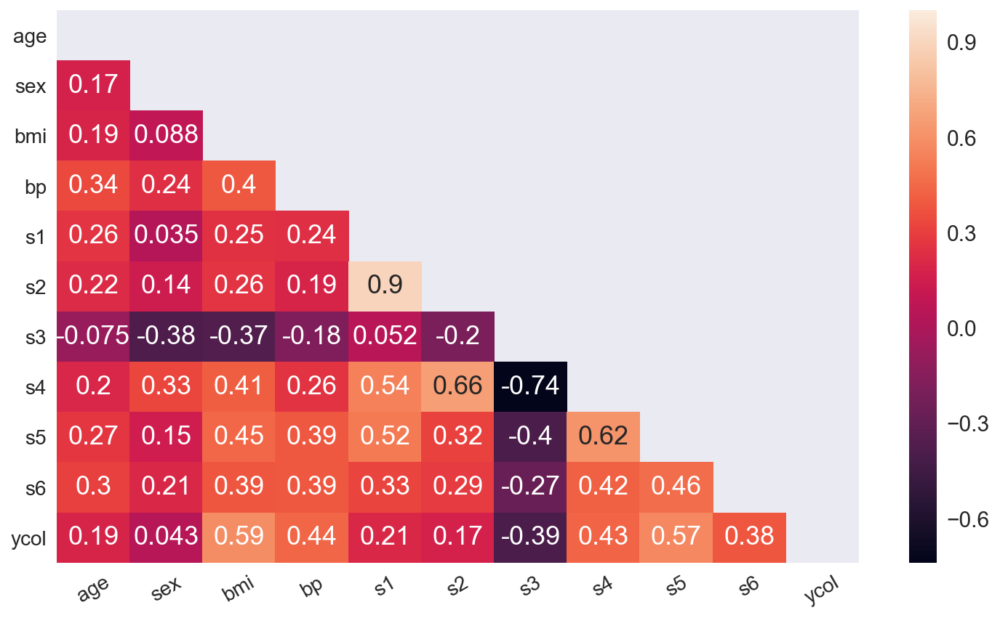

In [201]:
from sklearn import datasets
data_regression = datasets.load_diabetes()
df = pd.DataFrame(data_regression['data'], columns=data_regression['feature_names'])
df['ycol'] = data_regression['target']
df.head()
X = df.drop('ycol', axis=1)
y = df['ycol'].values
# create a heatmap: remove non-numerical columns first
#df.drop(['col1','col2','col3'], axis=1, inplace=True)
    
corrs = df.corr()

# Set the default matplotlib figure size:
fig, ax = plt.subplots(figsize=(11,7))

# Generate a mask for the upper triangle (taken from seaborn example gallery)
mask = np.zeros_like(corrs, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Plot the heatmap with seaborn.
# Assign the matplotlib axis the function returns. This will let us resize the labels.
ax = sns.heatmap(corrs, mask=mask, annot=True) #with numbers
#ax = sns.heatmap(corr, mask=mask, ax=ax) #withoutnumbers
# Resize the labels.
ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=14, rotation=30)
ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=14, rotation=0)

# If you put plt.show() at the bottom, it prevents those useless printouts from matplotlib.    
plt.show()

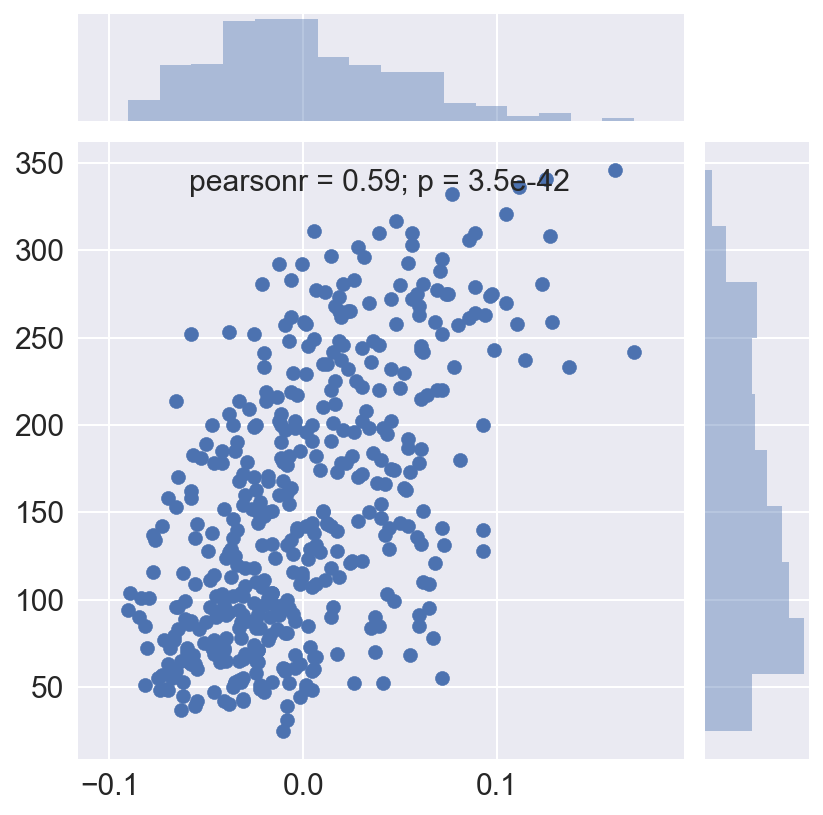

In [202]:
#for a simple model plot each Xcol to y(ensuring linear relation)
sns.jointplot(df['bmi'].values, y)
# sns.jointplot(df[[c for c in df.columns if not c in ['col1', 'col2']]].values, y)
# sns.jointplot(df[[c for c in df.columns if c.startswith('XyZ)].values, y)

/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)
/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:475: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  grid,delta = np.linspace(a,b,gridsize,retstep=True)


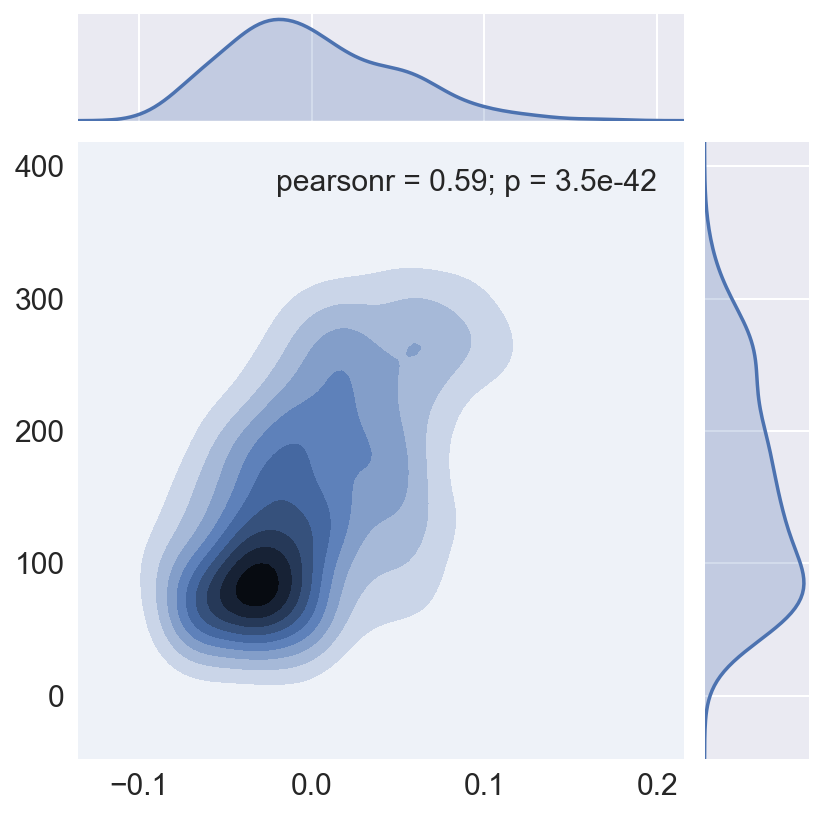

In [203]:
sns.jointplot(df['bmi'].values, y, kind='kde');

/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:967: UserWarning: The following kwargs were not used by contour: 'label', 'color'
  s)


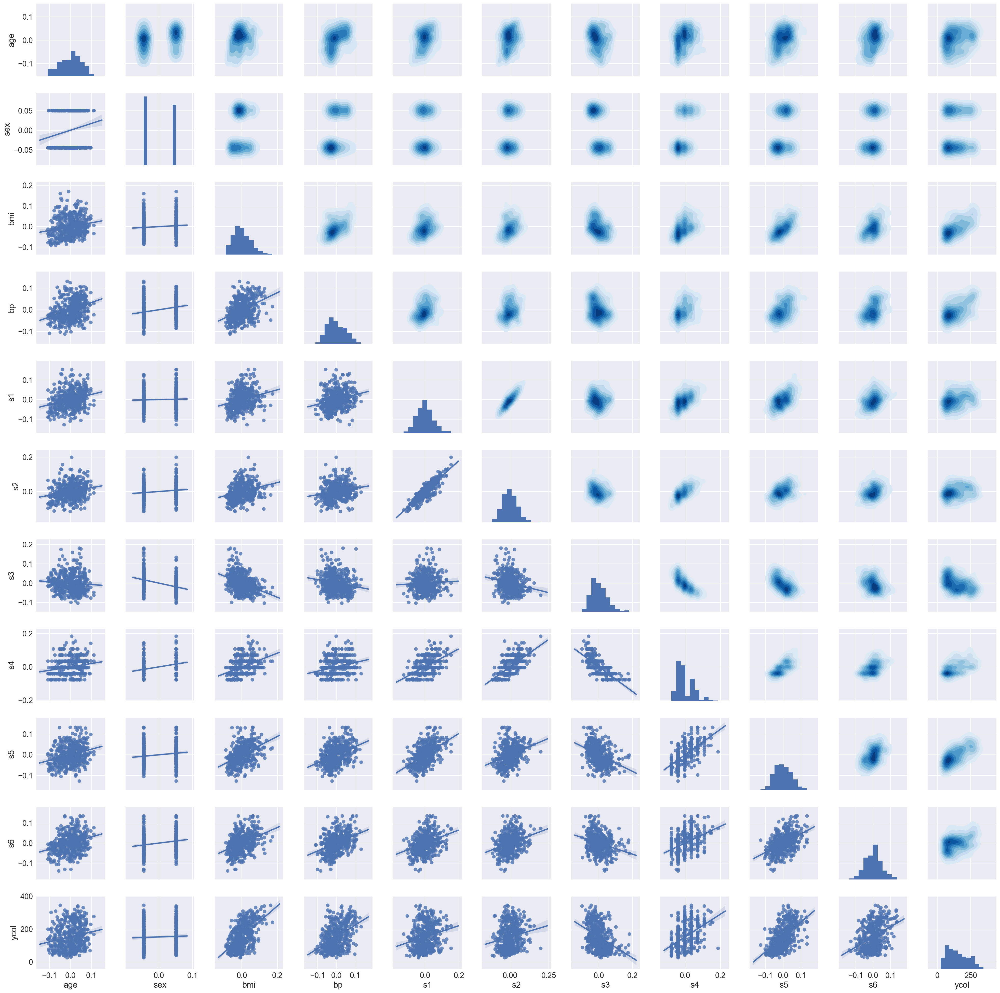

In [66]:
#or more fancy:
sns.set(font_scale=1.5)
g = sns.PairGrid(df) # or 
g = g.map_lower(sns.regplot)    # regression plots in lower tri
g = g.map_upper(sns.kdeplot, cmap="Blues", shade=True, shade_lowest=False)  # KDE plots in upper tri
g = g.map_diag(plt.hist)        # histograms along diagonal

plt.show()

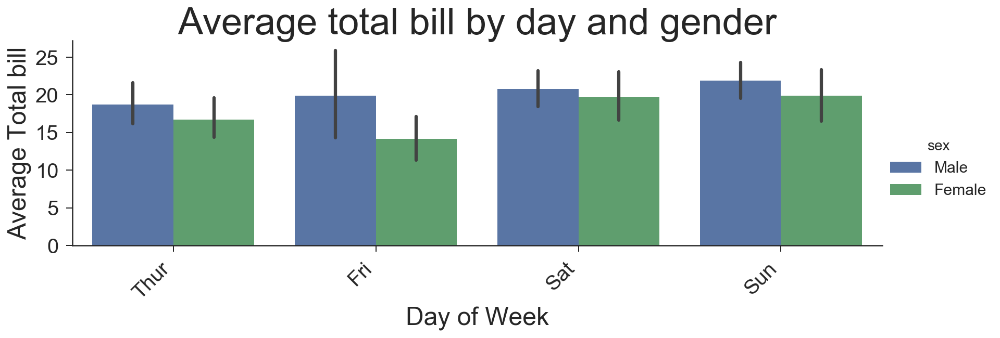

In [211]:
tips = sns.load_dataset('tips')
with sns.axes_style(style='ticks'):
    g = sns.factorplot("day", "total_bill", "sex", data=tips, kind='bar', aspect=3)
    g.set_axis_labels("Day", "Total Bill");
    g.set_xticklabels(rotation=45, horizontalalignment='right',
              fontsize=20).set_yticklabels(fontsize=20)
plt.xlabel('Day of Week',fontsize=24)
plt.ylabel('Average Total bill',fontsize=24)
plt.title('Average total bill by day and gender', fontsize=36)
plt.show()

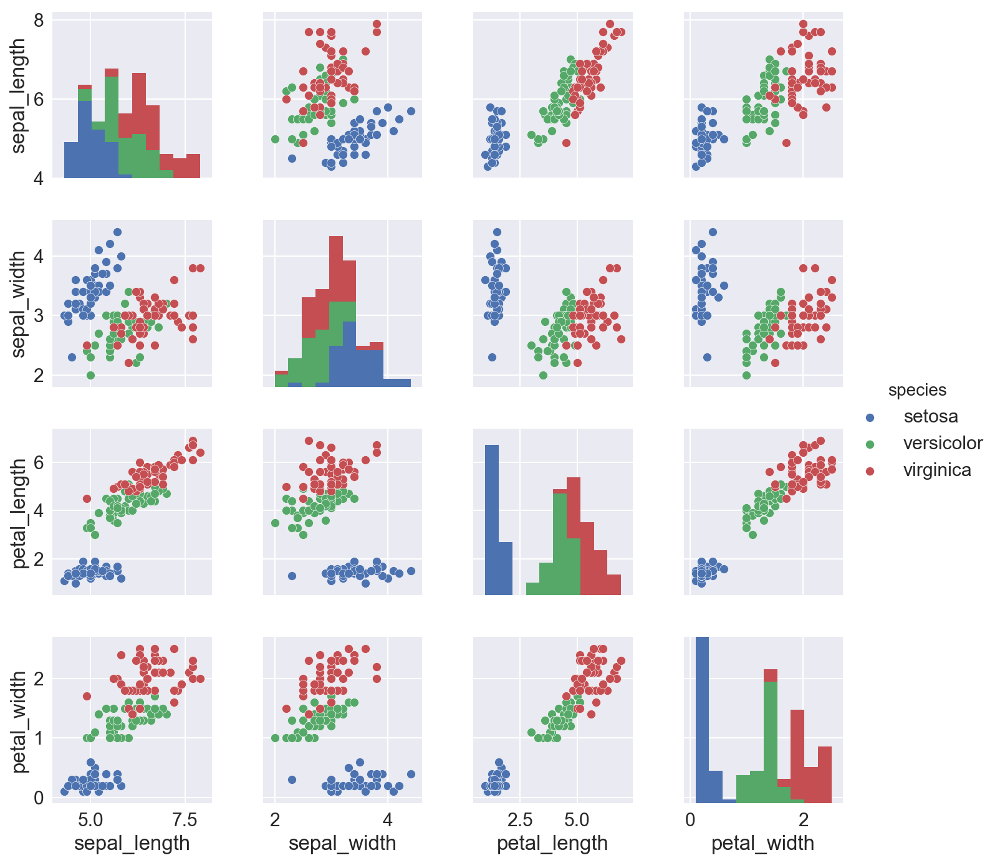

In [204]:
#pair plot with hue can be useful:
iris = sns.load_dataset("iris")
sns.pairplot(iris, hue='species', size=2.5);

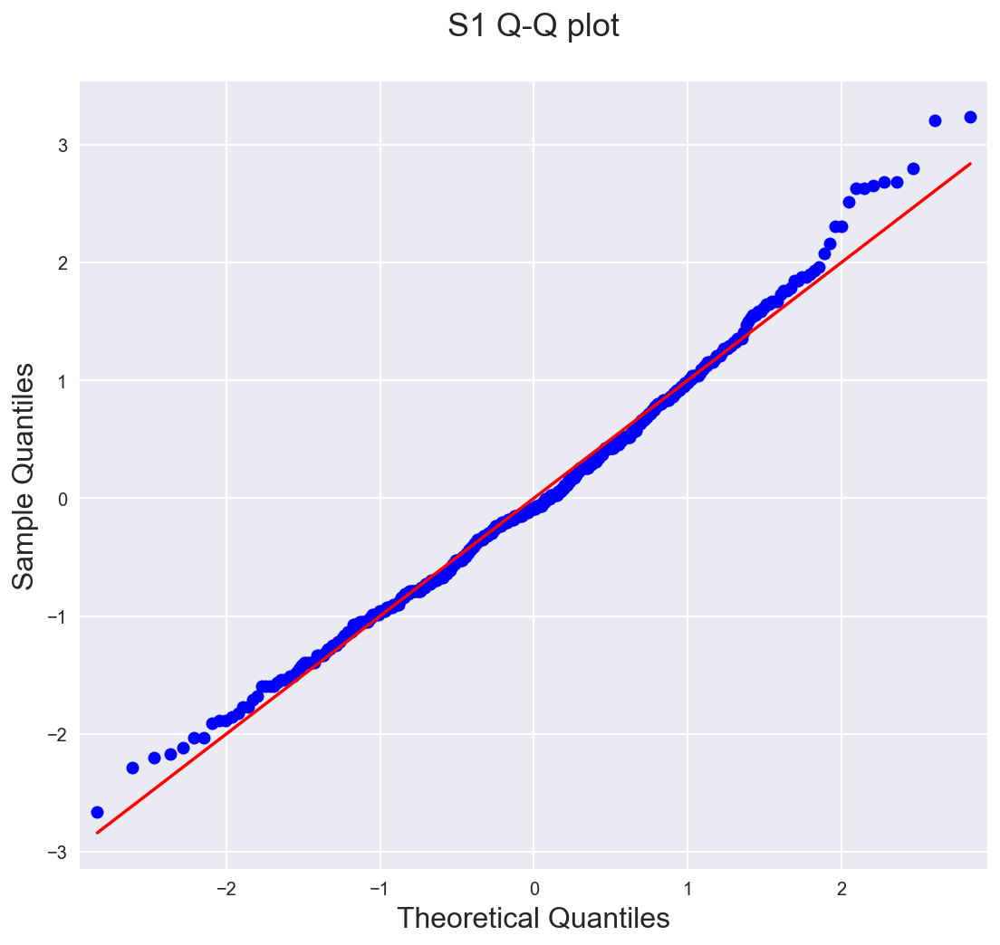

In [83]:
#Q-Q-Plot Check for Normal Distribution
import statsmodels.api as sm
fig = plt.figure(figsize=(8, 8))
ax = plt.gca()
sm.qqplot(df['s1'], line='s', fit=True, ax=ax)
plt.xlabel('Theoretical Quantiles', fontsize=16)
plt.ylabel('Sample Quantiles', fontsize=16)
ax.set_title(f"S1 Q-Q plot\n", fontsize=18)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

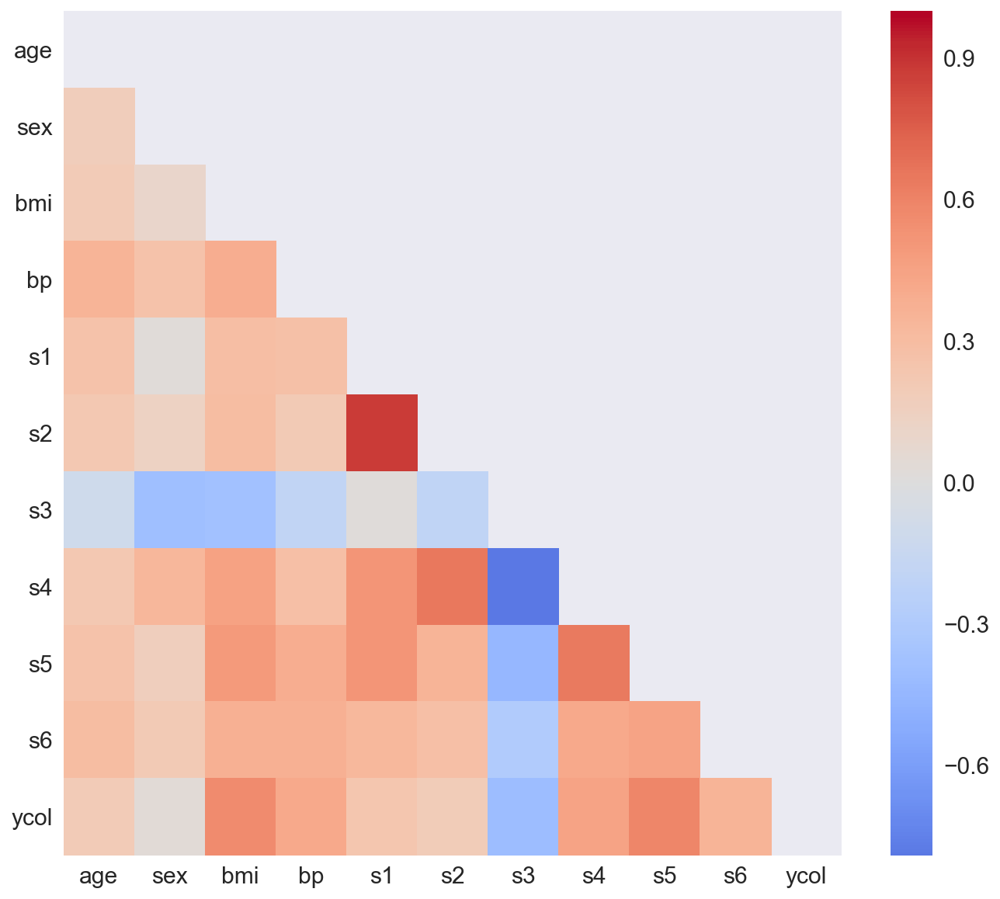

In [78]:
#prettier heatmap
fig, ax = plt.subplots(figsize=(10,10))
# Generate a mask for the upper triangle (taken from seaborn example gallery)
mask = np.zeros_like(corrs, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
ax = sns.heatmap(df.corr(method='spearman'), mask=mask, ax=ax, cmap='coolwarm', center=0) #withoutnumbers
#sns.heatmap(df.corr(method='spearman'), cmap='coolwarm', center=0, annot=True, mask=mask)
plt.yticks(rotation=0);

## Linear
## Non-linear

# Modeling
## Model selection

## Preprocessing

Data will need to be preprocessed for the models to work. Essentially all text needs to be transformed to integers for the models to work. The applies to language as well as categorical data. Although not all models require it, it is best practice to scale the X data. In some cases normalization is required.  
**Notes**   
Text cleaning is considered data cleaning.  
While some SKlearn models will handle NaN's and for quick and dirty prototyping this can be acceptable. Complete data cleaning is assumed here.

### Text

In [50]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.tree import DecisionTreeClassifier
import pandas as pd
import numpy as np
df = pd.DataFrame({'tweets': ['one', 'two', 'one two three', 'four'], 'labels': [1, 0, 1, 0]})
vectoriser = CountVectorizer()
df['tweetsVect'] = list(vectoriser.fit_transform(df['tweets']).toarray())
tree = DecisionTreeClassifier()
tree.fit(df['tweetsVect'].tolist(), df['labels'].tolist())

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

### Categoricals

#### Encoding

##### Ordinals

Ordinal variables are categorical variables where order matters and an integer value may have a meaning. E.g. 1 to 5 stars, S/M/L T-shirt sizes. Unfortunately SkLearn preprocessors do not deliver any working solution (the sklearn.preprocessing.CategoricalEncoder was planned for  scikit-learn 0.20 but was pulled). Below the Python and the Pandas routes.
  
Obviously this approach is not sound statistically however it is a common practice and often produces meaningful results.

In [84]:
df = pd.DataFrame(data_prep)
#Python
def item_category_maker(x):
    x = x.lower() #force lowercase
    if 'excellent' in x:
        return 5
    elif 'very good' in x :
        return 4
    elif 'good' in x:
        return 3
    elif 'fair' in x:
        return 2
    elif 'appalling' in x:
        return 1
    else:
        return 0 # have a left over answer
    
df['col5'] = df['col4'].map(item_category_maker)
print(df['col5'].unique())
print(df['col5'].value_counts())
df

[5 4 3 2 1]
5    2
4    2
3    2
2    2
1    2
Name: col5, dtype: int64


,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol,col5
0,row1,1,1.1,-4,excellent,aaa,red,NaN,True,5
1,row2,2,2.2,-3,excellent,bbb,blue,square,True,5
2,row3,3,3.3,-2,very good,ccc,green,square,True,4
3,row4,4,4.4,-1,very good,ddd,orange,circle,True,4
4,row5,5,NaN,0,good,eee,NaN,circle,True,3
5,row6,6,6.6,1,good,fff,purple,???,False,3
6,row_7,7,7.7,2,fair,ggg,white,triangle,False,2
7,row_8,8,8.8,Nan,fair,hhh,black,triangle,False,2
8,Row9,9,NaN,4,appalling,iii,brown,triangle,False,1
9,Row10,10,100.1,5,appalling,jjj,gray,triangle,False,1


In [86]:
#Pandas
df['col7'] = 0 
df.loc[df['col4'] == 'excellent', 'col7'] = 5
df.loc[df['col4'] == 'very good', 'col7'] = 4
df.loc[df['col4'] == 'good', 'col7'] = 3
df.loc[df['col4'] == 'fair', 'col7'] = 2
df.loc[df['col4'] == 'appalling', 'col7'] = 1
df
#also works as find/replace

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol,col5,col7,col6
0,row1,1,1.1,-4,excellent,aaa,red,NaN,True,5,5,5.0
1,row2,2,2.2,-3,excellent,bbb,blue,square,True,5,5,5.0
2,row3,3,3.3,-2,very good,ccc,green,square,True,4,4,4.0
3,row4,4,4.4,-1,very good,ddd,orange,circle,True,4,4,4.0
4,row5,5,NaN,0,good,eee,NaN,circle,True,3,3,3.0
5,row6,6,6.6,1,good,fff,purple,???,False,3,3,3.0
6,row_7,7,7.7,2,fair,ggg,white,triangle,False,2,2,2.0
7,row_8,8,8.8,Nan,fair,hhh,black,triangle,False,2,2,2.0
8,Row9,9,NaN,4,appalling,iii,brown,triangle,False,1,1,1.0
9,Row10,10,100.1,5,appalling,jjj,gray,triangle,False,1,1,1.0


##### Nominal categorical

Order does not matter and the value assigned has no significance, may be used in classifiers. Dummify/OneHotEncode for regressors   
  ** Note: ** Drop_first will ensure independence and avoid collinearity 

In [87]:
#SKLearn
import category_encoders as ce

# encoder = ce.BackwardDifferenceEncoder(cols=[...])
# encoder = ce.BinaryEncoder(cols=[...])
# encoder = ce.HashingEncoder(cols=[...])
# encoder = ce.HelmertEncoder(cols=[...])
encoder = ce.OneHotEncoder(cols=['col4'])
# encoder = ce.OrdinalEncoder(cols=['col4'])
#encoder = ce.OrdinalEncoder(cols=['col4'])
# encoder = ce.SumEncoder(cols=[...])
# encoder = ce.PolynomialEncoder(cols=[...])
# encoder = ce.BaseNEncoder(cols=[...])
# encoder = ce.TargetEncoder(cols=[...])
# encoder = ce.LeaveOneOutEncoder(cols=[...])

df_clean = encoder.fit_transform(df)
df_clean = df_clean.drop(['col4_1'], axis=1) #drop_first
df_clean

,col4_2,col4_3,col4_4,col4_5,col4_-1,Col0,Col1,col2,col3,col_a,col_b,colc,ycol,col5,col7,col6
0,0,0,0,0,0,row1,1,1.1,-4,aaa,red,NaN,True,5,5,5.0
1,0,0,0,0,0,row2,2,2.2,-3,bbb,blue,square,True,5,5,5.0
2,1,0,0,0,0,row3,3,3.3,-2,ccc,green,square,True,4,4,4.0
3,1,0,0,0,0,row4,4,4.4,-1,ddd,orange,circle,True,4,4,4.0
4,0,1,0,0,0,row5,5,NaN,0,eee,NaN,circle,True,3,3,3.0
5,0,1,0,0,0,row6,6,6.6,1,fff,purple,???,False,3,3,3.0
6,0,0,1,0,0,row_7,7,7.7,2,ggg,white,triangle,False,2,2,2.0
7,0,0,1,0,0,row_8,8,8.8,Nan,hhh,black,triangle,False,2,2,2.0
8,0,0,0,1,0,Row9,9,NaN,4,iii,brown,triangle,False,1,1,1.0
9,0,0,0,1,0,Row10,10,100.1,5,jjj,gray,triangle,False,1,1,1.0


In [88]:
#Pandas
df_clean = pd.get_dummies(data=df, columns=['col4'], prefix_sep= '_', drop_first=True)
df_clean

,Col0,Col1,col2,col3,col_a,col_b,colc,ycol,col5,col7,col6,col4_excellent,col4_fair,col4_good,col4_very good
0,row1,1,1.1,-4,aaa,red,NaN,True,5,5,5.0,1,0,0,0
1,row2,2,2.2,-3,bbb,blue,square,True,5,5,5.0,1,0,0,0
2,row3,3,3.3,-2,ccc,green,square,True,4,4,4.0,0,0,0,1
3,row4,4,4.4,-1,ddd,orange,circle,True,4,4,4.0,0,0,0,1
4,row5,5,NaN,0,eee,NaN,circle,True,3,3,3.0,0,0,1,0
5,row6,6,6.6,1,fff,purple,???,False,3,3,3.0,0,0,1,0
6,row_7,7,7.7,2,ggg,white,triangle,False,2,2,2.0,0,1,0,0
7,row_8,8,8.8,Nan,hhh,black,triangle,False,2,2,2.0,0,1,0,0
8,Row9,9,NaN,4,iii,brown,triangle,False,1,1,1.0,0,0,0,0
9,Row10,10,100.1,5,jjj,gray,triangle,False,1,1,1.0,0,0,0,0


For classifiers a categoriser is a better option

In [90]:
import category_encoders as ce

# encoder = ce.BackwardDifferenceEncoder(cols=[...])
# encoder = ce.BinaryEncoder(cols=[...])
# encoder = ce.HashingEncoder(cols=[...])
# encoder = ce.HelmertEncoder(cols=[...])
# encoder = ce.OneHotEncoder(cols=['col4'])
# encoder = ce.OrdinalEncoder(cols=['col4'])
encoder = ce.OrdinalEncoder(cols=['colc'])
# encoder = ce.SumEncoder(cols=[...])
# encoder = ce.PolynomialEncoder(cols=[...])
# encoder = ce.BaseNEncoder(cols=[...])
# encoder = ce.TargetEncoder(cols=[...])
# encoder = ce.LeaveOneOutEncoder(cols=[...])

df_clean = encoder.fit_transform(df)
# X_cleaned = encoder.transform(X_dirty)
df_clean

,Col0,Col1,col2,col3,col4,col_a,col_b,ycol,col5,col7,col6,colc
0,row1,1,1.1,-4,excellent,aaa,red,True,5,5,5.0,1
1,row2,2,2.2,-3,excellent,bbb,blue,True,5,5,5.0,2
2,row3,3,3.3,-2,very good,ccc,green,True,4,4,4.0,2
3,row4,4,4.4,-1,very good,ddd,orange,True,4,4,4.0,3
4,row5,5,NaN,0,good,eee,NaN,True,3,3,3.0,3
5,row6,6,6.6,1,good,fff,purple,False,3,3,3.0,4
6,row_7,7,7.7,2,fair,ggg,white,False,2,2,2.0,5
7,row_8,8,8.8,Nan,fair,hhh,black,False,2,2,2.0,5
8,Row9,9,NaN,4,appalling,iii,brown,False,1,1,1.0,5
9,Row10,10,100.1,5,appalling,jjj,gray,False,1,1,1.0,5


##### Booleans

While most models will handle booleans out of the box for consistency purposes these may be encoded. **note** When creating 2 separate columns drop 1

In [10]:
df['ycol'] = df['ycol']*1
df

,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol,col6,col5
0,row1,1,1.1,-4,excellent,aaa,red,square,1,5,5
1,row2,2,2.2,-3,excellent,bbb,blue,square,1,5,5
2,row3,3,3.3,-2,very good,ccc,green,square,1,4,4
3,row4,4,4.4,-1,very good,ddd,orange,circle,1,4,4
4,row5,5,5.5,0,good,eee,yellow,circle,1,3,3
5,row6,6,6.6,1,good,fff,purple,circle,0,3,3
6,row_7,7,7.7,2,fair,ggg,white,triangle,0,2,2
7,row_8,8,8.8,Nan,fair,hhh,black,triangle,0,2,2
8,Row9,9,9.9,4,appalling,iii,brown,triangle,0,1,1
9,Row10,10,10.1,5,appalling,jjj,gray,triangle,0,1,1


In [393]:
df.T.copy()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441
age,0.038076,-0.001882,0.085299,-0.089063,0.005383,-0.092695,-0.045472,0.063504,0.041708,-0.070900,-0.096328,0.027178,0.016281,0.005383,0.045341,-0.052738,-0.005515,0.070769,-0.038207,-0.027310,-0.049105,-0.085430,-0.085430,0.045341,-0.063635,-0.067268,-0.107226,-0.023677,0.052606,0.067136,-0.060003,-0.023677,0.034443,0.030811,0.016281,0.048974,0.012648,-0.009147,-0.001882,-0.001882,0.005383,-0.099961,-0.060003,0.019913,0.045341,0.027178,-0.056370,-0.078165,0.067136,-0.041840,0.034443,0.059871,-0.052738,-0.009147,-0.049105,-0.041840,-0.041840,-0.027310,0.041708,0.063504,-0.070900,-0.041840,-0.027310,-0.034575,0.067136,-0.045472,-0.009147,0.041708,0.038076,0.016281,-0.001882,-0.001882,0.063504,0.012648,0.012648,-0.009147,-0.030942,-0.096328,0.005383,-0.103593,0.070769,0.012648,-0.016412,-0.038207,0.001751,0.045341,-0.070900,0.045341,-0.052738,-0.045472,0.012648,0.045341,-0.020045,-0.049105,-0.078165,-0.070900,0.056239,-0.027310,0.001751,-0.001882,0.016281,0.016281,-0.092695,0.059871,-0.027310,0.023546,-0.096328,0.027178,0.019913,0.038076,0.041708,0.019913,-0.085430,0.019913,0.023546,-0.030942,0.048974,0.059871,-0.056370,0.016281,-0.049105,0.063504,0.048974,0.005383,-0.005515,-0.005515,-0.089063,0.034443,-0.052738,0.009016,-0.063635,-0.096328,0.016281,-0.041840,-0.074533,-0.005515,-0.092695,0.005383,0.034443,0.023546,0.041708,-0.027310,0.041708,-0.030942,0.030811,-0.041840,-0.030942,-0.056370,-0.060003,-0.049105,0.023546,0.001751,-0.034575,0.041708,0.067136,-0.027310,-0.016412,-0.001882,-0.012780,-0.005515,-0.009147,-0.045472,-0.052738,0.016281,0.045341,-0.041840,-0.056370,0.070769,0.001751,-0.001882,0.023546,-0.020045,0.041708,-0.063635,0.016281,0.067136,0.045341,0.048974,0.041708,-0.023677,-0.038207,0.048974,0.045341,0.045341,0.016281,-0.074533,-0.081798,-0.067268,0.005383,-0.001882,0.009016,-0.005515,0.056239,0.009016,-0.067268,0.027178,-0.023677,0.048974,-0.052738,0.041708,0.056239,-0.034575,0.081666,-0.001882,0.110727,-0.030942,0.001751,0.009016,0.030811,0.038076,0.009016,0.092564,0.067136,0.001751,0.030811,0.027178,0.012648,0.074401,-0.041840,-0.089063,0.023546,-0.045472,-0.023677,-0.099961,-0.027310,0.030811,-0.103593,0.067136,-0.052738,-0.027310,-0.038207,0.009016,0.012648,0.067136,0.045341,0.067136,0.027178,0.056239,0.034443,0.023546,0.048974,0.030811,-0.103593,0.016281,-0.060003,-0.027310,0.0

#### Under sampling
#### Oversampling
### Numericals

#### Nominals

In [422]:
# Box-Cox transform not normally distributed data to possible more of a normal distribution
df = pd.DataFrame(data_prep)
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer()
X = df.Col1.values.reshape(-1, 1) # or X = df[['Col1']]
print(pt.fit)
df['col8'] = pt.fit_transform(X)
df['col9'] = pt.inverse_transform(df[['col8']])
df

<bound method PowerTransformer.fit of PowerTransformer(copy=True, method='box-cox', standardize=True)>


,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol,col8,col9
0,row1,1,1.1,-4,excellent,aaa,red,NaN,True,-1.72,1.0
1,row2,2,2.2,-3,excellent,bbb,blue,square,True,-1.24,2.0
2,row3,3,3.3,-2,very good,ccc,green,square,True,-0.82,3.0
3,row4,4,4.4,-1,very good,ddd,orange,circle,True,-0.44,4.0
4,row5,5,NaN,0,good,eee,NaN,circle,True,-0.09,5.0
5,row6,6,6.6,1,good,fff,purple,???,False,0.25,6.0
6,row_7,7,7.7,2,fair,ggg,white,triangle,False,0.57,7.0
7,row_8,8,8.8,Nan,fair,hhh,black,triangle,False,0.87,8.0
8,Row9,9,NaN,4,appalling,iii,brown,triangle,False,1.17,9.0
9,Row10,10,100.1,5,appalling,jjj,gray,triangle,False,1.46,10.0


#### Polynomials

In [220]:
df = pd.DataFrame(data_prep)
df = df.dropna()

from sklearn.preprocessing import PolynomialFeatures
pf = PolynomialFeatures(degree=3)
poly_df = pf.fit_transform([df['Col1'], df['col2']][:3])
poly_df = pd.DataFrame(poly_df, columns=pf.get_feature_names())
poly_df

,1,x0,x1,x2,x3,x4,x5,x6,x0^2,x0 x1,x0 x2,x0 x3,x0 x4,x0 x5,x0 x6,x1^2,x1 x2,x1 x3,x1 x4,x1 x5,x1 x6,x2^2,x2 x3,x2 x4,x2 x5,x2 x6,x3^2,x3 x4,x3 x5,x3 x6,x4^2,x4 x5,x4 x6,x5^2,x5 x6,x6^2,x0^3,x0^2 x1,x0^2 x2,x0^2 x3,x0^2 x4,x0^2 x5,x0^2 x6,x0 x1^2,x0 x1 x2,x0 x1 x3,x0 x1 x4,x0 x1 x5,x0 x1 x6,x0 x2^2,x0 x2 x3,x0 x2 x4,x0 x2 x5,x0 x2 x6,x0 x3^2,x0 x3 x4,x0 x3 x5,x0 x3 x6,x0 x4^2,x0 x4 x5,x0 x4 x6,x0 x5^2,x0 x5 x6,x0 x6^2,x1^3,x1^2 x2,x1^2 x3,x1^2 x4,x1^2 x5,x1^2 x6,x1 x2^2,x1 x2 x3,x1 x2 x4,x1 x2 x5,x1 x2 x6,x1 x3^2,x1 x3 x4,x1 x3 x5,x1 x3 x6,x1 x4^2,x1 x4 x5,x1 x4 x6,x1 x5^2,x1 x5 x6,x1 x6^2,x2^3,x2^2 x3,x2^2 x4,x2^2 x5,x2^2 x6,x2 x3^2,x2 x3 x4,x2 x3 x5,x2 x3 x6,x2 x4^2,x2 x4 x5,x2 x4 x6,x2 x5^2,x2 x5 x6,x2 x6^2,x3^3,x3^2 x4,x3^2 x5,x3^2 x6,x3 x4^2,x3 x4 x5,x3 x4 x6,x3 x5^2,x3 x5 x6,x3 x6^2,x4^3,x4^2 x5,x4^2 x6,x4 x5^2,x4 x5 x6,x4 x6^2,x5^3,x5^2 x6,x5 x6^2,x6^3
0,1.0,2.0,3.0,4.0,6.0,7.0,8.0,10.0,4.00,6.00,8.00,12.00,14.00,16.00,20.00,9.00,12.00,18.00,21.00,24.00,30.00,16.00,24.00,28.00,32.00,40.00,36.00,42.00,48.00,60.00,49.00,56.00,70.00,64.00,80.00,100.00,8.000,12.000,16.000,24.000,28.000,32.000,40.000,18.000,24.000,36.000,42.000,48.000,60.000,32.000,48.000,56.000,64.000,80.000,72.000,84.000,96.000,120.000,98.000,112.000,140.000,128.000,160.000,200.000,27.000,36.000,54.000,63.000,72.000,90.000,48.000,72.000,84.000,96.000,120.000,108.000,126.000,144.000,180.000,147.000,168.000,210.000,192.000,240.000,300.000,64.000,96.000,112.000,128.000,160.000,144.000,168.000,192.000,240.000,196.000,224.000,280.000,256.000,320.000,400.000,216.000,252.000,288.000,360.000,294.000,336.000,420.000,384.000,480.000,600.000,343.000,392.000,490.000,448.000,560.000,700.000,512.000,640.000,800.000,1000.000
1,1.0,2.2,3.3,4.4,6.6,7.7,8.8,100.1,4.84,7.26,9.68,14.52,16.94,19.36,220.22,10.89,14.52,21.78,25.41,29.04,330.33,19.36,29.04,33.88,38.72,440.44,43.56,50.82,58.08,660.66,59.29,67.76,770.77,77.44,880.88,10020.01,10.648,15.972,21.296,31.944,37.268,42.592,484.484,23.958,31.944,47.916,55.902,63.888,726.726,42.592,63.888,74.536,85.184,968.968,95.832,111.804,127.776,1453.452,130.438,149.072,1695.694,170.368,1937.936,22044.022,35.937,47.916,71.874,83.853,95.832,1090.089,63.888,95.832,111.804,127.776,1453.452,143.748,167.706,191.664,2180.178,195.657,223.608,2543.541,255.552,2906.904,33066.033,85.184,127.776,149.072,170.368,1937.936,191.664,223.608,255.552,2906.904,260.876,298.144,3391.388,340.736,3875.872,44088.044,287.496,335.412,383.328,4360.356,391.314,447.216,5087.082,511.104,5813.808,66132.066,456.533,521.752,5934.929,596.288,6782.776,77154.077,681.472,7751.744,88176.088,1003003.001


In [423]:
import category_encoders as ce

#encoder = ce.BackwardDifferenceEncoder(cols=['Col1'])
#encoder = ce.BinaryEncoder(cols=['colc'])
#encoder = ce.HashingEncoder(cols=['col_b'])
# encoder = ce.HelmertEncoder(cols=[...])
#encoder = ce.OneHotEncoder(cols=['col4'])
# encoder = ce.OrdinalEncoder(cols=['col4'])
#encoder = ce.OrdinalEncoder(cols=['col4'])
# encoder = ce.SumEncoder(cols=['col4'])
# encoder = ce.PolynomialEncoder(cols=[...])
# encoder = ce.BaseNEncoder(cols='col1')
# encoder = ce.TargetEncoder(cols=['colc'])
encoder = ce.LeaveOneOutEncoder(cols=['colc'])

df_clean = encoder.fit_transform(df)
# X_cleaned = encoder.transform(X_dirty)
df_clean

TypeError: fit() missing 1 required positional argument: 'y'

Good explanation of:
- encoder = ce.BackwardDifferenceEncoder(cols=['Col1'])
- encoder = ce.HelmertEncoder(cols=[...])  
- encoder = ce.SumEncoder(cols=[...])
http://psych.colorado.edu/~carey/Courses/PSYC5741/handouts/Coding%20Categorical%20Variables%202006-03-03.pdf

Create a unigue binary code for each category:
- encoder = ce.BinaryEncoder(cols=['colc'])
- encoder = ce.HashingEncoder(cols=[...])
 

encoder = ce.BaseNEncoder(cols=[...])
encoder = ce.TargetEncoder(cols=[...])
https://kaggle2.blob.core.windows.net/forum-message-attachments/225952/7441/high%20cardinality%20categoricals.pdf
encoder = ce.LeaveOneOutEncoder(cols=[...])
https://kaggle2.blob.core.windows.net/forum-message-attachments/225952/7441/high%20cardinality%20categoricals.pdf


#### Scaling

Scale your X's not y: you would loose units scaling on y
Standardizes/scales centers of the data around mean 0 with std 1

** Note ** for decisionstrees : scaling  y is possible(and wise!)


In [425]:
from sklearn.preprocessing import StandardScaler
# initialize the Scaler
ss = StandardScaler()
# Fit the data using the scaler (scale the data)
X = ss.fit(X_train) #scale on X-train
#or subset X = ss.fit_transform(df[['col1', 'col2']]) 
X_train = ss.transform(X_train)#transform the data sets
X_test= ss.transform(X_test)
print (X_train.mean(), X_train.std())

#In DF formate:
scaler = StandardScaler()
pd.DataFrame(scaler.fit_transform(df), columns = df.columns)

-5.415722071342227e-17 1.0000000000000002


ValueError: could not convert string to float: 'triangle'

In [161]:
X

,A,B
0,-0.99,-1.13
1,-0.17,-0.47
2,-0.58,-0.13
3,-0.17,-0.13
4,1.90,1.86


In [162]:
ss.get_params

<bound method BaseEstimator.get_params of StandardScaler(copy=True, with_mean=True, with_std=True)>

In [165]:
ss.inverse_transform(X_train)

array([[ 0.4472136 ],
       [ 1.34164079],
       [-1.34164079],
       [-0.4472136 ]])

#### Normalizing
Normalization forces the data between 0 and 1 

In [ ]:
from sklearn.preprocessing import Normalizer
# initialize the Scaler
nor = Normalizer()
# Fit the data using the scaler (scale the data)
X = nor.fit(X_train.values) #scale on X-train
#or subset X = ss.fit_transform(df[['col1', 'col2']]) 
X_train = nor.transform(X_train)#transform the data sets
X_test= nor.transform(X_test)
print (X.mean(), X.std())

#In DF formate:
nor = Normalizer()
X = pd.DataFrame(nor.fit_transform(df), columns = df.columns)

## Define X and y

In [223]:
# remove categorical features
df.drop(['col1', 'col2', 'col3'], axis=1, inplace=True)
#or dummify
pd.get_dummies(df,columns=['col1'])
#X = pd.get_dummies(X,drop_first=True) #drop_first=True if using in a model

# if you do not use patsy:
# define X and y
X = df.drop('yCol', axis=1)
# or
X = [['col1', 'col2', 'col3']] #!!!!!! [[]] 
y = df['ycol'].values
#or
X = df[[c for c in df.columns if not c in ['col1', 'col2']]]
X = df[[c for c in df.columns if c.startswith('XyZ')]]
#or with y in last column
feature_set = X  == data.iloc[:, :-1]
target = y == data.iloc[:, -1]



ValueError: labels ['col1'] not contained in axis

### Train test split

In [5]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2)
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(120, 4) (120,)
(30, 4) (30,)


## Processing

### SKlearn Generic proces - Regression

In [331]:
df = pd.DataFrame({'X': [1, 2, 3, 3, 4], 'y': [2, 3, 4, 4, 3]})
from sklearn.linear_model import LinearRegression
X = df_[['X']]# or df_.X.values.reshape(-1,1)
y = df_[['y']]# or df_.y.values.reshape(-1,1)
model = LinearRegression()
model.fit(X,y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

Methods

- model.fit(X, y[, sample_weight])  
Fit linear model.
- model.get_params([deep])	
Get parameters for this estimator.
- model.predict(X)	
Predict using the linear model
- model.score(X, y[, sample_weight])  
Returns the coefficient of determination R^2 of the prediction.
- model.set_params(** params)	
Set the parameters of this estimator.

Get the coeficients and intercept by:
- model.coef_   
- model.intercept_ 

In [332]:
model.get_params

<bound method BaseEstimator.get_params of LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)>

In [333]:
pd.set_option("display.precision", 2) #just the display!
dfpred = pd.DataFrame({'Xpred': [3,5,2,6]})
Xpred = dfpred[['Xpred']]
dfpred['yhat'] = model.predict(Xpred)
dfpred

,Xpred,yhat
0,3,3.38
1,5,4.31
2,2,2.92
3,6,4.77


In [334]:
print(f"The model's R squared = {round(model.score(X,y),3)}")

The model's R squared = 0.396


In [335]:
model.coef_

array([[0.46153846]])

In [336]:
model.intercept_

array([2.])

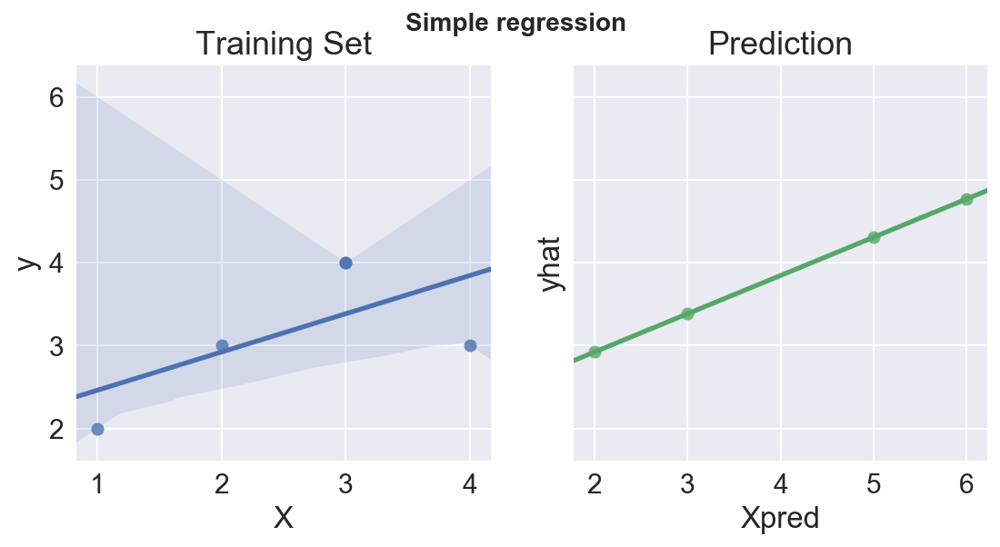

In [341]:
fig, axs = plt.subplots(ncols=2,figsize=(8,4), sharey=True)

sns.regplot(x='X', y='y', data=df_, ax=axs[0])
axs[0].set_title("Training Set")
sns.regplot(x='Xpred', y='yhat', data=dfpred, ax=axs[1])
axs[1].set_title("Prediction")
fig.suptitle('Simple regression', fontsize=14, fontweight='bold')

plt.show();

## SKlearn generic Cross Validation process


Cross-validation, sometimes called rotation estimation, is a model validation technique for assessing how the results of a statistical analysis will generalize to an independent data set. It is mainly used in settings where the goal is prediction, and one wants to estimate how accurately a predictive model will perform in practice (https://www.researchgate.net/profile/Dibyajyoti_Chutia2).  

The goal of cross-validation is to estimate the expected level of fit of a model to a data set that is independent of the data that were used to train the model. 

Cross-validation is, thus, a generally applicable way to predict the performance of a model on unavailable data using numerical computation in place of theoretical analysis (https://en.wikipedia.org/wiki/Cross-validation_%28statistics%29#Measures_of_fit).

What you are looking for is **low** variability in the scores, i.e. consistent. High variability indicates bad generalization. (whereby consistently low scores indicate underfitting and consistently high scores overfitting)

Best practice is that CV does **not** dismiss the need for a train-test split, whereby the test set represents a $true$ hold-out set.

How many K- folds should there be:
    - Maximum is cv=n-1 aka Leave One Out CV aka LOOCV
    - For a classification problem  a good rule of thumb is that the smallest class should still have 30 occurences in every fold. 30 as a number of were a normal distribution becomes apparent. E.g. if the smallest class has >60 occurances cv=2, if >90: cv=3, etc
    -Minimum is number of folds K / number occurances in smallest class = 2, setting stratify=y. 
    - Bottomline: small datasets: cv=5, large datasets cv=10, with a holdout of 0,2 of 0,1
    
Ultimately, the final model gets retrained on the full data set.

It is important to realise that CV does not improve a model's predictive score, actually it has a negative effect (because training data is taken away). CV allows a preview of how well the model will perform when new data is presented.

#### Training

## SKlearn generic Cross Validation process - Regression


Cross-validation, sometimes called rotation estimation, is a model validation technique for assessing how the results of a statistical analysis will generalize to an independent data set. It is mainly used in settings where the goal is prediction, and one wants to estimate how accurately a predictive model will perform in practice (https://www.researchgate.net/profile/Dibyajyoti_Chutia2).  

The goal of cross-validation is to estimate the expected level of fit of a model to a data set that is independent of the data that were used to train the model. 

Cross-validation is, thus, a generally applicable way to predict the performance of a model on unavailable data using numerical computation in place of theoretical analysis (https://en.wikipedia.org/wiki/Cross-validation_%28statistics%29#Measures_of_fit).

What you are looking for is **low** variability in the scores, i.e. consistent. High variability indicates bad generalization. (whereby consistently low scores indicate underfitting and consistently high scores overfitting)

Best practice is that CV does **not** dismiss the need for a train-test split, whereby the test set represents a true hold-out set.

How many K- folds should there be:
    - Maximum is K=n-1 aka Leave One Out CV aka LOOCV
    - For a classification problem  a good rule of thumb is that the smallest class should still have 30 occurences in every fold. 30 as a number of were a normal distribution becomes apparent. E.g. if the smallest class has >60 occurances cv=2, >90: cv=3
    -Minimum is number of folds K / number occurances in smallest class = 2, setting stratify=y. 
    - Bottomline: small datasets: cv=5, large datasets cv=10, with a holdout of 0,2 of 0,1

#### Training

In [301]:
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn. metrics import r2_score


df = pd.DataFrame({'X': [1, 2, 3, 3, 4, 1, 2, 3, 3, 4, 1, 2, 3, 3, 4], 'y': [
                   2, 3, 4, 4, 3, 2, 3, 4, 4, 3, 2, 3, 4, 4, 3]})
df = df.append([df]*10) #create a larger dataset
from sklearn.linear_model import LinearRegression
X = df[['X']]  # or df_['X'].values.reshape(-1,1)
y = df['y']  # or df_['y'].values.reshape(-1,1)


from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, stratify=y, test_size=0.2)

from sklearn.preprocessing import StandardScaler
# initialize the Scaler
ss = StandardScaler()
# Fit the data using the scaler (scale the data)
ss.fit(X_train) #scale on X-train
#or subset X = ss.fit_transform(df[['col1', 'col2']]) 
X_train = ss.transform(X_train)#transform the data sets
X_test= ss.transform(X_test)
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)
model = LinearRegression()

# Perform 5-fold cross validation
scores = cross_val_score(model, X_train, y_train, cv=5)
model.fit(X_train, y_train)
# y_test_pred = model.predict(X_test)
r2_test = model.score(X_test, y_test)
print("Cross-validated scores:", scores)
print(f'Mean R2 of the trainning folds: {scores.mean()}')
print(f'R2 on test set: {r2_test}')
print('High variance in the scores, low and inconsistant predictive value')

(132, 1) (132,)
(33, 1) (33,)
Cross-validated scores: [0.4355065  0.16109218 0.34347624 0.38521524 0.3268901 ]
Mean R2 of the trainning folds: 0.33043605218577443
R2 on test set: 0.464267881610761
High variance in the scores, low and inconsistant predictive value


#### Testing

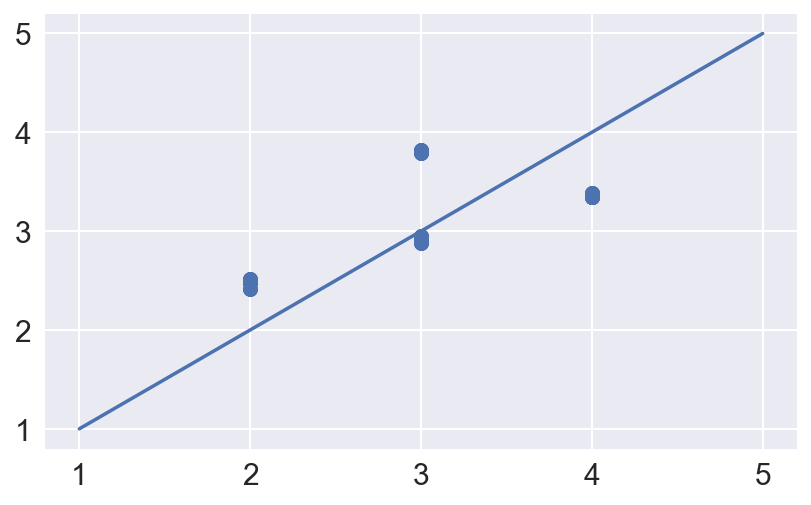

In [371]:
# Make cross validated predictions on the test sets
predictions = cross_val_predict(model, X_test, y_test)
#simple plot
point_1 = [1,5]
plt.plot(point_1,point_1)
plt.scatter(y_test, predictions)
plt.show()

#### Predicting on new data

Happens with the original (and accepted) model. I.e.  there is **not** something like cross_val(dot)predict. The predictions from cross_val_predict(model, X_train,y_train, cv=5) are the concatination of the predicted values from the hold-out fold of each iteration. For instance for 100 rows and cv=5, the first 20 come from the hold-out set from iteration 1 and the second 20 from  the hold out of the second iteration etc. (https://stackoverflow.com/questions/41458834/how-is-scikit-learn-cross-val-predict-accuracy-score-calculated/41524968#41524968)   

This means for prediction the, cross validated and accepted, model should be fitted on the complete data set first. I.e. not just the training set.

In [391]:
pd.set_option("display.precision", 2) #just the display!
dfpred = pd.DataFrame({'Xnew': [3,5,2,4]}) #create new X
ss = StandardScaler()
ss.fit_transform(X) # fit Scaler on entire data set
Xpred = ss.transform(dfpred[['Xnew']]) # scale new data with same mean
model.fit(X,y) # fit model on entire data set
dfpred['ypred'] = model.predict(Xpred) #predict new y's
dfpred

,Xnew,ypred
0,3,2.18
1,5,3.09
2,2,1.73
3,4,2.63


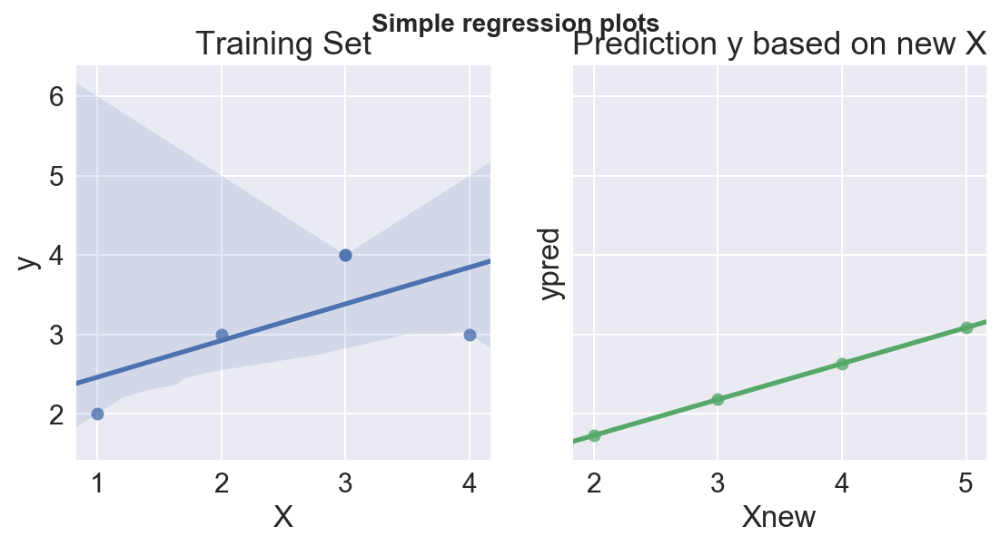

In [393]:
fig, axs = plt.subplots(ncols=2, figsize=(8, 4), sharey=True)

sns.regplot(x='X', y='y', data=df_, ax=axs[0])
axs[0].set_title("Training Set")
sns.regplot(x='Xnew', y='ypred', data=dfpred, ax=axs[1])
axs[1].set_title("Prediction y based on new X")
fig.suptitle('Simple regression plots', fontsize=14, fontweight='bold')

plt.show()

#### Training (more) complex model

In [61]:
#create data set for regression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import datasets
data_regression = datasets.load_diabetes()
df = pd.DataFrame(data_regression['data'], columns=data_regression['feature_names'])
df['ycol'] = data_regression['target']
df.head()
X = df.drop('ycol', axis=1)
y = df['ycol'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=0)
ss = StandardScaler()
ss.fit_transform(X_train)
ss.transform(X_test)
ss.transform(X)
df.head()

,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6,ycol
0,0.038076,0.050680,0.061696,0.021872,-0.044223,-0.034821,-0.043401,-0.002592,0.019908,-0.017646,151.0
1,-0.001882,-0.044642,-0.051474,-0.026328,-0.008449,-0.019163,0.074412,-0.039493,-0.068330,-0.092204,75.0
2,0.085299,0.050680,0.044451,-0.005671,-0.045599,-0.034194,-0.032356,-0.002592,0.002864,-0.025930,141.0
3,-0.089063,-0.044642,-0.011595,-0.036656,0.012191,0.024991,-0.036038,0.034309,0.022692,-0.009362,206.0
4,0.005383,-0.044642,-0.036385,0.021872,0.003935,0.015596,0.008142,-0.002592,-0.031991,-0.046641,135.0


(353, 10) (353,)
(89, 10) (89,)
Mean for scaler -0.0, Std for scaler 1.0
Average score and standard error: 0.5 +- 0.03 std 0.06062536091721397
Cross-validated scores: [0.59659737 0.42483814 0.54694272 0.49167676 0.46469514]
0.5049500275362432
Test set score: 0.3806151646432756


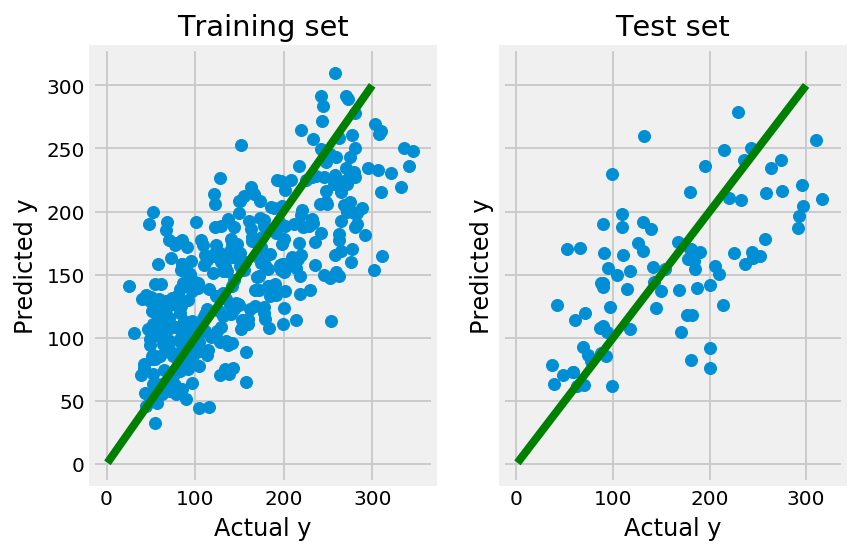

In [223]:
# get the data
from sklearn import datasets, linear_model
from sklearn.model_selection import cross_val_predict
data = datasets.load_diabetes()
df = pd.DataFrame(data['data'], columns=data['feature_names'])
df['ycol'] = data['target']
df.head()
X = df.drop('ycol', axis=1)
y = df['ycol'].values

#Train-Test split and scale X
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)
from sklearn.preprocessing import StandardScaler
# initialize the Scaler
ss = StandardScaler()
# Fit the data using the scaler (scale the data)
ss.fit(X_train) #scale on X-train
X_train = ss.transform(X_train)#transform the data sets
X_test= ss.transform(X_test)
print (f'Mean for scaler {round(X_train.mean(),2)}, Std for scaler {round(X_train.std(),2)}')

#Set up the model
model = linear_model.Lasso() #plain Lasso with default settings
model.fit(X_train,y_train)
# Perform 5-fold cross validation
from sklearn import metrics
scores = cross_val_score(model, X_train, y_train, cv=5)
avg = np.std(scores)/np.sqrt(scores.shape[0])
print(
    f'Average score and standard error: {np.round(np.mean(scores),2)} +- {np.round((avg),2)} std {np.std(scores)}')
print("Cross-validated scores:", scores)
print(scores.mean())
y_pred_train = cross_val_predict(model, X_train, y_train)
y_pred_test = model.predict(X_test)
print(f'Test set score: {metrics.r2_score(y_test, y_pred_test)}')

#plot results
fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
ax1.point_1 = [1,300]
ax1.plot(ax1.point_1,ax1.point_1, 'g')
ax1.scatter(y_train, y_pred_train)
ax1.set_title('Training set')
ax1.set_xlabel('Actual y')
ax1.set_ylabel('Predicted y')
ax2.point_1 = [1,300]
ax2.plot(ax2.point_1,ax2.point_1, 'g')
ax2.scatter(y_test, y_pred_test)
ax2.set_title('Test set')
ax2.set_xlabel('Actual y')
ax2.set_ylabel('Predicted y')

plt.show()

Lasso out of the box does not perform very well. R2 scores are low an very variable

### Model tuning - SKLearn Grid searching generic process - Regression 
Use grid search to find the optimal parameters

In [224]:
from sklearn.model_selection import GridSearchCV
model = linear_model.Lasso()

alpha = np.logspace(-3, 3, 10)

param_grid = dict(alpha=alpha)

grid = GridSearchCV(model, param_grid, cv=5, scoring='r2', verbose=1)
grid.fit(X_train, y_train)

# check the results of the grid search
print(grid.best_params_)
print(grid.best_score_)

best_model = grid.best_estimator_

Fitting 5 folds for each of 10 candidates, totalling 50 fits
{'alpha': 0.46415888336127775}
0.5032424616161122


[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.1s finished
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:734: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


This actually only indicates the best model; **Generalizability** still needs to be assessed throug CV of the best model: Nested CV

Cross-validated scores: [0.59310132 0.41168904 0.48969961 0.34606715 0.61123891]
Average score and standard error: 0.49 +- 0.05
Test set score: 0.4055164381490597


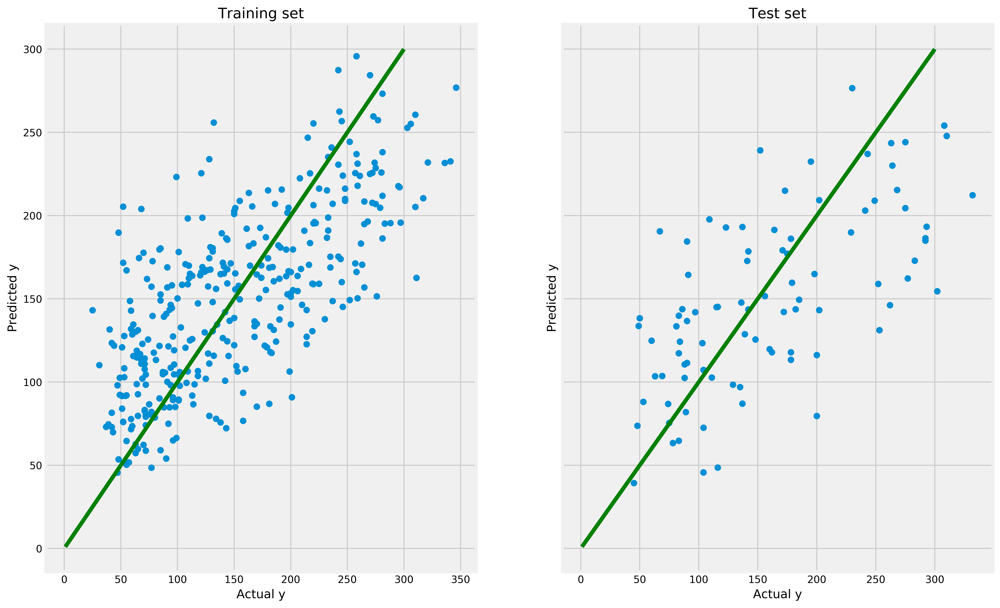

In [441]:
# Set up the CV with the grid.best_estimator_
model = best_model
model.fit(X_train, y_train)
# Perform 5-fold cross validation
scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-validated scores:", scores)
avg = np.std(scores)/np.sqrt(scores.shape[0])
print(
    f'Average score and standard error: {np.round(np.mean(scores),2)} +- {np.round((avg),2)}')

y_pred_train = cross_val_predict(model, X_train, y_train)
y_pred_test = model.predict(X_test)
print(f'Test set score: {metrics.r2_score(y_test, y_pred_test)}')

# plot results
fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
ax1.point_1 = [1, 300]
ax1.plot(ax1.point_1, ax1.point_1, 'g')
ax1.scatter(y_train, y_pred_train)
ax1.set_title('Training set')
ax1.set_xlabel('Actual y')
ax1.set_ylabel('Predicted y')
ax2.point_1 = [1, 300]
ax2.plot(ax2.point_1, ax2.point_1, 'g')
ax2.scatter(y_test, y_pred_test)
ax2.set_title('Test set')
ax2.set_xlabel('Actual y')
ax2.set_ylabel('Predicted y')

plt.show()

Putting it in a single loop

In [350]:
from sklearn.model_selection import GridSearchCV,KFold,cross_val_predict,cross_val_score,StratifiedKFold


# Following kf is the outer loop
outer_kf = KFold(n_splits=8,shuffle=True,random_state=1)
inner_kf = KFold(n_splits=3,shuffle=True,random_state=2)

model = linear_model.Lasso()

alpha = np.logspace(-3, 3, 10)

param_grid = dict(alpha=alpha)


grid = GridSearchCV(model, param_grid ,cv=inner_kf, scoring='r2')
grid.fit(X_train, y_train)
print(f'Non nested best score: {grid.best_score_}')

nested_score = cross_val_score(grid,X_train, y_train ,cv=outer_kf)
print(f'Nested scores: {nested_score}')
print(f'Nested score mean: {nested_score.mean()}')
y_pred_test = grid.predict(X_test)
print(f'Test set score: {metrics.r2_score(y_test, y_pred_test)}')

#Demo to show that gridsearch autmatically selects the best model (based on scoring)
best_model = grid.best_estimator_
best_model.fit(X_train, y_train)
y_pred_test_ = best_model.predict(X_test)
print(f'Test set score: {metrics.r2_score(y_test, y_pred_test_)}')

/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:734: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:734: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Non nested best score: 0.44100320981292845
Nested scores: [0.58031738 0.32226427 0.5712628  0.39759932 0.31463356 0.39611609
 0.51357486 0.4127327 ]
Nested score mean: 0.4385626228599572
Test set score: 0.6470927502920396
Test set score: 0.6470927502920396


The best non nested score actually validates with the mean nested cross validation of the best result. The individual fold score remain hit and miss; i.e. generalizability could be disappointing

In [354]:
best_model.coef_

array([ 0.        , -7.15449484, 25.43282779, 11.78321477, -4.39624989,
       -0.        , -9.12653618,  0.        , 22.52087029,  1.08242229])

In [442]:
best_model.intercept_

150.26345609065154

### Feature importance and Feature selection - Regression
Having established the best model feature importance should be addressed, with the objective to perform or finalize feature selection.

Feature selection is important for 2 reasons:

- 'The curse of dimensionality', a large number of features, in general and relative to the number of observations in particular.

- Productionalizing the model: the fewer features the better (Data collection, data quality, data archiving processes will be much simpler)

In [225]:
#feature importance
model_coefs = pd.DataFrame(
    {"variable": X.columns, 'coef': best_model.coef_, 'abs_coef': np.abs(best_model.coef_)})
model_coefs.sort_values('abs_coef', inplace = True, ascending=False)
model_coefs.head(20)

,abs_coef,coef,variable
8,29.259396,29.259396,s5
2,25.613555,25.613555,bmi
3,14.556666,14.556666,bp
1,10.432328,-10.432328,sex
6,8.097836,-8.097836,s3
4,7.093076,-7.093076,s1
9,1.200087,1.200087,s6
0,0.107947,0.107947,age
5,0.000000,-0.000000,s2
7,0.000000,0.000000,s4


In [226]:
print('Percent variables zeroed out:', np.sum(((np.abs(best_model.coef_) == 0))/float(X.shape[1])*100))

Percent variables zeroed out: 20.0


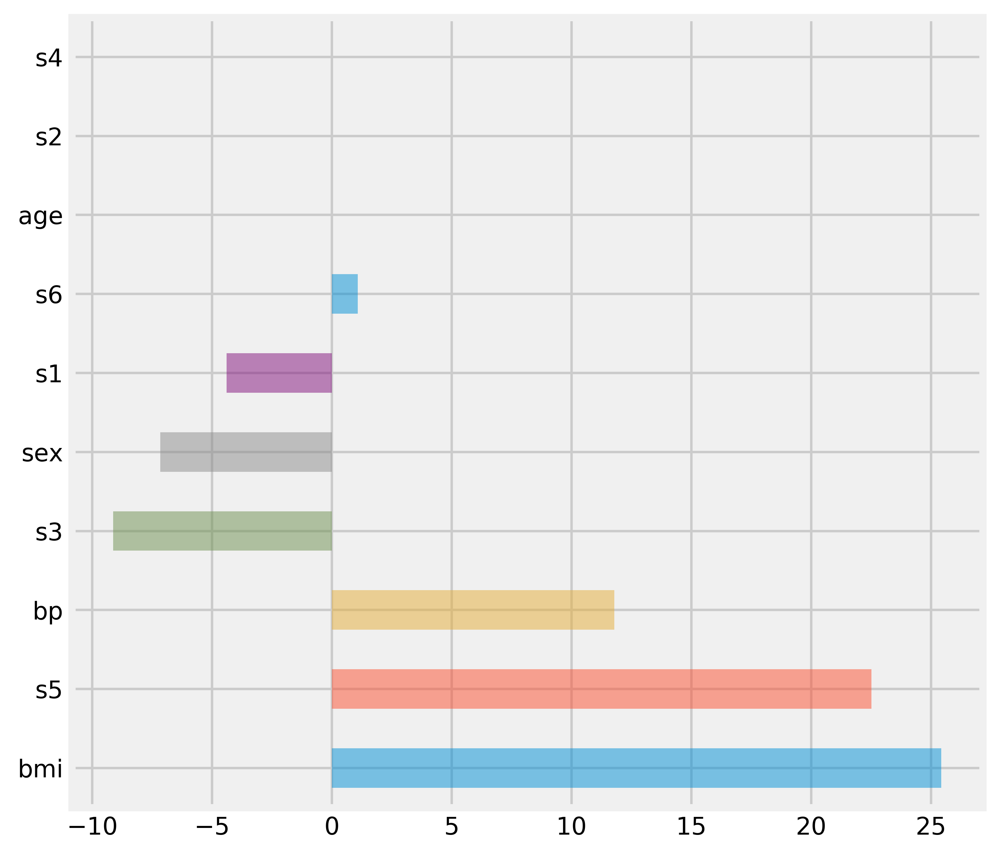

In [362]:
fig, ax = plt.subplots(figsize = (6,6))
model_coefs.coef[:30].plot(kind='barh',ax=ax,alpha=0.5)
ax.set_yticklabels(model_coefs.variable[:30].values)
plt.show()

'S4', 'S2', 'age'  can be eliminated

### Fitting the final model

In [387]:
# redefine X discarding unneeded features
X = X[['sex', 'bmi', 'bp', 's1',  's3', 's5', 's6']]
print(X.shape)
print(y.shape)
#Scale X 
ss.fit_transform(X)

#model is rained on the entire dataset
final_model = grid.best_estimator_.fit(X,y)
y_pred_final = final_model.predict(X)
print(f'r2_score of final model with complete dataset: {metrics.r2_score(y, y_pred_final)}')

(442, 7)
(442,)
r2_score of final model with complete dataset: 0.5145842195006607


In [389]:
final_model

Lasso(alpha=0.001, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)

### Save the model

In [394]:
import pickle
s = pickle.dumps(final_model)
model = pickle.loads(s)
model.predict(X[0:1])

array([205.84782134])

In [396]:
model

Lasso(alpha=0.001, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)

### Model scoring

In [382]:
from sklearn.model_selection import cross_validate
from sklearn.metrics import recall_score
scoring = ['r2', 'neg_mean_squared_error']

scores = cross_validate(model, X_train, y_train, scoring=scoring,
                        cv=5, return_train_score=False)
sorted(scores.keys())
df_scores = pd.DataFrame(scores)
df_scores.iloc[:,2:] #skip first 2 columns

,test_neg_mean_squared_error,test_r2
0,-3353.343644,0.366603
1,-2835.007404,0.543064
2,-3368.715591,0.420769
3,-4143.569294,0.398027
4,-2771.233867,0.483293


### SKlearn generic process - Binary Classifier

In [17]:
from sklearn import datasets
data_binary_clf = datasets.load_breast_cancer()
df = pd.DataFrame(data_binary_clf['data'], columns=data_binary_clf['feature_names'])
df['ycol'] = data_binary_clf['target']
X = df.drop('ycol', axis=1)
y = df['ycol'].values

In [18]:
#Train-Test split and scale X
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
print(f'Shape X_train, y_train: {X_train.shape, y_train.shape}')
print(f'Shape X_test, y_test: {X_test.shape, y_test.shape}')
from sklearn.preprocessing import StandardScaler
# initialize the Scaler
ss = StandardScaler()
# Fit the data using the scaler (scale the data)
ss.fit(X_train) #scale on X-train
X_train = ss.transform(X_train)#transform the data sets
X_test= ss.transform(X_test)
print (f'Mean for scaled data: {round(X_train.mean(),2)}, Std for scaled data: {round(X_train.std(),2)}')

Shape X_train, y_train: ((455, 30), (455,))
Shape X_test, y_test: ((114, 30), (114,))
Mean for scaled data: -0.0, Std for scaled data: 1.0


#### Create a baseline

What score would flipping a coin yield? This is the score a model would need to beat. Important input to a business case of implementing a model **or not**

In [19]:
#establish baseline with runnin the model with default settings
clf = LogisticRegression()
#clf = SVC(probability = True)
clf.fit(X_train,y_train)
clf.score(X_train, y_train)
print(f'Accuracy score: {clf.score(X_train, y_train)}')

Accuracy score: 0.9846153846153847


In [20]:

#Create Dummy Regression Always Predicts The Mean Value Of Target
from sklearn.dummy import DummyClassifier

# Create dummy classifer
dummy = DummyClassifier(strategy='uniform', random_state=1)

# "Train" model
dummy.fit(X_train, y_train)

# Get accuracy score
dummy.score(X_test, y_test)  

0.543859649122807

Shape X_train, y_train: ((455, 30), (455,))
Shape X_test, y_test: ((114, 30), (114,))
Mean for scaled data: 0.0, Std for scaled data: 1.0
Accuracy score: 0.989010989010989


In [243]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
predictions = clf.predict(X_train)
confusion = confusion_matrix(y_train,predictions)#,labels=[1,0])
pd.DataFrame(confusion, 
             columns=['predicted_0','predicted_1'], 
             index=['true_0','true_1'])


,predicted_0,predicted_1
true_0,162,5
true_1,0,288


- **Accuracy**  What proportion of predictions the model was right
- **Recall**  What proportion of actual positives was identified correctly?
- **Preciseness**  What proportion of positive identifications was actually correct?

Rates as computed from the confusion matrix  
**Accuracy**: Overall, how often is the classifier correct?  
	•	(TP+TN)/total  
**Misclassification Rate**: Overall, how often is it wrong? 
equivalent to 1 minus Accuracy also known as "Error Rate"  
	•	(FP+FN)/total    
**Recall** or **Sensisitity** : When it's actually yes, how often does it predict 1?  
	•	TP/actual yes  also known as "True Positive Rate"  
**False Positive Rate:** When it's actually 0, how often does it predict 1?  
	•	FP/actual no   
**Specificity:** When it's actually 0, how often does it predict 0? also know as "True Negative Rate".  
	•	TN/actual no  equivalent to 1 minus False Positive Rate  
**Precision:** When it predicts 1, how often is it correct?  
	•	TP/predicted yes   
**Prevalence:** How often does the yes condition actually occur in our sample?  
	•	actual yes/total   

In [244]:
pd.crosstab(y_train, predictions, rownames=['True'], colnames=['Predicted'], margins=True)

Predicted,0,1,All
True,,,
0,162,5,167
1,0,288,288
All,162,293,455


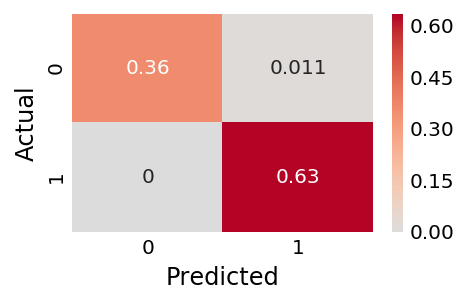

In [245]:
heat = pd.crosstab(y_train, predictions, rownames=['Actual'], colnames=['Predicted'], normalize=True)
fig, ax  = plt.subplots(figsize = (3,2))
sns.heatmap(heat, cmap='coolwarm', center=0, annot=True);
plt.show()

In [246]:
tn, fp, fn, tp = confusion.ravel()
(tn, fp, fn, tp)

(162, 5, 0, 288)

In [247]:
from sklearn.metrics import classification_report
print(classification_report(y_train, predictions, labels=None, target_names=None, sample_weight=None, digits=2))

             precision    recall  f1-score   support

          0       1.00      0.97      0.98       167
          1       0.98      1.00      0.99       288

avg / total       0.99      0.99      0.99       455



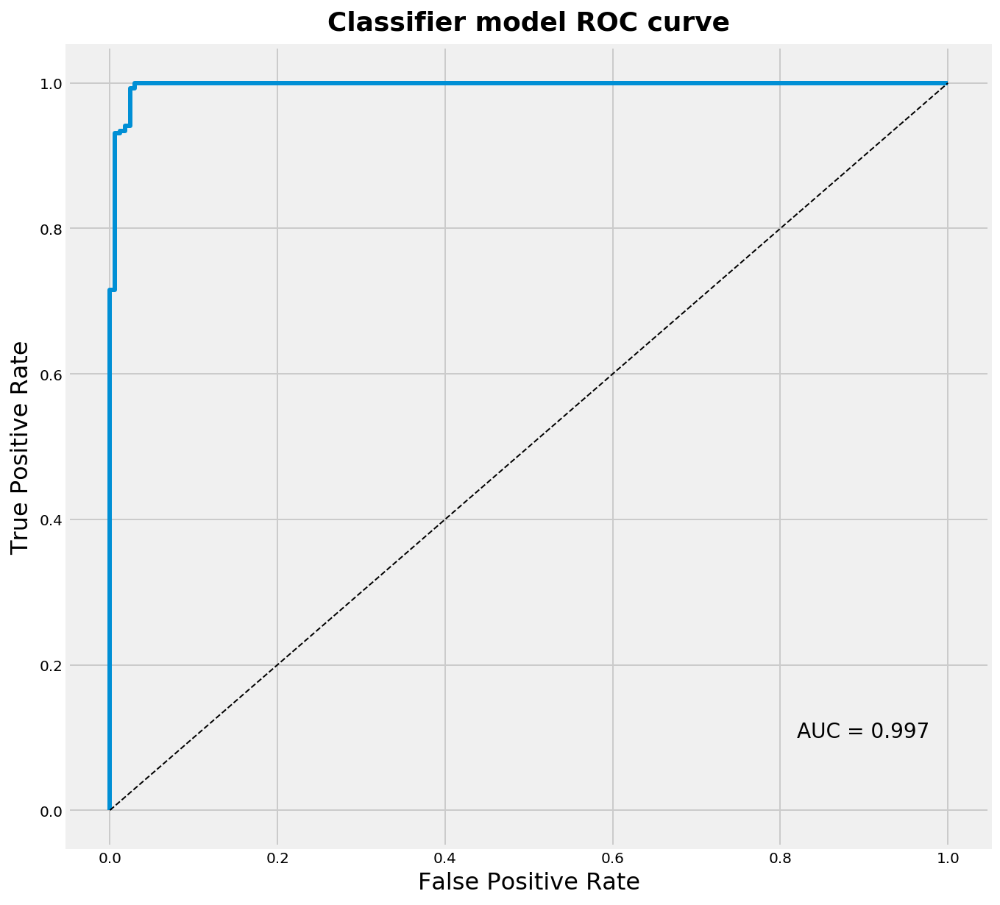

In [248]:
from sklearn.metrics import roc_auc_score, roc_curve
probabilities = pd.DataFrame(clf.predict_proba(X_train), 
                             columns=['predict0', 'predict1'])
fpr, tpr, thresholds = roc_curve(y_train,probabilities.predict1)
auc_score = roc_auc_score(y_train, probabilities.predict1)
plt.figure(figsize=[10,10])
plt.plot(fpr,tpr,linewidth=3)
plt.plot([0,1],[0,1], c='black', lw=1, ls='dashed')
plt.title('Classifier model ROC curve', y=1.01, fontsize=18, fontweight='bold')
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.annotate(s='AUC = '+str(auc_score.round(3)), xy=(0.82,0.1), fontsize=14)
plt.show()

Accuracy is measured by the area under the ROC curve. An area of 1 represents a perfect test; an area of .5 represents a worthless test. A rough guide for classifying the accuracy of a diagnostic test is the traditional academic point system:

.90-1 = excellent (A)  
.80-.90 = good (B)  
.70-.80 = fair (C)  
.60-.70 = poor (D)  
.50-.60 = fail (F)  

http://gim.unmc.edu/dxtests/roc3.htm

In [249]:
#showing the true, predicted and 'certainty' of the model in a df
ss = StandardScaler()
# Fit the data using the scaler (scale the data)
ss.fit(X_train) #scale on X-train
#or subset X = ss.fit_transform(df[['col1', 'col2']]) 
ss.fit_transform(X)#transform the data sets
clf.fit(X_train, y_train)
probabilities = clf.predict_proba(X)
df['prediction'] = clf.predict(X)
df['probability 0'] = np.round(probabilities[:,0], 3)
df['probability 1'] = np.round(probabilities[:,1], 3)
df[['ycol', 'prediction','probability 0', 'probability 1']].sample(10)
#probabilities

/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/base.py:340: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)


,ycol,prediction,probability 0,probability 1
251,1,0,1.0,0.0
475,1,0,1.0,0.0
436,1,0,1.0,0.0
203,0,0,1.0,0.0
212,0,0,1.0,0.0
542,1,0,1.0,0.0
403,1,0,1.0,0.0
320,1,0,1.0,0.0
97,1,0,1.0,0.0
223,0,0,1.0,0.0


In [250]:
# establish baseline with runnin the model with default settings
from sklearn.metrics import accuracy_score
clf = clf = SVC(probability=True, gamma='auto')
scores = cross_val_score(clf, X_train, y_train, cv=5)
print(f'Accuracy per fold: {scores}')
avg = np.std(scores)/np.sqrt(scores.shape[0])
print(
    f'Average score and standard error of means: {np.round(np.mean(scores),2)} +- {np.round((avg),2)}')
print(f'Model parameters: {clf}')
y_pred_train = cross_val_predict(clf, X_train, y_train)
clf.fit(X_test, y_test)
y_pred_test = clf.predict(X_test)
print(f'Test set score: {accuracy_score(y_test, y_pred_test)}')

Accuracy per fold: [0.98913043 0.9673913  0.97802198 0.97777778 0.94444444]
Average score and standard error of means: 0.97 +- 0.01
Model parameters: SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=True, random_state=None, shrinking=True,
  tol=0.001, verbose=False)
Test set score: 1.0


#### Cross validation of a simple model - Binary Classification

In [251]:
# Cross validated scores
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import accuracy_score

clf = LogisticRegression()

scores = cross_val_score(clf, X_train, y_train, cv=5)
print(f'Accuracy per fold: {scores}')
avg = np.std(scores)/np.sqrt(scores.shape[0])
print(
    f'Average score and standard error of means: {np.round(np.mean(scores),2)} +- {np.round((avg),2)}')
print(f'Model parameters: {clf}')
y_pred_train = cross_val_predict(clf, X_train, y_train)
clf.fit(X_test, y_test)
y_pred_test = clf.predict(X_test)
print(f'Test set score: {accuracy_score(y_test, y_pred_test)}')

Accuracy per fold: [0.98913043 0.97826087 0.96703297 0.98888889 0.97777778]
Average score and standard error of means: 0.98 +- 0.0
Model parameters: LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)
Test set score: 1.0


#### Gridsearch of a simple model - Binary Classification

In [252]:
# Set up the parameters. 
# Use a list with 'l1' and 'l2' for the penalties,
# Use a list with 'liblinear' for the solver,
# Use a logspace from -3 to 0, with 50 different values

# fill the dictionary of parameters
params = {'penalty':['l1','l2'],
             'solver':['liblinear'],
             'C': np.logspace(-3,3,50),
             'class_weight' : ['balanced','']
            }

#create your gridsearch object
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression()

gridsearch = GridSearchCV(clf, 
                             params, 
                             n_jobs=-1, cv=5, verbose=1)
#fit your gridsearch object on your training data
gridsearch.fit(X_train, y_train)
# find the best mean cross-validated score that your gridsearch found:
# (this should be better than the mean cross-validated score for your default logistic regression above)
# lr_gridsearch.best_score_
print(f'Best mean cross-validated score{gridsearch.best_score_}')
# find the best hyperparameters that your gridsearch found:
print(f'Parameters of best model  {gridsearch.best_params_}')
# assign the best estimator to a variable:
best_clf = gridsearch.best_estimator_
# score your best estimator on the testing data:
print(f'Accuracy score of best model: {best_clf.score(X, y)}')

Fitting 5 folds for each of 200 candidates, totalling 1000 fits
Best mean cross-validated score0.9802197802197802
Parameters of best model  {'C': 0.49417133613238334, 'class_weight': '', 'penalty': 'l2', 'solver': 'liblinear'}
Accuracy score of best model: 0.37258347978910367


[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:    3.1s finished
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:734: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [253]:
# Set up the CV with the grid.best_estimator_
clf = best_clf
clf.fit(X_train, y_train)
# Perform 5-fold cross validation
scores = cross_val_score(clf, X_train, y_train, cv=5)
print("Cross-validated fold scores:", scores)
avg = np.std(scores)/np.sqrt(scores.shape[0])
print(
    f'Average score of folds and standard error: {np.round(np.mean(scores),3)} +- {np.round((avg),3)}')

y_pred_train = cross_val_predict(clf, X_train, y_train)
y_pred_test = clf.predict(X_test)
print(f'Test set score: {accuracy_score(y_test, y_pred_test)}')

Cross-validated fold scores: [0.98913043 0.97826087 0.96703297 0.98888889 0.97777778]
Average score of folds and standard error: 0.98 +- 0.004
Test set score: 0.9736842105263158


In [254]:
#feature importance for Logistic regression, svc with linear kernel some others!
clf_coefs = pd.DataFrame(
    {"variable": X.columns, 'coef': best_clf.coef_[0], 'abs_coef': np.abs(best_clf.coef_[0])})
clf_coefs.sort_values('abs_coef', inplace = True, ascending=False)
clf_coefs.head(35)
# took me 3 hours to figure out the [0] in coef_[0]

,abs_coef,coef,variable
21,1.006443,-1.006443,worst texture
10,0.890204,-0.890204,radius error
27,0.793037,-0.793037,worst concave points
13,0.772635,-0.772635,area error
23,0.746410,-0.746410,worst area
26,0.727552,-0.727552,worst concavity
20,0.716033,-0.716033,worst radius
7,0.709953,-0.709953,mean concave points
15,0.694659,0.694659,compactness error
19,0.655149,0.655149,fractal dimension error


In [255]:
print('Percent variables (nearly) zero:', np.sum(((np.abs(best_clf.coef_[0]) <= 0.1))/float(X.shape[1])*100))

Percent variables (nearly) zero: 13.333333333333334


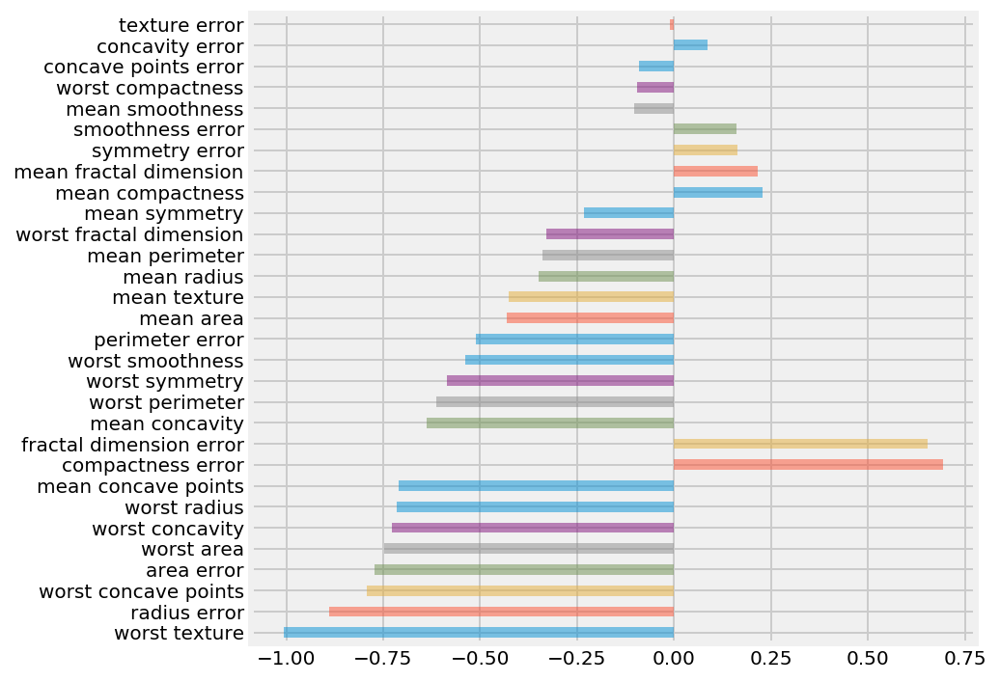

In [256]:
fig, ax = plt.subplots(figsize = (6,6))
clf_coefs.coef[:30].plot(kind='barh',ax=ax,alpha=0.5)
ax.set_yticklabels(clf_coefs.variable[:30].values)
plt.show()

In [257]:
# redefine X discarding unneeded features
from sklearn.metrics import accuracy_score
#X = X.drop(['mean symmetry', 'worst compactness', 'concavity error'], axis=1)
# or positively defining the df:
X = X[['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error',
       'concave points error', 'symmetry error', 'fractal dimension error',
       'worst radius', 'worst texture', 'worst perimeter', 'worst area',
       'worst smoothness', 'worst concavity',
       'worst concave points', 'worst symmetry', 'worst fractal dimension']]
print(X.shape)
print(y.shape)
#Scale X 
ss.fit_transform(X)

#model is trained on the entire dataset
final_clf = clf.fit(X,y)
y_pred_final = final_clf.predict(X)
print(f'Accuracy score of final model with complete dataset: {accuracy_score(y, y_pred_final)}')

(569, 27)
(569,)
Accuracy score of final model with complete dataset: 0.9560632688927944


In [258]:
import pickle
s = pickle.dumps(final_model)
model = pickle.loads(s)
model.predict(X[0:1])

array([0])

### SKlearn generic process - MultiLabel Classifier

In [259]:
#get the data ready
from sklearn import datasets
data = datasets.load_iris()
df = pd.DataFrame(data['data'], columns=data['feature_names'])
df['ycol'] = data['target']
X = df.drop('ycol', axis=1)
y = df['ycol'].values
from sklearn.model_selection import train_test_split, cross_val_score
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
print(f'Shape X_train, y_train: {X_train.shape, y_train.shape}')
print(f'Shape X_test, y_test: {X_test.shape, y_test.shape}')
from sklearn.preprocessing import StandardScaler
# initialize the Scaler
ss = StandardScaler()
# Fit the data using the scaler (scale the data)
ss.fit(X_train) #scale on X-train
#or subset X = ss.fit_transform(df[['col1', 'col2']]) 
X_train = ss.transform(X_train)#transform the data sets
X_test= ss.transform(X_test)
print (f'Mean for scaled data: {round(X_train.mean(),2)}, Std for scaled data: {round(X_train.std(),2)}')
df.head()

Shape X_train, y_train: ((120, 4), (120,))
Shape X_test, y_test: ((30, 4), (30,))
Mean for scaled data: -0.0, Std for scaled data: 1.0


,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),ycol
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


In [260]:
#establish baseline with runnin the model with default settings
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression()

clf.fit(X_train, y_train)

y_pred_train = clf.predict(X_train)
print(f'Test set score: {np.round(accuracy_score(y_train, y_pred_train), 3)}')
y_pred_test = clf.predict(X_test)
print(f'Test set score: {accuracy_score(y_test, y_pred_test)}')


print(f'Model parameters: {clf}')


Test set score: 0.917
Test set score: 0.9333333333333333
Model parameters: LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)


In [261]:
ss = StandardScaler()
# Fit the data using the scaler (scale the data)
ss.fit(X_train) #scale on X-train
#or subset X = ss.fit_transform(df[['col1', 'col2']]) 
X = ss.fit_transform(X)#transform the data sets

clf.fit(X, y)
probabilities = clf.predict_proba(X)
df['pred']= clf.predict(X)
df['probability 0'] = probabilities[:,0]
df['probability 1'] = probabilities[:,1]
df['probability 2'] = probabilities[:,2]
df[['ycol', 'pred','probability 0', 'probability 1', 'probability 2']].sample(15)

,ycol,pred,probability 0,probability 1,probability 2
76,1,1,0.009486,0.635626,0.354887
124,2,2,0.004454,0.145850,0.849696
32,0,0,0.976718,0.023197,0.000085
8,0,0,0.725005,0.274873,0.000122
106,2,1,0.013645,0.523294,0.463061
68,1,1,0.001992,0.696144,0.301864
121,2,2,0.006436,0.297415,0.696149
3,0,0,0.789500,0.210363,0.000137
17,0,0,0.914235,0.085586,0.000178
78,1,1,0.037133,0.536750,0.426117


In [25]:
import pprint

In [30]:
# Cross validated scores
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import accuracy_score

clf = LogisticRegression()

scores = cross_val_score(clf, X_train, y_train, cv=5)
print(f'Accuracy per fold: {scores}')
avg = np.std(scores)/np.sqrt(scores.shape[0])
print(
    f'Average score and standard error of means: {np.round(np.mean(scores),2)} +- {np.round((avg),2)}')
print(f'Model parameters: {clf}')
y_pred_train = cross_val_predict(clf, X_train, y_train)
clf.fit(X_test, y_test)
y_pred_test = clf.predict(X_test)
print(f'Test set score:/n {accuracy_score(y_test, y_pred_test)}')
print(clf)

Accuracy per fold: [0.9673913  0.97826087 0.95604396 0.97777778 0.98888889]
Average score and standard error of means: 0.97 +- 0.0
Model parameters: LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)
Test set score:/n 0.9912280701754386
LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)


In [263]:
clf.fit(X_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [264]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
predictions = clf.predict(X_train)
confusion = confusion_matrix(y_train,predictions,labels=[0,1,2])
pd.DataFrame(confusion, 
             columns=['predict0','predict1', 'predict2'], 
             index=['actual0', 'actual1', 'actual2'])

,predict0,predict1,predict2
actual0,35,0,0
actual1,0,37,7
actual2,0,3,38


In [265]:
pd.crosstab(y_train, predictions, rownames=['True'], colnames=['Predicted'], margins=True)

Predicted,0,1,2,All
True,,,,
0,35,0,0,35
1,0,37,7,44
2,0,3,38,41
All,35,40,45,120


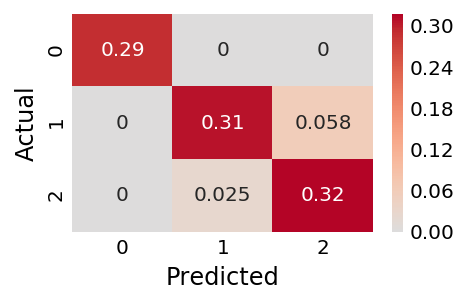

In [266]:
heat = pd.crosstab(y_train, predictions, rownames=['Actual'], colnames=['Predicted'], normalize=True)
fig, ax  = plt.subplots(figsize = (3,2))
sns.heatmap(heat, cmap='coolwarm', center=0, annot=True);
plt.show()

In [267]:
from sklearn.metrics import classification_report
predictions = clf.predict(X_train)
print(classification_report(y_train, predictions, labels=[0,1,2], target_names=['flower1','flower2','flower3'], sample_weight=None, digits=2))

             precision    recall  f1-score   support

    flower1       1.00      1.00      1.00        35
    flower2       0.93      0.84      0.88        44
    flower3       0.84      0.93      0.88        41

avg / total       0.92      0.92      0.92       120



In [268]:
# http://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html
from sklearn.metrics import roc_curve, auc
from sklearn import datasets
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import LinearSVC
from sklearn.preprocessing import label_binarize
from sklearn.cross_validation import train_test_split
import matplotlib.pyplot as plt

y = label_binarize(y, classes=[0,1,2])
n_classes = 3

# OVRclassifier
clf = OneVsRestClassifier(LogisticRegression())
y_score = clf.fit(X_train, y_train).decision_function(X_test)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot of a ROC curve for a specific class
for i in range(n_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver operating characteristic example: label {i} vs Rest')
    plt.legend(loc="lower right")
    plt.show()

/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


IndexError: too many indices for array

In [269]:
from scipy import interp
from itertools import cycle
# Compute macro-average ROC curve and ROC area

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, #lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlim([-0.1, 1.0])
plt.ylim([-0.1, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Some extension of Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()

ValueError: multiclass format is not supported

In [270]:
from sklearn.model_selection import GridSearchCV
from sklearn import svm

clf = svm.SVC()

gamma_range = np.logspace(-5, 2, 10)
C_range = np.logspace(-3, 2, 10)
kernel_range = ['rbf', 'sigmoid', 'linear', 'poly']

param_grid = dict(gamma=gamma_range, C=C_range, kernel=kernel_range)

grid = GridSearchCV(clf, param_grid, cv=3, scoring='accuracy', verbose=1)
grid.fit(X, y)

# check the results of the grid search
print(grid.best_params_)
print(grid.best_score_)

best_svm = grid.best_estimator_

Fitting 3 folds for each of 400 candidates, totalling 1200 fits


/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:501: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


ValueError: bad input shape (100, 3)

In [139]:
y_pred = lr_gridsearch.best_estimator_.predict(X_train)

In [165]:
from sklearn.metrics import classification_report
print(classification_report(y_train, y_pred, labels=None, target_names=None, sample_weight=None, digits=2))

             precision    recall  f1-score   support

          0       0.21      0.22      0.22        41
          1       0.33      0.30      0.32        40
          2       0.26      0.28      0.27        39

avg / total       0.27      0.27      0.27       120



In [164]:
df_confusion = pd.crosstab(y_train, y_pred, rownames=['Actual'], colnames=['Predicted'], margins=True)
df_confusion

Predicted,0,1,2,All
Actual,,,,
0,9,15,17,41
1,14,12,14,40
2,19,9,11,39
All,42,36,42,120


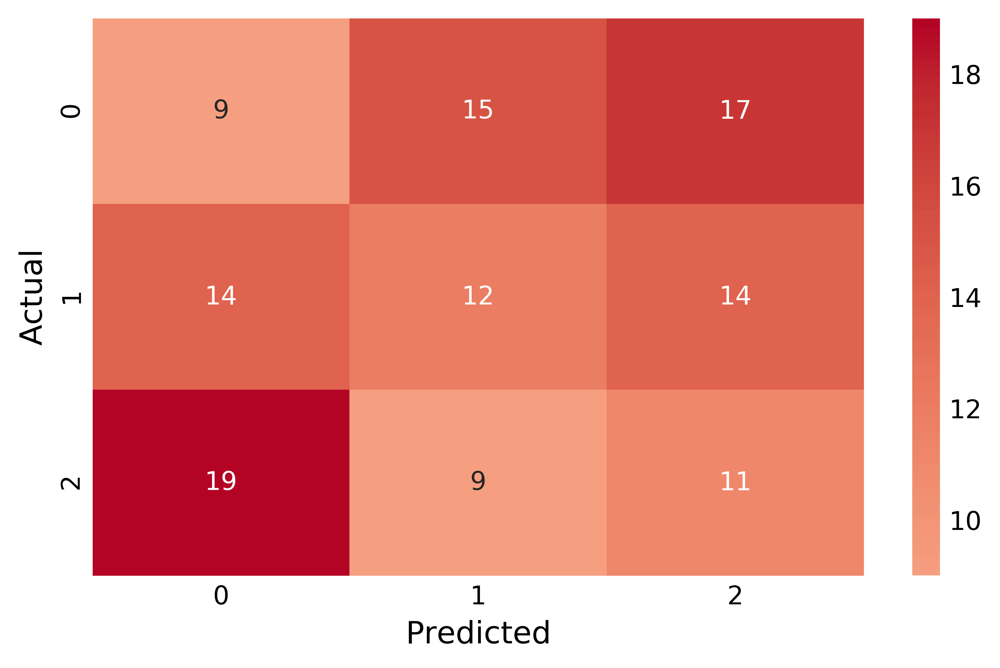

In [171]:
heat = pd.crosstab(y_train, y_pred, rownames=['Actual'], colnames=['Predicted'])
fig, ax  = plt.subplots(figsize = (6,4))
sns.heatmap(heat, cmap='coolwarm', center=0, annot=True);
plt.show()

In [120]:
probabilities = pd.DataFrame(lr_gridsearch.best_estimator_.predict(X_train), 
                             columns=['predict_0','predict_h'])
fpr, tpr, thresholds = roc_curve(y_test,probabilities.predict_high_salary)
auc_score = roc_auc_score(y_test, probabilities.predict_high_salary)
plt.figure(figsize=[10,10])
plt.plot(fpr,tpr,linewidth=3)
plt.plot([0,1],[0,1], c='black', lw=1, ls='dashed')
plt.title('Logistic Regression model ROC curve', y=1.01, fontsize=18, fontweight='bold')
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.annotate(s='AUC = '+str(auc_score.round(2)), xy=(0.82,0.1), fontsize=14)
plt.show()

array([0, 1, 2])

    C : Inverse of regularization strength; must be a positive float. Like in support vector machines, smaller values specify stronger regularization.

    solver : {‘newton-cg’, ‘lbfgs’, ‘liblinear’, ‘sag’, ‘saga’}, default: ‘liblinear’ Algorithm to use in the optimization problem.
    For small datasets, ‘liblinear’ is a good choice, whereas ‘sag’ and ‘saga’ are faster for large ones.
    For multiclass problems, only ‘newton-cg’, ‘sag’, ‘saga’ and ‘lbfgs’ handle multinomial loss; ‘liblinear’ is limited to one-versus-rest schemes.
    ‘newton-cg’, ‘lbfgs’ and ‘sag’ only handle L2 penalty, whereas ‘liblinear’ and ‘saga’ handle L1 penalty.

    class_weight : dict or ‘balanced’, default: None
        Weights associated with classes in the form {class_label: weight}. If not given, all classes are supposed to have weight one.
    The “balanced” mode uses the values of y to automatically adjust weights inversely proportional to class frequencies in the input data as n_samples / (n_classes * np.bincount(y)).
    Note that these weights will be multiplied with sample_weight (passed through the fit method) if sample_weight is specified.


### Nested CV

A gridsearch will find the model that scores best from given a parameter set. The 'best model' may be Cross Validated to assess the generalizability of the 'best model'.  Like all CV score consistancy is what we are looking for. (** note ** i.e. if the parameter set is not good Gridsearch will not find the $best$ model per se) 

In [74]:
from sklearn.model_selection import GridSearchCV,KFold,cross_val_predict,cross_val_score,StratifiedKFold

from sklearn.svm import SVC
from collections import Counter
from sklearn.metrics import classification_report,accuracy_score

iris = datasets.load_iris()
features = iris.data
target = iris.target
# Following kf is the outer loop
outer_kf = StratifiedKFold(n_splits=8,shuffle=True,random_state=1)
inner_kf = StratifiedKFold(n_splits=3,shuffle=True,random_state=2)
model = SVC(gamma='auto')
params = {'kernel':['rbf','linear'],'C':[1,10]}
clf = GridSearchCV(estimator=model,param_grid=params,cv=inner_kf)
clf.fit(features,target)
print(f'Non nested best score: {clf.best_score_}')

nested_score = cross_val_score(clf,features,target,cv=outer_kf)
print(f'Nested scores: {nested_score}')
print(f'Nested score mean: {nested_score.mean()}')

Non nested best score: 0.98
Nested scores: [0.95238095 1.         1.         1.         0.94444444 0.94444444
 1.         1.        ]
Nested score mean: 0.9801587301587302


/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:734: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:734: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:734: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:734: DeprecationWarning: The def

In [311]:
np.logspace(-3,3,50)

array([1.00000000e-03, 1.32571137e-03, 1.75751062e-03, 2.32995181e-03,
       3.08884360e-03, 4.09491506e-03, 5.42867544e-03, 7.19685673e-03,
       9.54095476e-03, 1.26485522e-02, 1.67683294e-02, 2.22299648e-02,
       2.94705170e-02, 3.90693994e-02, 5.17947468e-02, 6.86648845e-02,
       9.10298178e-02, 1.20679264e-01, 1.59985872e-01, 2.12095089e-01,
       2.81176870e-01, 3.72759372e-01, 4.94171336e-01, 6.55128557e-01,
       8.68511374e-01, 1.15139540e+00, 1.52641797e+00, 2.02358965e+00,
       2.68269580e+00, 3.55648031e+00, 4.71486636e+00, 6.25055193e+00,
       8.28642773e+00, 1.09854114e+01, 1.45634848e+01, 1.93069773e+01,
       2.55954792e+01, 3.39322177e+01, 4.49843267e+01, 5.96362332e+01,
       7.90604321e+01, 1.04811313e+02, 1.38949549e+02, 1.84206997e+02,
       2.44205309e+02, 3.23745754e+02, 4.29193426e+02, 5.68986603e+02,
       7.54312006e+02, 1.00000000e+03])

In [309]:
np.linspace(-3,3,50)

array([-3.        , -2.87755102, -2.75510204, -2.63265306, -2.51020408,
       -2.3877551 , -2.26530612, -2.14285714, -2.02040816, -1.89795918,
       -1.7755102 , -1.65306122, -1.53061224, -1.40816327, -1.28571429,
       -1.16326531, -1.04081633, -0.91836735, -0.79591837, -0.67346939,
       -0.55102041, -0.42857143, -0.30612245, -0.18367347, -0.06122449,
        0.06122449,  0.18367347,  0.30612245,  0.42857143,  0.55102041,
        0.67346939,  0.79591837,  0.91836735,  1.04081633,  1.16326531,
        1.28571429,  1.40816327,  1.53061224,  1.65306122,  1.7755102 ,
        1.89795918,  2.02040816,  2.14285714,  2.26530612,  2.3877551 ,
        2.51020408,  2.63265306,  2.75510204,  2.87755102,  3.        ])

### Regressors

#### Intro

Points hold true for all linear regression: Logistic; Single, Multiple Regression, Ridge, Lasso and ElasticNet. Cross Validation and Gridsearch do not take them away.

Used for continuous data assuming relations between different observed quantities. We do not always know how two quantities are related. Linear regression is a way to determine and quantify  the relationship from a set of data by calculating the coefficients of the linear relationships.
  
Important assumptions, not be be violated:

1. **Linearity:** y and X must have an approximately linear relationship.
![](http://www.comfsm.fm/~dleeling/statistics/relationships.gif)
From a maths/stats perspective: the term "linear" here means linear in the coefficient. That means that we expect $Y$ to change by a constant amount for a constant change in X. I.e. data may be transformed to fit/force linearity. A linear regression model could include X^2, X^3, log(X), etc. as long as the coefficient is linear! (see Polynomials)
   
    From a philosophical perspective: there needs to be a causal relationship. Use common sense.
<br>**Note**  The increase of  fatal cancer deaths in China since the 50-ies has nothing to do with the decrease of number of frog species in the Netherlands in the same period. Co-variance may exist but there is no cause and effect and there is no prediction value in this relationship.
  <br><br> 
2. **Independence:** Errors (residuals) i and j must be independent of one another for any i != j.  
  Ensure that the dependent variables in X are independent from each other  and are not **colinear**  . Common mistakes include having prices in different columns in different currencies, the  number of rooms in a house as well as the surface in meters/feet/yards. 
    * Choose the best indicator and drop the other
    * Use 'drop_first' when dummifying.
    <br><br> 
3. **Normality:** The errors (residuals) follow a Normal distribution.

    This means that the errors should be on either side if the regression line when plotted. If the variables are normally distributed this issue may be avoided upfront. A sns.distplot is often sufficient to highlight issues. 
  Dealing with skewed distributions:
      - Transform taking the np.log(df.col2) or the np.log(np.log(df.col2)
      - A Box-Cox transformation: preprocessing.PowerTransformer
<br><br>    
4. **Equality of Variances** (Homoscedasticity of errors): The errors (residuals) should have a roughly consistent pattern, regardless of the value of X. E.g. age and income. At a lower age variations will be much less than a a higher age

The mnemonic **LINE** is a useful way to remember these four assumptions.

If all four assumptions are true, the following holds: 

$$ Y_i \sim N(\beta_0 + \beta_1 X_i, \sigma) $$

> **Note:** $Y$ on its own is in general **not** normally distributed.

##### Pros and cons

- Fast, even with many features
- Easy to interpret
- Easy to productionalize, could even be excel
- Allows feature selection 
- With many features prone to overfitting
- Sensitive to outliers, **remove them **

#### Linear regression

In [102]:
#create data set for regression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn import datasets
data_regression = datasets.load_diabetes()
df = pd.DataFrame(data_regression['data'], columns=data_regression['feature_names'])
df['ycol'] = data_regression['target']
df.head()
X = df.drop('ycol', axis=1)
y = df['ycol'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=0)
X_train_unscaled = X_train.copy()
ss = StandardScaler()
ss.fit_transform(X_train)
ss.transform(X_test)
ss.transform(X)

array([[ 0.79153691,  1.01138557,  1.31999023, ..., -0.04867022,
         0.40141857, -0.35101067],
       [-0.0269555 , -0.98874261, -1.03758908, ..., -0.79853119,
        -1.38314671, -1.8044142 ],
       [ 1.75884612,  1.01138557,  0.96074005, ..., -0.04867022,
         0.05670049, -0.51249995],
       ...,
       [ 0.86594531,  1.01138557, -0.29663559, ..., -0.22113824,
        -0.94932772,  0.29494646],
       [-0.9198563 , -0.98874261,  0.84847437, ...,  0.54371994,
         0.89934273, -0.51249995],
       [-0.9198563 , -0.98874261, -1.48665181, ..., -0.79853119,
        -0.08656179,  0.05271254]])

In [103]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()

model.fit(X_train,y_train)
model.score(X_train, y_train)

0.5791093300283946

## Regularisation (Ridge, Lasso, Elasticnet)

Since Elasticnet considers the best combination of Ridge or Lasso, and allows for pure Lasso or pure Ridge it is easiest to run a Gridsearch on ElastivnetCV

In [104]:
import warnings
warnings.warn('once')
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV

# Use grid search to tune the parameters:

params = {"l1_ratio": [.1, .5, .7, .9, .95, .99, 1]
         }
model = ElasticNet()
grid = GridSearchCV(model, params, scoring='r2', cv=10, verbose=1)
grid.fit(X_train, y_train)



# check the results of the grid search
print(grid.best_params_)
print(grid.best_score_)
print(grid.best_estimator_)

best_model = grid.best_estimator_
Y_pred = grid.predict(X_test)

Fitting 10 folds for each of 7 candidates, totalling 70 fits
{'l1_ratio': 1}
0.40119163140569536
ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=1,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False)


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: once
  
[Parallel(n_jobs=1)]: Done  70 out of  70 | elapsed:    0.1s finished
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_search.py:734: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [105]:
from sklearn.linear_model import RidgeCV, LassoCV, Lasso, ElasticNetCV

#Ridge (start,stop,interval) Ridge linspace? Lasso
alpha_vals = np.linspace(-5,5,100) # is a good start, step 21 or 11
#                                               gives rounded numbers
ridge_cv = RidgeCV(alphas = alpha_vals, cv = 5)
ridge_cv.fit(X_train, y_train)
best_alpha = ridge_cv.alpha_
print('Best alpha', best_alpha)
print('Best R', ridge_cv.score(X_train,y_train))

Best alpha 0.050505050505050164
Best R 0.5750600177166454


0.029847747393685307
[0.60987451 0.49442919 0.37781149 0.63327498 0.43037848 0.39446947
 0.6467627  0.6937031  0.42513246 0.64521174]
0.535104811965588
0.5453820621752731
Percent variables zeroed out: 0.004524886877828055


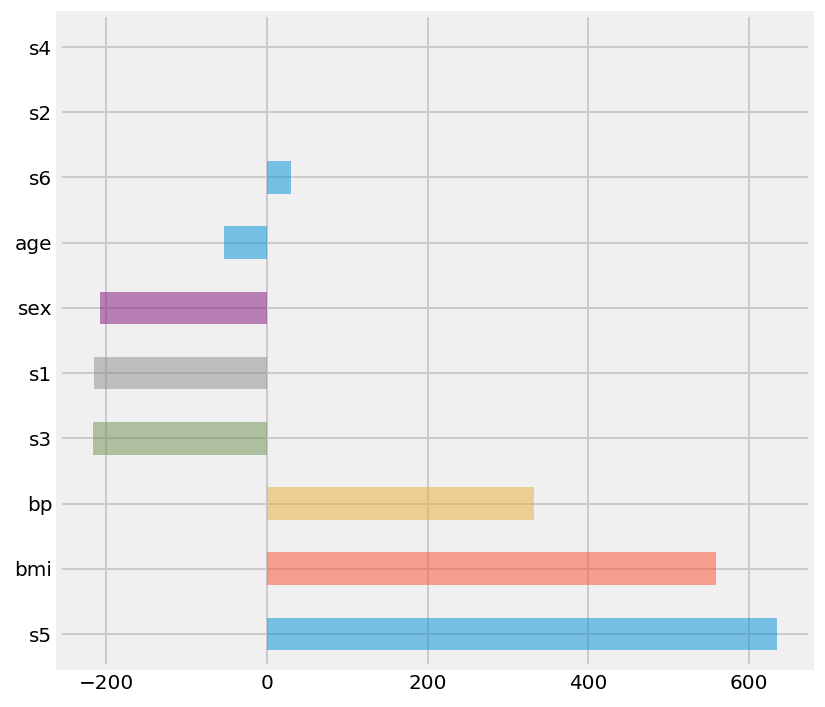

In [106]:
best_lasso = LassoCV(n_alphas=100, cv=10, verbose=0)  # what numbers
best_lasso.fit(X_train, y_train)
print(best_lasso.alpha_)
best_lasso.score(X_train, y_train)

# applying the best lasso:
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_predict, cross_val_score
lasso = Lasso(alpha=best_lasso.alpha_)
lasso_scores = cross_val_score(lasso, X_train, y_train, cv=10)
print(lasso_scores)
print(np.mean(lasso_scores))
predictions = cross_val_predict(lasso, X_train, y_train, cv=10)
print(r2_score(y_train, predictions))

lasso.fit(X_train, y_train)
# create a df
lasso_coefs = pd.DataFrame(
     {"variable": X.columns, 'coef': lasso.coef_, 'abs_coef': np.abs(lasso.coef_)})
lasso_coefs.sort_values('abs_coef', inplace=True, ascending=False)
lasso_coefs.head(20)
# % zeroed out
print('Percent variables zeroed out:', np.sum(
    (lasso.coef_ == 0))/float(X.shape[0]))
# Plotting results:
fig, ax = plt.subplots(figsize=(6, 6))
lasso_coefs.coef[:30].plot(kind='barh', ax=ax, alpha=0.5)
ax.set_yticklabels(lasso_coefs.variable[:30].values)
plt.show()

coef_df = pd.DataFrame({'coef': best_lasso.coef_[0],
                        'feature': X.columns,
                        'abs_coef': np.abs(best_lasso.coef_[0])})
#feature importance

### KNN Regressor

In [107]:
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsRegressor 
model = KNeighborsRegressor()
model.fit(X_train,y_train)
scores = cross_val_score(model, X_train, y_train, cv=4)
print(scores, np.mean(scores))

params = {'n_neighbors':np.linspace(2,20,2),
             'weights':['uniform', 'distance'],
             'p': [1, 2]}
             

[0.37706843 0.38382601 0.43203978 0.48561102] 0.41963631030502346


## DecisionTreeRegressor
Will return a value, works well/better when data is not linear

In [108]:
from sklearn.tree import DecisionTreeRegressor
model = DecisionTreeRegressor(max_depth=5)
model.fit(X_train, y_train)
model_scores = cross_val_score(model, X_train, y_train, cv=4)
print(model_scores, np.mean(model_scores))

#params ={}                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      criterion='mse', splitter='best', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, presort=False)

[0.03002704 0.06912385 0.10919383 0.26764711] 0.11899795833835411


### RandomForest Regressor

In [109]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(n_estimators=100,n_jobs=-1)
model.fit(X_train,y_train)
model_scores = cross_val_score(model, X_train, y_train, cv=4)
print(model_scores, np.mean(model_scores))

[0.45236764 0.43797152 0.49505029 0.49119013] 0.4691448952982072


### Support Vector Regressor

In [164]:

from sklearn.svm import SVR

model = SVR(gamma='auto')

model.fit(X_train,y_train)
model_scores = cross_val_score(model, X_train, y_train, cv=4)
print(model_scores, np.mean(model_scores))


#superdupper ultra mega slow!
gamma_range = np.logspace(-5, 2, 10)
C_range = np.logspace(-3, 2, 10)
kernel_range = ['rbf', 'sigmoid', 'linear', 'poly']

param_grid = dict(gamma=gamma_range, C=C_range, kernel=kernel_range)





[ 0.02104578 -0.03831211  0.04627069 -0.00091547] 0.007022220926857531


### Regressors - Stacking

Stacking is the concept to fit the strengths of different regressors to make even a better fit:


![](https://burakhimmetoglu.files.wordpress.com/2016/12/models.png)

This can be made very complex: gridsearch, cross val, nested cross val... all work.

**Warning:** Tuning for Kaggle is different from tuning for production. Having imputed NaN's by a model prediction, preprocessed all the variables extensively, random gridsearched every model and the gridsearching the stacker may deliver good R2 but also a blackbox.

http://rasbt.github.io/mlxtend/user_guide/regressor/StackingRegressor/#example-2-stacked-regression-and-gridsearch

Mean Squared Error: 433.0980324528302
R2 Stacker: 0.932012245501906
R2 linear reg: 0.5791093300283946
R2 knn reg: 0.6183598440034224
R2 Ridge reg: 0.455167451607016


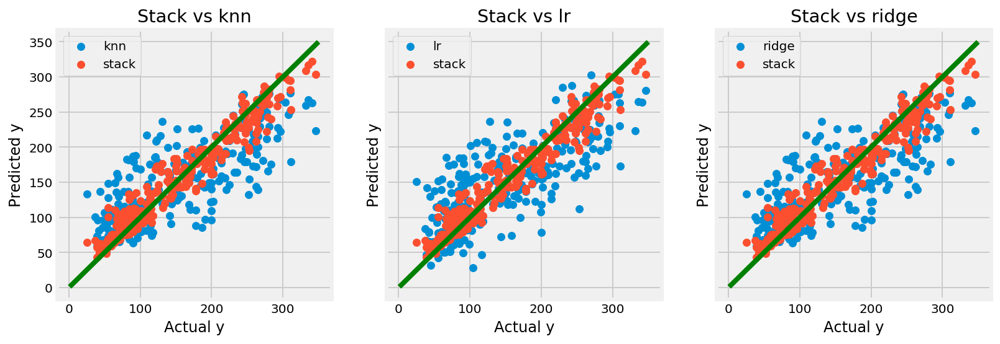

In [111]:
from mlxtend.regressor import StackingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.svm import SVR
import matplotlib.pyplot as plt
import numpy as np
from sklearn.neighbors import KNeighborsRegressor 
from sklearn.ensemble import RandomForestRegressor

#setting up the models and the  stacker

lr = LinearRegression()
knn = KNeighborsRegressor()
ridge = Ridge(random_state=1)
rfr = RandomForestRegressor(n_estimators=100,n_jobs=-1)

stack = StackingRegressor(regressors=[knn, lr, ridge], 
                           meta_regressor=rfr)

# Training the stacking regressor

stack.fit(X_train, y_train)
predictions = stack.predict(X_train)

# Evaluate and visualize the fit

print(f'Mean Squared Error: {np.mean((stack.predict(X_train) - y_train) ** 2)}')
print(f'R2 Stacker: {stack.score(X_train, y_train)}')

#simple plot

lr.fit(X_train,y_train)
lr_pred = lr.predict(X_train)
print(f'R2 linear reg: {lr.score(X_train, y_train)}')

knn.fit(X_train, y_train)
knn_pred = knn.predict(X_train)
print(f'R2 knn reg: {knn.score(X_train, y_train)}')

ridge = ridge.fit(X_train, y_train)
ridge_pred = ridge.predict(X_train)
print(f'R2 Ridge reg: {ridge.score(X_train, y_train)}')


fig, (ax1, ax2, ax3) = plt.subplots(1,3 , sharey=True, figsize = (12,4))

ax1.point_1 = [1, 350]
ax1.plot(ax1.point_1, ax1.point_1, 'g')
ax1.scatter(y_train, knn_pred, label = 'knn')
ax1.scatter(y_train, predictions, label = 'stack')
ax1.set_title('Stack vs knn')
ax1.set_xlabel('Actual y')
ax1.set_ylabel('Predicted y')
ax1.legend()

ax2.point_1 = [1, 350]
ax2.plot(ax1.point_1, ax1.point_1, 'g')
ax2.scatter(y_train, lr_pred, label = 'lr')
ax2.scatter(y_train, predictions, label = 'stack')
ax2.set_title('Stack vs lr')
ax2.set_xlabel('Actual y')
ax2.set_ylabel('Predicted y')
ax2.legend()

ax3.point_1 = [1, 350]
ax3.plot(ax1.point_1, ax1.point_1, 'g')
ax3.scatter(y_train, knn_pred, label = 'ridge')
ax3.scatter(y_train, predictions, label = 'stack')
ax3.set_title('Stack vs ridge')
ax3.set_xlabel('Actual y')
ax3.set_ylabel('Predicted y')
ax3.legend()

ax.legend()
ax.grid(True)




plt.show()

In [112]:
df_ = pd.DataFrame(X_train)

In [160]:

#or very simply
#df - dataframe with results of 3 regressors and true output
# from sklearn linear_model
# stacker= linear_model.LinearRegression()
# stacker.fit(df[['predictedSVR', 'predictedLASSO', 'predictedGBR']], df['predicted'])

from mlxtend.regressor import StackingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.svm import SVR
import matplotlib.pyplot as plt
import numpy as np
from sklearn.neighbors import KNeighborsRegressor 
from sklearn.ensemble import RandomForestRegressor

#setting up the models and the  stacker

lr = LinearRegression()
knn = KNeighborsRegressor()
ridge = Ridge(random_state=1)
rfr = RandomForestRegressor(n_estimators=100,n_jobs=-1)

lr.fit(X_train,y_train)
X_train['lr_pred'] = lr.predict(X_train)
print(f'R2 linear reg: {lr.score(X_train, y_train)}')

knn.fit(X_train, y_train)
X_train['knn_pred'] = knn.predict(X_train)
print(f'R2 knn reg: {knn.score(X_train, y_train)}')

ridge.fit(X_train, y_train)
X_train['ridge_pred'] = ridge.predict(X_train)
print(f'R2 Ridge reg: {ridge.score(X_train, y_train)}')

# # Training the stacking regressor

stacker= LinearRegression()

stacker.fit(X_train[['lr_pred', 'knn_pred', 'ridge_pred']], y_train)

X_train['stack_pred'] = stacker.predict(X_train[['lr_pred', 'knn_pred', 'ridge_pred']])

# # Evaluate and visualize the fit

np.mean((X_train['stack_pred'] - y_train) ** 2)
stacker.score(X_train[['stack_pred']], [y_train])
#print(f'Mean Squared Error: {np.mean((X_train['stack_pred'] - y_train) ** 2)}')
#print(f'R2 Stacker: {stacker.score(X_train['stack_pred'], y_train)}')

# #simple plot




# fig, (ax1, ax2, ax3) = plt.subplots(1,3 , sharey=True, figsize = (12,4))

# ax1.point_1 = [1, 350]
# ax1.plot(ax1.point_1, ax1.point_1, 'g')
# ax1.scatter(y_train, knn_pred, label = 'knn')
# ax1.scatter(y_train, predictions, label = 'stack')
# ax1.set_title('Stack vs knn')
# ax1.set_xlabel('Actual y')
# ax1.set_ylabel('Predicted y')
# ax1.legend()

# ax2.point_1 = [1, 350]
# ax2.plot(ax1.point_1, ax1.point_1, 'g')
# ax2.scatter(y_train, lr_pred, label = 'lr')
# ax2.scatter(y_train, predictions, label = 'stack')
# ax2.set_title('Stack vs lr')
# ax2.set_xlabel('Actual y')
# ax2.set_ylabel('Predicted y')
# ax2.legend()

# ax3.point_1 = [1, 350]
# ax3.plot(ax1.point_1, ax1.point_1, 'g')
# ax3.scatter(y_train, knn_pred, label = 'ridge')
# ax3.scatter(y_train, predictions, label = 'stack')
# ax3.set_title('Stack vs ridge')
# ax3.set_xlabel('Actual y')
# ax3.set_ylabel('Predicted y')
# ax3.legend()

# ax.legend()
# ax.grid(True)




# plt.show()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


R2 linear reg: 0.9577722248433661
R2 knn reg: 0.9604280166304037
R2 Ridge reg: 0.9007263705355543


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-vers

ValueError: shapes (265,1) and (3,) not aligned: 1 (dim 1) != 3 (dim 0)

In [159]:
[y_train]

[array([178., 275., 268., 242., 200., 214., 246., 236.,  85., 114.,  93.,
         99.,  72., 270., 111.,  83.,  87.,  42., 172.,  65., 259., 279.,
        141., 144., 220.,  90., 101.,  53.,  67.,  72., 121., 303., 232.,
        140., 190., 221.,  71., 116., 111., 280., 233.,  78., 150., 283.,
         64., 140.,  65., 225., 206.,  63., 296., 173.,  85., 141.,  50.,
         25., 153.,  55., 139., 336.,  73.,  95., 109.,  44., 180., 263.,
        148.,  79.,  65., 102., 220., 277., 246., 200., 262., 191.,  97.,
        184.,  85., 248., 150., 268.,  59.,  70.,  88., 100., 190., 113.,
         66., 243., 185., 262.,  48., 160., 217., 210., 132., 257., 104.,
        126., 292., 166.,  83.,  81., 144., 281.,  72.,  39., 109.,  60.,
        258., 178., 168.,  87.,  77., 216., 206., 142., 161., 265.,  60.,
        200., 265., 272., 146.,  94.,  55.,  69., 138., 258., 143., 172.,
         89.,  69., 199.,  55.,  45., 265.,  91., 170.,  55., 202., 155.,
         77.,  77.,  71., 123.,  84., 

### Bayes regressor
Good complete overview:
https://blog.applied.ai/tag/scientific-python/
#### Training the model

In [274]:
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
data_regression = datasets.load_diabetes()
df = pd.DataFrame(data_regression['data'], columns=data_regression['feature_names'])
df['ycol'] = data_regression['target']
df.head()
X = df.drop('ycol', axis=1)
y = df['ycol'].values
ss = StandardScaler()
X = ss.fit_transform(X)

In [275]:
predictors_shared.get_value().shape

(442, 10)

In [276]:
outcome_shared.get_value().shape

(442,)

In [277]:
import pymc3 as pm

with pm.Model() as reg:

    pm.glm.GLM(predictors_shared,y=outcome_shared,labels=['age', 'sex', 'bmi', 'bp', 's1', 's2', 's3', 's4', 's5', 's6'])
    step = pm.NUTS()
    start = pm.find_MAP()
    trace = pm.sample(10000,step=step,start=start,tune=1000)

logp = -2,473, ||grad|| = 7.3273: 100%|██████████| 110/110 [00:00<00:00, 1217.35it/s]  
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sd_log__, s6, s5, s4, s3, s2, s1, bp, bmi, sex, age, Intercept]
100%|██████████| 11000/11000 [00:59<00:00, 186.11it/s]


In [278]:
reg_glm_summary = pm.summary(trace[1000:])
reg_glm_summary

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
Intercept,152.142492,2.615691,0.011555,146.964951,157.162908,47947.017318,1.000038
age,-8.640550,59.505586,0.284933,-127.157115,105.630727,41300.327532,0.999986
sex,-237.927239,60.709845,0.316138,-356.123848,-118.287812,42780.911714,1.000013
bmi,520.748244,65.646141,0.310287,392.573528,649.104803,38855.070264,0.999990
bp,322.959538,65.640681,0.302827,199.641276,456.588311,39639.543775,0.999983
s1,-595.268987,363.834957,2.744630,-1312.382276,113.859195,20070.577536,0.999987
s2,320.568596,297.598012,2.115001,-262.573058,901.813968,21466.544630,0.999990
s3,14.458434,191.514500,1.415625,-359.402756,387.582108,21221.363637,1.000000
s4,154.623781,157.422723,0.862981,-149.231322,467.283021,32089.436827,1.000018
s5,675.982138,154.404987,1.053439,371.307336,980.142763,22772.289119,0.999956


100%|██████████| 10000/10000 [00:05<00:00, 1835.51it/s]


(10000, 442)
r2_r(r2_median=0.489952, r2_mean=0.489952, r2_std=0.0)


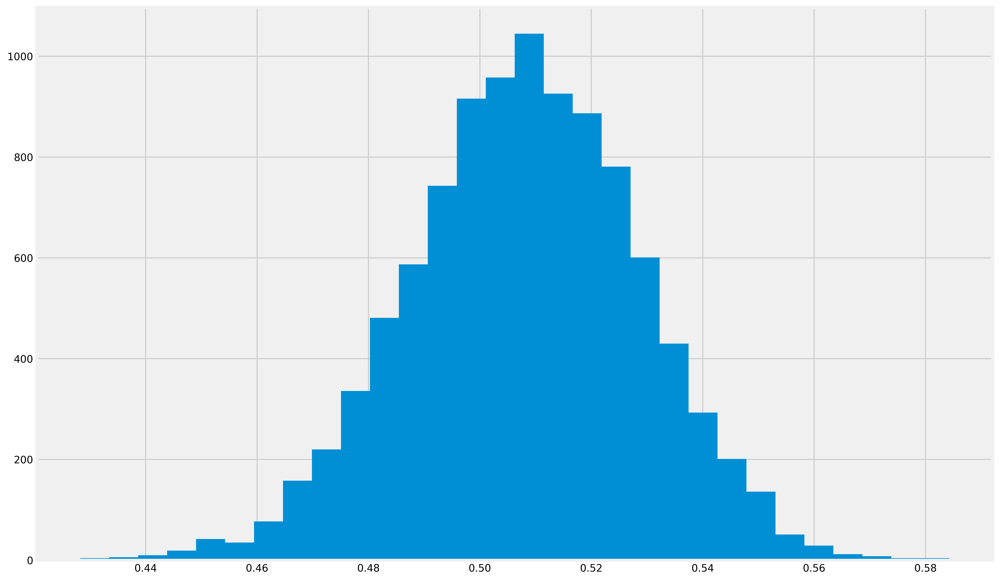

In [279]:
preds = pm.sample_ppc(trace, model=reg)
print(preds['y'].shape)
print(pm.r2_score(df['ycol'], preds['y'][10], round_to=6))
r2_scores = [pm.r2_score(df['ycol'], preds['y'][i],
                         round_to=6).r2_mean for i in range(len(trace))]

plt.hist(r2_scores, bins=30)
plt.show()

In [272]:
# averaging over all samples allows to calculate the usual R2 score
from sklearn import metrics
metrics.r2_score(df['ycol'],preds['y'].mean(axis=0))

0.5170820408835198

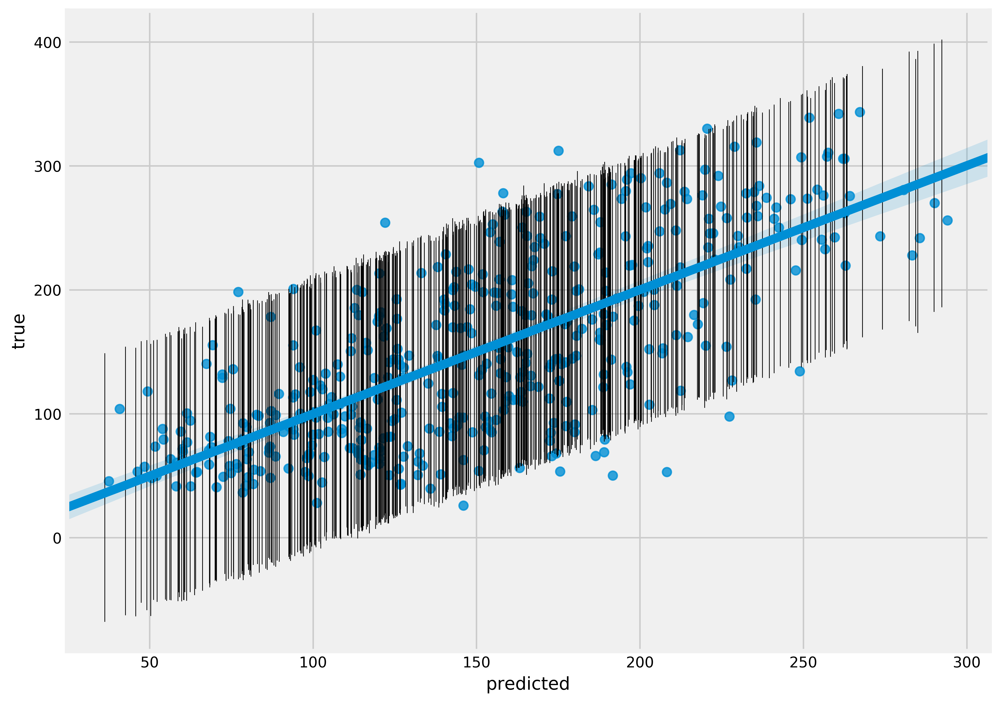

In [273]:
fig, ax  = plt.subplots(figsize = (10,8))
sns.regplot(preds['y'].mean(axis=0)[:],
            df['ycol'].values[:], y_jitter=3, x_jitter=2)
plt.vlines(preds['y'].mean(axis=0)[:],
           pm.stats.hpd(preds['y'])[:,0],
           pm.stats.hpd(preds['y'])[:,1],
          lw=0.5)
plt.xlabel('predicted')
plt.ylabel('true')
plt.show()

### Classifiers
#### KNN
- Does not actually train
- Does not deal with high-dimensionality very well
- Very intuitive

In [21]:
from sklearn.neighbors import KNeighborsClassifier 
model = KNeighborsClassifier(n_neighbors=3,n_jobs=-1)
model.fit(X_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=-1, n_neighbors=3, p=2,
           weights='uniform')

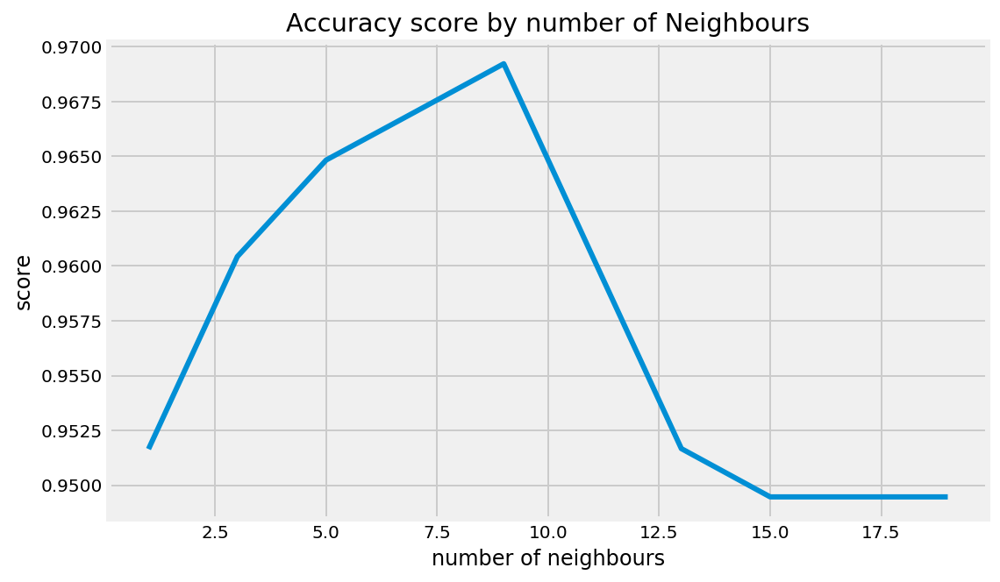

max score: 0.9692306206043744  at: 5 Neighbours


In [22]:
#loop to determine optimum number of neighbors and plotting it
k_values = range(1,20,2)
accs = []
for k in k_values:
    model = KNeighborsClassifier(n_neighbors=k,n_jobs=-1)
    scores = cross_val_score(model, X_train, y_train, cv=5)
    accs.append(np.mean(scores))
    
fig, ax = plt.subplots(figsize=(8,5))
ax.plot(k_values, accs, lw=3)
plt.title('Accuracy score by number of Neighbours')
plt.xlabel('number of neighbours')
plt.ylabel('score')

plt.show()

print ('max score:',np.max(accs),' at:', np.argmax(accs)+1, 'Neighbours')

In [ ]:
params = {'n_neighbors':np.linspace(2,20,2),
             'weights':['uniform', 'distance'],
             'p': [1, 2]}

#### Logistic Regression

In [23]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X_train)

logreg = LogisticRegression()
logreg.fit(X_train, y_train)

print('Logreg intercept:', logreg.intercept_)
print('Logreg coef(s):', logreg.coef_)
print('Logreg predicted probabilities:\n', logreg.predict_proba(X_train[-20:,:]))
print('Logreg predicted labels:\n',logreg.predict(X_train)[-20:])
logreg.score(X_train,y_train)

Logreg intercept: [0.05646111]
Logreg coef(s): [[-0.31861094 -0.41742523 -0.28948052 -0.38519066 -0.12336517  0.54885627
  -0.67927078 -0.97359035 -0.15294121  0.29560481 -1.30179538  0.17891643
  -0.66461805 -0.92992742  0.24633704  0.70350079  0.15021443 -0.34648768
   0.03787099  0.74659216 -0.87051544 -1.2908712  -0.68152057 -0.85123768
  -0.77544439 -0.01086322 -0.70683997 -1.06160506 -0.48278379 -0.60909235]]
Logreg predicted probabilities:
 [[1.59136915e-03 9.98408631e-01]
 [1.39229707e-02 9.86077029e-01]
 [8.78456887e-03 9.91215431e-01]
 [1.27982398e-03 9.98720176e-01]
 [9.99999912e-01 8.80159978e-08]
 [9.99998688e-01 1.31209030e-06]
 [9.80390767e-01 1.96092329e-02]
 [3.31048484e-01 6.68951516e-01]
 [1.33958434e-03 9.98660416e-01]
 [3.14366602e-06 9.99996856e-01]
 [2.29193559e-01 7.70806441e-01]
 [9.99999997e-01 2.94568097e-09]
 [4.63712733e-04 9.99536287e-01]
 [1.43810103e-03 9.98561899e-01]
 [9.77657009e-01 2.23429907e-02]
 [7.03530006e-03 9.92964700e-01]
 [8.97302737e-01 1.0

0.9846153846153847

In [ ]:
params = {'penalty':['l1','l2'],
             'solver':['liblinear'],
             'C': np.logspace(-3,3,50),
             'class_weight' : ['balanced','']
            }

#create your gridsearch object
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression()

gridsearch = GridSearchCV(clf, 
                             params, 
                             n_jobs=-1, cv=5, verbose=1)

#### Decision Trees

In [38]:
# from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
# from sklearn.tree import DecisionTreeClassifier
# import pandas as pd
# import numpy as np
# df = pd.DataFrame({'tweets': ['one', 'two', 'one two three', 'four'], 'labels': [1, 0, 1, 0]})
# vectoriser = CountVectorizer()
# df['tweetsVect'] = list(vectoriser.fit_transform(df['tweets']).toarray())
# tree = DecisionTreeClassifier()
# tree.fit(df['tweetsVect'].tolist(), df['labels'].tolist())

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [73]:

from sklearn.tree import DecisionTreeClassifier
import pandas as pd
import numpy as np
model = DecisionTreeClassifier()
model.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

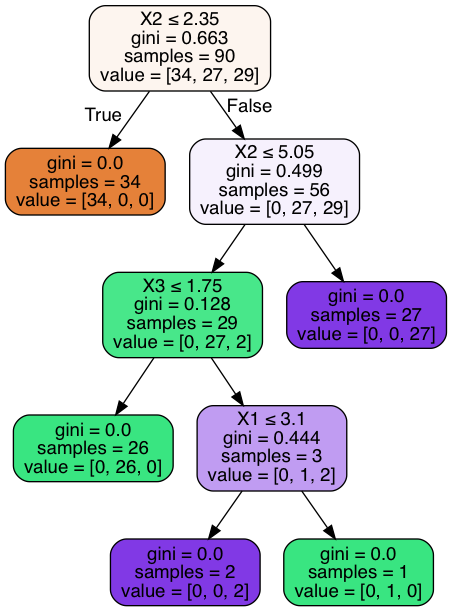

In [74]:
#Print Decision tree
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()  

export_graphviz(model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)  

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())  

In [ ]:
n_estimators = [10, 50, 100, 200]
max_depth = [3, 10, 20, 40]

In [ ]:
from scipy.stats import expon as sp_expon
from scipy.stats import randint as sp_randint

n_estimators = sp_expon(scale=100)
max_depth = sp_randint(1, 40)
#https://www.jeremyjordan.me/hyperparameter-tuning/

In [ ]:
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(rf.get_params())

In [ ]:
#https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
pprint(random_grid)

# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(train_features, train_labels)

rf_random.best_params_

### Adaboost (Learn from your mistakes)

In [161]:
from sklearn.ensemble import AdaBoostClassifier
model = AdaBoostClassifier()
model.fit(X_train, y_train)
print(f"Model Training score:{model.score (X_train, y_train)}, with: {model})" )
print(f"Model Testing score:{model.score (X_test, y_test)}, with: {model})" )

Model Training score:0.04150943396226415, with: AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=50, random_state=None))


ValueError: Number of features of the model must match the input. Model n_features is 14 and input n_features is 10 

In [80]:
model.classes_

array([0, 1, 2])

In [114]:
#from sklearn.datasets import datasets

from sklearn import datasets
iris = datasets.load_iris()
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
clf = make_pipeline(StandardScaler(), svm.SVC(kernel='linear', C=1))
cross_val_score(clf, iris.data, iris.target, cv=5).mean()

0.9666666666666668

In [115]:
model.feature_importances_

array([0.00560026, 0.00400419, 0.77955692, 0.21083863])

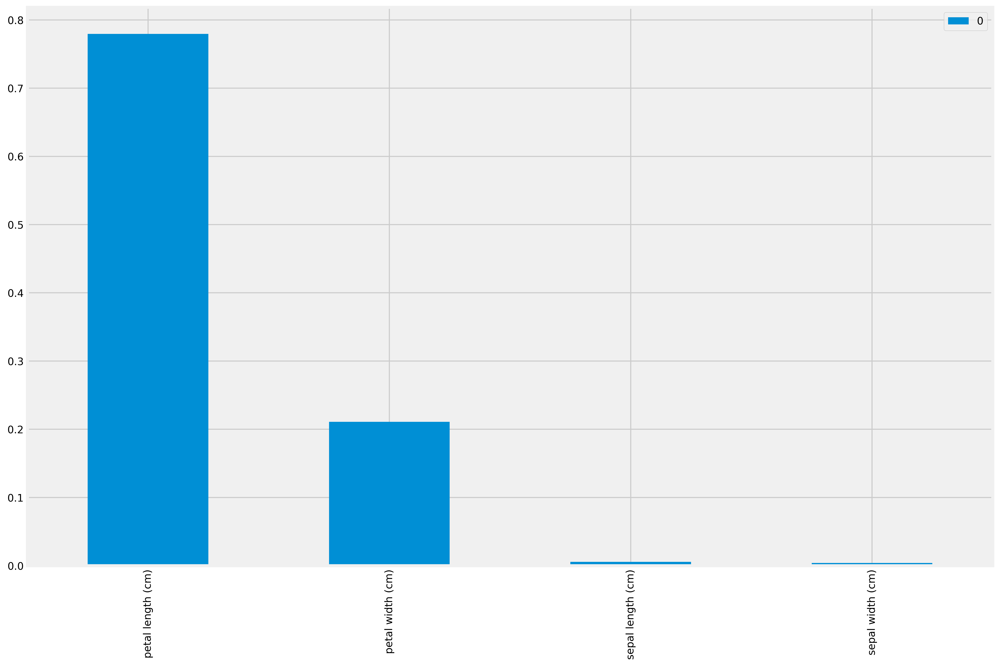

In [116]:
importances = list(zip(model.feature_importances_, df.columns))
importances.sort(reverse=True)
dfimp = pd.DataFrame(importances, index=[x for (_,x) in importances])
pd.DataFrame(importances, index=[x for (_,x) in importances]).plot(kind = 'bar');

In [117]:
importances

[(0.7795569168256049, 'petal length (cm)'),
 (0.21083862984419777, 'petal width (cm)'),
 (0.005600264332476607, 'sepal length (cm)'),
 (0.004004188997720712, 'sepal width (cm)')]

In [53]:
model.

<bound method ClassifierMixin.score of AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=50, random_state=None)>

#### SVM Support Vector Matrices

In [85]:
from sklearn import svm
clf = svm.SVC(kernel='linear', C=1).fit(X_train, y_train)
clf.score(X_train, y_train)  

0.9888888888888889

In [270]:
from sklearn.model_selection import GridSearchCV
from sklearn import svm

clf = svm.SVC()

gamma_range = np.logspace(-5, 2, 10)
C_range = np.logspace(-3, 2, 10)
kernel_range = ['rbf', 'sigmoid', 'linear', 'poly']

param_grid = dict(gamma=gamma_range, C=C_range, kernel=kernel_range)

grid = GridSearchCV(clf, param_grid, cv=3, scoring='accuracy', verbose=1)
grid.fit(X, y)

# check the results of the grid search
print(grid.best_params_)
print(grid.best_score_)

best_svm = grid.best_estimator_

Fitting 3 folds for each of 400 candidates, totalling 1200 fits


/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_validation.py:501: FutureWarning: From version 0.22, errors during fit will result in a cross validation score of NaN by default. Use error_score='raise' if you want an exception raised or error_score=np.nan to adopt the behavior from version 0.22.
  FutureWarning)


ValueError: bad input shape (100, 3)

In [86]:
from sklearn.model_selection import cross_validate
from sklearn.metrics import recall_score
scoring = ['precision_macro', 'recall_macro', 'neg_mean_squared_error']
clf = svm.SVC(kernel='linear', C=1, random_state=0)
scores = cross_validate(clf, iris.data, iris.target, scoring=scoring,
                        cv=5, return_train_score=False)
sorted(scores.keys())
df_scores = pd.DataFrame(scores)
df_scores.iloc[:,2:] #skip first 2 columns

,test_neg_mean_squared_error,test_precision_macro,test_recall_macro
0,-0.033333,0.969697,0.966667
1,-0.000000,1.000000,1.000000
2,-0.033333,0.969697,0.966667
3,-0.033333,0.969697,0.966667
4,-0.000000,1.000000,1.000000


In [ ]:
from sklearn.linear_model import LogisticRegression
#scaler = StandardScaler()
#X = scaler.fit_transform(X)

logreg = LogisticRegression()
logreg.fit(X, y)

print('Logreg intercept:', logreg.intercept_)
print('Logreg coef(s):', logreg.coef_)
print('Logreg predicted probabilities:\n', logreg.predict_proba(X.iloc[-20:,:]))
print('Logreg predicted labels:\n',logreg.predict(X)[-20:])
logreg.score(X,y)

#### Bayes

In [207]:
from sklearn import naive_bayes
classifier = naive_bayes.MultinomialNB()#no .fit see below
from sklearn.model_selection import cross_val_score
print(cross_val_score(classifier, X_train, y_train, cv=5))
#run seperately if you need scores later:
#classifier = naive_bayes.MultinomialNB().fit(X, y)

# The differences can be summarized as follows
# - ***BernoulliNB*** is designed for binary/boolean features
# -    The ** *multinomial Naive Bayes classifier*** is suitable 
# for classification with discrete features(e.g., word counts for 
# text classification). The multinomial distribution normally 
# requires integer feature counts. However, in practice, 
# fractional counts such as `tf-idf` may also work
# - ***GaussianNB*** is designed for continuous features
# (that can be scaled between 0, 1) and is assumed to be normally 
# distributed

[0.78947368 0.84210526 1.         0.88888889 0.875     ]


#### Supervised
##### Single
##### Ensembles
Ensemble has the advantage that individual samples / models not need to be overly accurate, with the ensemble majority vote the ensemble will actually turn out to be a good predictor. If with 100 ensembles 51 actually predict right, the ensemble will score 100% 

In [190]:
X_train

array([[-0.33648508, -0.94217861, -1.09781529, ..., -0.83715297,
        -1.47319316, -0.62603604],
       [ 0.94395054, -0.94217861,  1.08690477, ...,  0.702549  ,
         0.78962562,  0.44026419],
       [ 1.39586899,  1.06136988, -0.30951424, ...,  0.25603543,
        -0.11877339,  1.06227265],
       ...,
       [ 1.24522951,  1.06136988,  0.8616759 , ...,  0.702549  ,
        -0.24222589, -0.62603604],
       [-1.54160096,  1.06136988, -0.1968998 , ..., -0.06730199,
        -0.72119878,  0.26254748],
       [-0.93904302, -0.94217861, -1.00772374, ..., -0.83715297,
        -0.53990191,  0.44026419]])

In [182]:
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor
def do_cross_val(model, X, y):
    scores = cross_val_score(model, X, y, cv=5, n_jobs=1,
                             scoring='neg_mean_squared_error')
    # , scores.std()#, cross_val_score(model, X, y, cv=5, n_jobs=1).mean()
    return -scores.mean()
values = sorted(
    list(set(np.logspace(0, 3, num=20, endpoint=True, base=10.0).astype(int))))
score_list = []
for n in values:
    models = [('Bagging', BaggingRegressor(random_state=1, n_estimators=n)),
              ('RandomForest', RandomForestRegressor(
                  random_state=1, n_estimators=n))
              ]
    for model in models:
        model[1].fit(X_train, y_train)
        train_score_cv = do_cross_val(model[1], X_train, y_train)
        train_predictions = model[1].predict(X_train)
        test_predictions = model[1].predict(X_test)
        train_score = mean_squared_error(y_train, train_predictions)
        test_score = mean_squared_error(y_test, test_predictions)
        score_list.append(
            [model[0], n, train_score_cv, train_score, test_score])
df_scores = pd.DataFrame(score_list, columns=[
                         'model', 'estimators', 'train_mse_cv', 'train_mse', 'test_mse'])
df_scores.head()

,model,estimators,train_mse_cv,train_mse,test_mse
0,Bagging,1,6832.484507,2109.671388,6378.269663
1,RandomForest,1,6419.058229,2110.393768,6644.853933
2,Bagging,2,5150.512696,1298.411473,5704.058989
3,RandomForest,2,5131.856398,1444.639518,4445.469101
4,Bagging,4,4449.529643,878.276912,4070.509831


### Create your own ensemble


### Classifiers - Voting

In [ ]:
from sklearn.ensemble import VotingClassifier
clf1 = linModel.LogisticRegression(random_state=1)
clf2 = ensemble.RandomForestClassifier(random_state=1)
clf3 = GaussianNB()
clf4 = KNeighborsClassifier(n_neighbors=2)

clf = VotingClassifier(estimators=[('lr', clf1), ('rf', clf2), ('gnb', clf3), ('Knb', clf4)], voting='hard',weights=[1,4,1,2])

print("Ensembled Classifier")

scores = cross_val_score(clf, X, Y, cv=4,scoring='f1')
print("F1 score: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

scores = cross_val_score(clf, X, Y, cv=4,scoring='precision')
print("precision: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

scores = cross_val_score(clf, X, Y, cv=4,scoring='accuracy')                                     
print("accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))



### Unsupervised
### KMeans

$Very$ sensitive to outliers, reduce to mean +/- 2 std

In [8]:
from sklearn.cluster import KMeans, k_means
from sklearn.metrics import silhouette_score
#K is the (initial) number of points you are looking for

model = KMeans(n_clusters=3, random_state=0) # use KMeans++ method for generally best results
model.fit(df)

predicted = model.labels_
centroids = model.cluster_centers_

print("Predicted clusters to points: ", predicted)
print("Location of centroids: ")
print(centroids)

df['predicted'] = predicted # assigns predited cluster to 
df.head()

Predicted clusters to points:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 0 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2]
Location of centroids: 
[[5.91568627 2.76470588 4.26470588 1.33333333 1.01960784]
 [5.006      3.428      1.462      0.246      0.        ]
 [6.62244898 2.98367347 5.57346939 2.03265306 2.        ]]


,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),ycol,predicted
0,5.1,3.5,1.4,0.2,0,1
1,4.9,3.0,1.4,0.2,0,1
2,4.7,3.2,1.3,0.2,0,1
3,4.6,3.1,1.5,0.2,0,1
4,5.0,3.6,1.4,0.2,0,1


In [10]:
#Visually verifying cluster labels

from matplotlib import pyplot as plt

df.plot(x="x", y="y", kind="scatter", c=df['predicted'], cmap='Spectral', figsize=(10,8));
plt.scatter(centroids[:,:1], centroids[:,1:], marker='o', s=150, alpha=.7);

KeyError: 'X'

In [185]:
score = silhouette_score(df, predicted, metric='euclidean')
score

0.6034479043142166

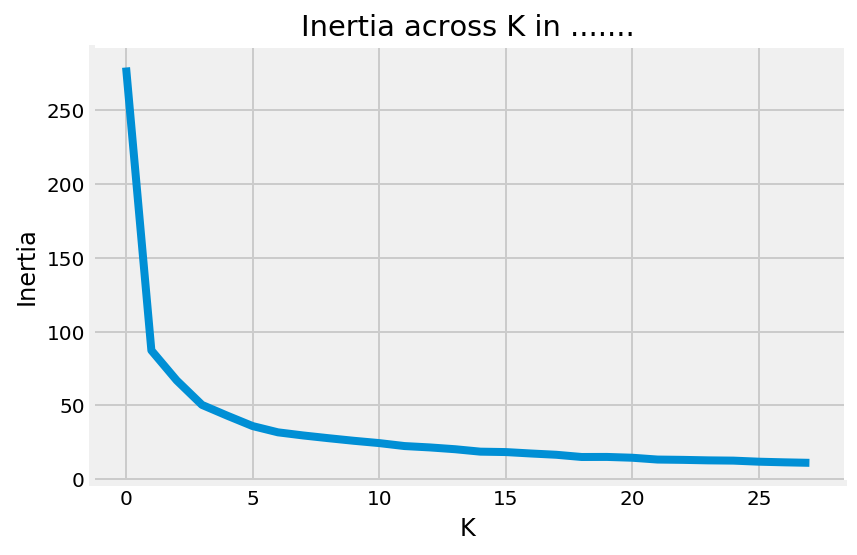

In [11]:
#elbow method:
inertias = []
for n_clusters in range(2,30):
    model = KMeans(n_clusters=n_clusters)
    model.fit(df)
    inertia = model.inertia_
    inertias.append(inertia.mean())

plt.plot(inertias)
plt.ylabel("Inertia")
plt.xlabel("K")
plt.title("Inertia across K in .......")
sns.despine()

#Evaluating clusters when the ground truth is available

# def cluster_score(X, y, labels):
#     print("Silhouette Coefficient: %0.3f"
#           % metrics.silhouette_score(X, labels))
#     print('Estimated number of clusters: %d' % n_clusters_)
#     print("Homogeneity: %0.3f" % metrics.homogeneity_score(y, labels))
#     print("Completeness: %0.3f" % metrics.completeness_score(y, labels))
#     print("V-measure: %0.3f" % metrics.v_measure_score(y, labels))
# labels = model.labels_
# cluster_score(X,y,labels)

### Time series
## Model tuning
### Feature selection
Some models will do this for free (It is a feature not a bug):
- Lasso
- Decision trees

see: The sklearn.feature_selection module implements feature selection algorithms
#### Regressors
##### Feature importance
The feature importance scores of a fit gradient boosting model can be accessed via the feature_importances_ property:
#### Classifiers
##### Class probabilities
### Feature reduction/extraction
https://elitedatascience.com/dimensionality-reduction-algorithms
#### Genetic Algorithms (GA)
#### LDA
#### PCA

In [ ]:
# load pca, standard scaler and dataset
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import load_diabetes

In [187]:
scaler = StandardScaler()
X = df['col1','col2']
# standardize the data
X = pd.DataFrame(scaler.fit_transform(),columns=df.columns)
pca = PCA(n_components=5)
cols = ['PC_{}'.format(i) for i in range(1,pca.n_components+1)]
X_pca = pd.DataFrame(pca.fit_transform(X),columns=cols)
X_pca.head()

KeyError: ('col1', 'col2')

### Gridsearch
## Autolearners
### Auto SKLearn
### AutoML
### H2O
### PyMC3
## Model evaluation
### Bias/Variance Trade-off
The ${\rm Bias}^2$ is the source of error in our model that represents how oversimplified our model is.

#### Bias

$${\rm Bias}^2 = \big(\;\text{E}[\;\hat{f}(x)\;] - f(x)\;\big)^2$$


**What does having a high vs. low bias mean?**
- The ${\rm Bias}^2$ is the source of error in our model that represents how oversimplified our model is.
- If our models are consistently wrong, then the bias will be large.
- Alternatively, if our models are consistently correct then the bias will be small.
- Bias will be small if the errors across our models built on random samples and tested using the same predictors are incorrect in different directions that average out close to 0. 

Linear methods like regression tend to have a high bias because we construct a simplification of the true function.


#### Variance



The second component of error in the model is the variance of our predictions. 

Variance describes the extent to which the individual predictions from models built on different samples (students) deviate from the mean of all the model predictions.

$$\text{Variance} = \text{E}\big[\;(\;\hat{f}(x) - \text{E}[\;\hat{f}(x)\;])^2\;\big]$$

**What does having a high vs. low variance mean?**
- The variance will be large if, for the same observation, models built on different random samples of the data will produce very different predictions.
- Variance is a measure of how *consistent* our model's predictions will be if it were fit on another sample of data. 
- Variance is low if the data we train the model on has very little effect on the predictions.

Note that variance is not a measure of how correct or incorrect the predictions are. It is a measure of how variable they are!

---
#### Higher complexity means higher variance (and lower bias)

---

The variance of predictions across our models goes up as we increase the model complexity. This is equivalent to saying that the variance of our model is increasing.

Increasing the complexity of the model at the expense of good future predictions is known as "overfitting" the data. High variance and overfitting are intrinsically related: if your predictions are inconsistent across samples, you are more likely to make the wrong predictions on future data.

Likewise, high bias and underfitting are related. If your model is too basic, it may give very consistent predictions but at the cost of oversimplifying the relationship between the target and predictors.

** Note ** Decision tree is great for non-linear distributions  
(Naive)Bayes does not mind uneven distribution of categories

### Regressors: Feature importance
### Classifiers:

## Confusion Matrix

#### Four Outcomes of Binary Classification
-  **True positives:** data points labeled as positive that are $actually$ positive
-  **False positives:** data points labeled as positive that are actually negative
-  **True negatives:** data points labeled as negative that are actually negative
-  **False negatives:** data points labeled as negative that are actually positive

#### Recall and Precision Metrics
- **Recall:** ability of a classification model to identify all relevant instances
    - True positive / (True positive + False negative)
    - e.g. Of those that in fact “Returned,” what proportion were classified that way?
- **Precision:** ability of a classification model to return only relevant instances
    - True positive / (True positive + False positive)
    - Of those classified as “Will return,” what proportion actually did?
True positive / (True positive + False positive)
- **F1 score:** single metric that combines recall and precision using the harmonic mean
True positive / (True positive + False positive)
Recall:

#### Visualizing Recall and Precision

- **Confusion matrix:** shows the actual and predicted labels from a classification problem
- **Receiver operating characteristic (ROC) curve:** plots the true positive rate (TPR) versus the false positive rate (FPR) as a function of the model’s threshold for classifying a positive
- **Area under the curve (AUC):** metric to calculate the overall performance of a classification model based on area under the ROC curve

## Plotting

In [ ]:
# Get the most important pieces of information
print("Number of principal components:\t\t", pca.n_components_)
print("Explained variance:\t\t\t", np.round(pca.explained_variance_, 3))
print("Explained variance ratio:\t\t", np.round(pca.explained_variance_ratio_, 3))
print("Cumulative explained variance ratio:\t", np.round(np.cumsum(pca.explained_variance_ratio_), 3))

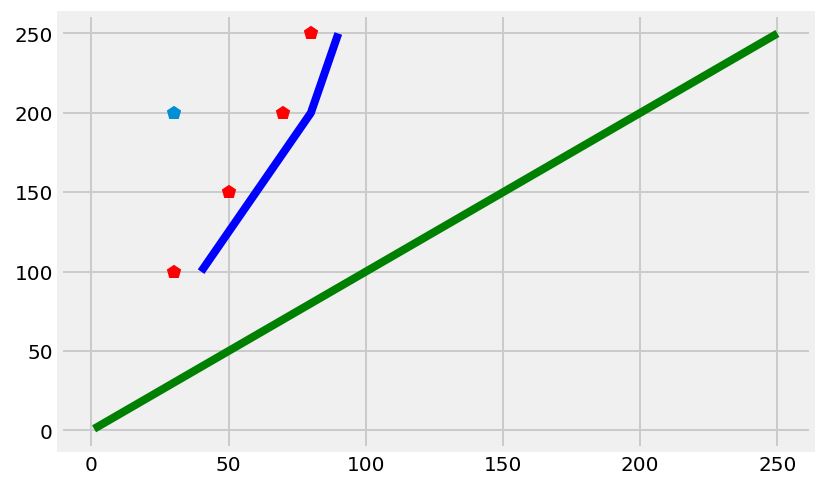

In [259]:

fig, ax = plt.subplots()
point1 = [1,250]
x = [30,50,70,80]
y = [100,150,200,250]
x_ = [40,60, 80,90]
y_ = [110,160,210,260]
plt.plot(point_1,point_1,'g')
plt.plot(30,200, 'p')
plt.plot(x,y, 'pr')
plt.plot(x_,y, 'b')
plt.fill([220, 240], [210, 230]) 

plt.Circle(x,y)
plt.show()

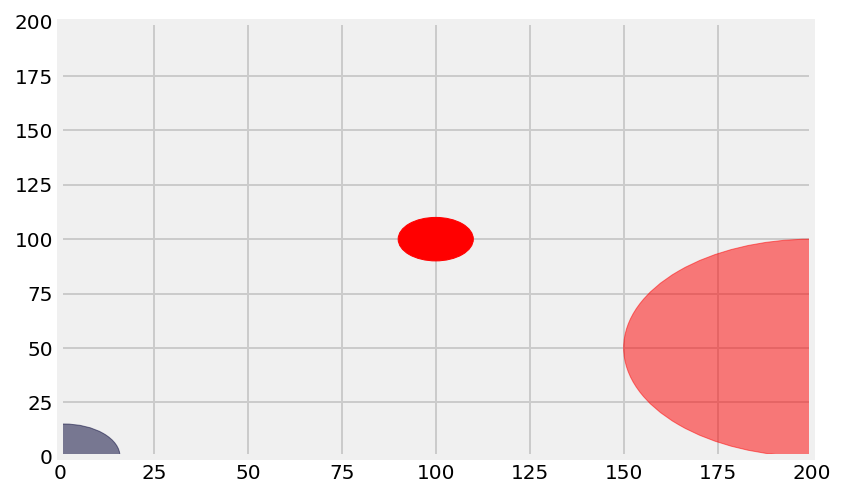

In [181]:
fig, ax = plt.subplots()
ax.add_artist(plt.Circle((200, 50), 50, color='r', alpha=0.5))
ax.add_artist(plt.Circle((1, 0), 15, color='#000033', alpha=0.5))
circle1 = plt.Circle((100, 100), 10, color='r')
#ax=subplot(aspect='equal')
#box1 = plt.Box((50,50), 20,  color='g')
ax.set_xlim((0, 200))
ax.set_ylim((0, 200))
#Use adjustable='box-forced' to make the plot area square-shaped as well.
# ax.set_aspect('equal', adjustable='datalim')
ax.add_artist(circle1)
ax.plot()   #Causes an autoscale update.
plt.show();

In [ ]:
#### SNS 

In [195]:
plt.style.available[:5]

['seaborn-dark',
 'seaborn-darkgrid',
 'seaborn-ticks',
 'fivethirtyeight',
 'seaborn-whitegrid']

In [ ]:
plt.style.use('stylename')

In [ ]:
with plt.style.context('stylename'):
    make_a_plot()

In [2]:
df = pd.read_csv('Pokemon.csv', index_col=0, encoding='ISO-8859-1')

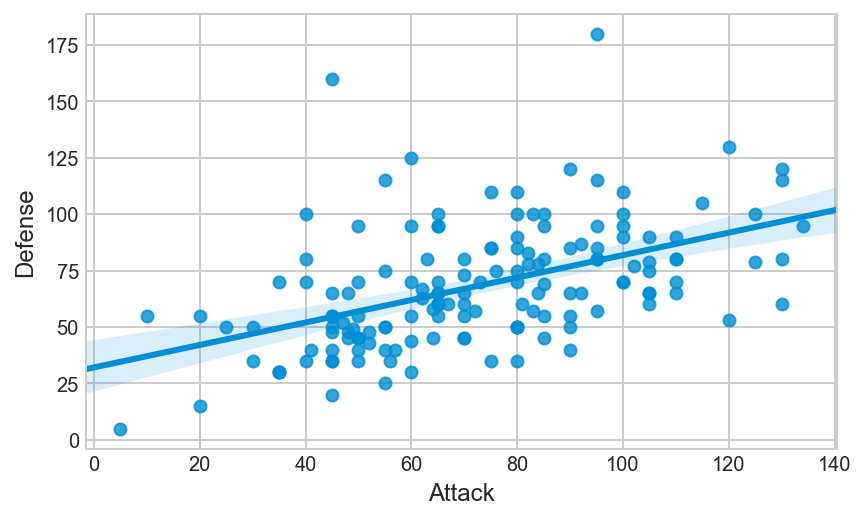

In [3]:
sns.regplot(x='Attack', y='Defense', data=df);

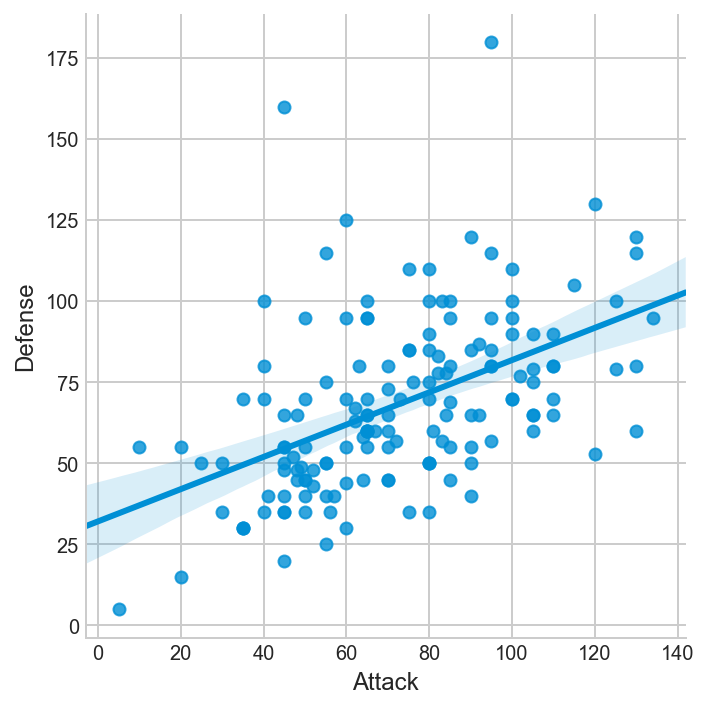

In [4]:
sns.lmplot(x='Attack', y='Defense', data=df);

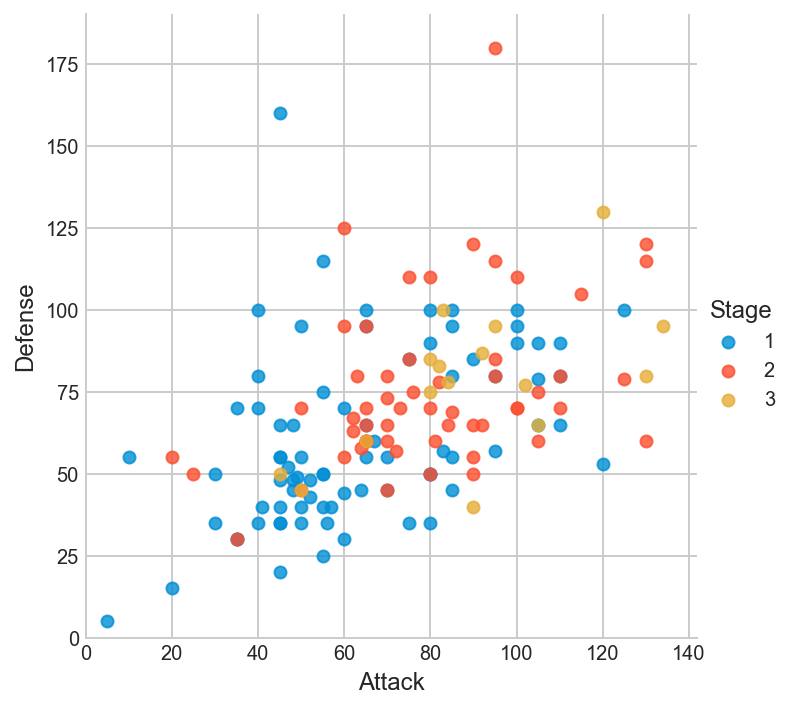

In [5]:
sns.lmplot(x='Attack', y='Defense', data=df,
           fit_reg=False, # No regression line
           hue='Stage');   # Color by evolution stage
# Set axes to start @ 0, can also  be used to view a subsection
plt.ylim(0, None);
plt.xlim(0, None);# ';' takes care of the ugly '<seaborn.axisgrid.FacetGrid at 0x1a1cae6860>'

Often better to wrangle the data with Pandas first and then plot

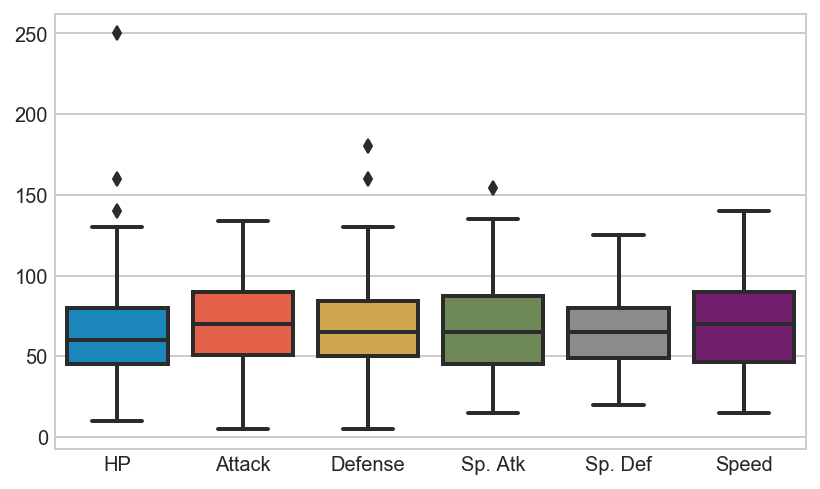

In [6]:
# Pre-format DataFrame
stats_df = df.drop(['Total', 'Stage', 'Legendary'], axis=1)
 
# New boxplot using stats_df
sns.boxplot(data=stats_df);

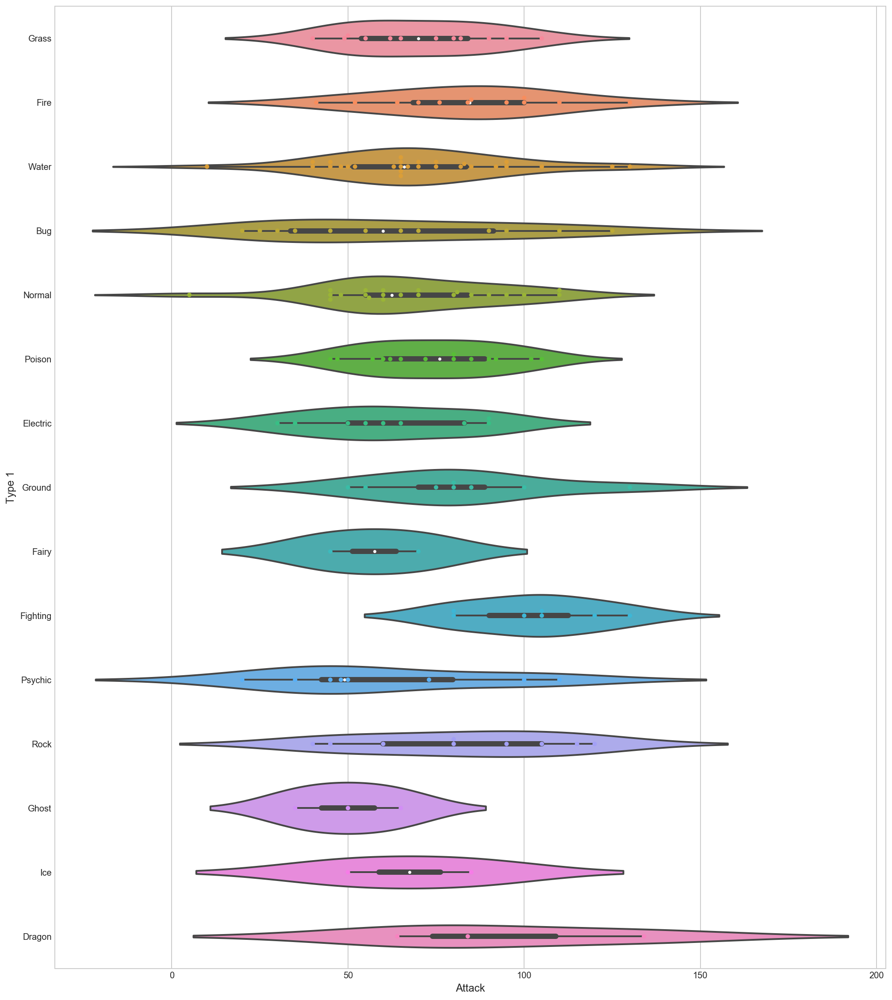

In [18]:
# Set theme
plt.subplots(figsize=(15,20))
sns.set_style('whitegrid')
sns.set_context(rc={"lines.linewidth": 2})
 
# Violin plot
# OK,  I may have failed my Roschach test but a vertically plotted violin plot triggers the wrong
# association with me, Switch x and y and it is plotted horizontally
sns.violinplot(y ='Type 1', x ='Attack', data=stats_df)
sns.swarmplot(y ='Type 1', x ='Attack', data=df);

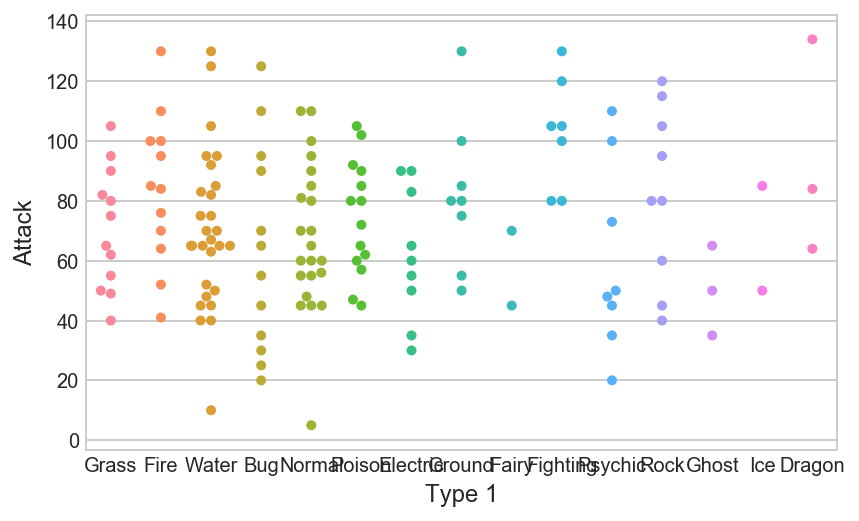

In [11]:
# Swarm plot with Pokemon color palette
sns.swarmplot(x='Type 1', y='Attack', data=df);

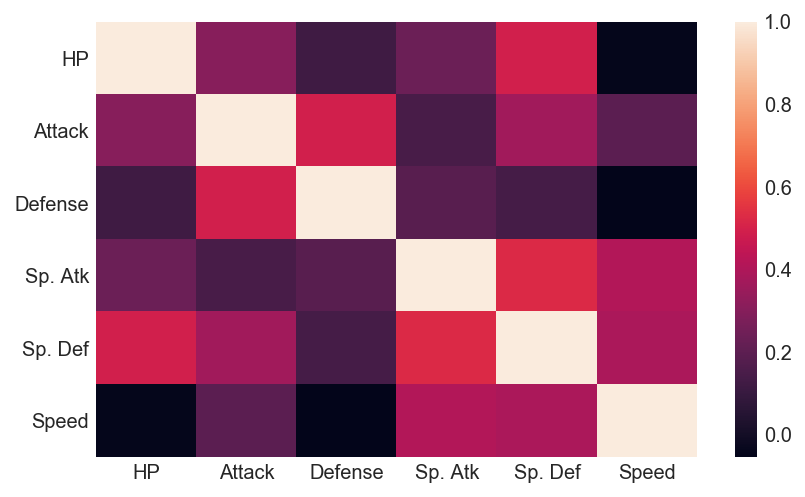

In [97]:
# Calculate correlations
corr = stats_df.corr()
 
# Heatmap
with plt.style.context('seaborn-whitegrid'):
    sns.heatmap(corr);
# Before embarking on a all out cleaning: see what is worthwhile cleaning
# corr = df.corr()['yCol']
# corr[np.argsort(corr, axis=0)[::-1]]

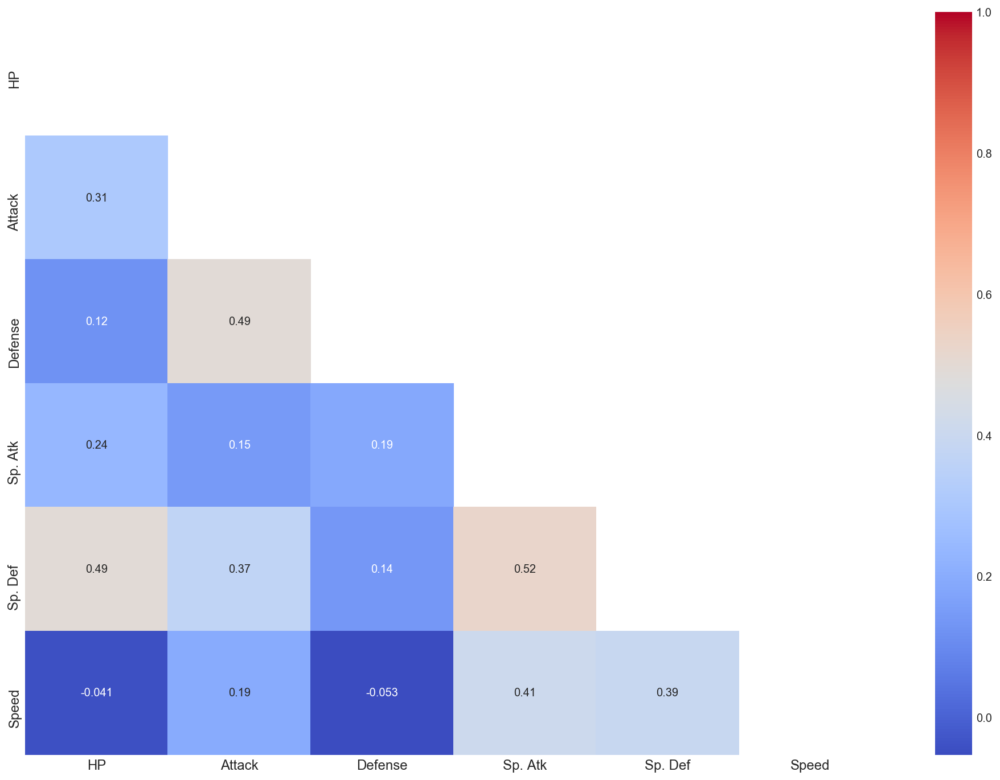

In [95]:
#Create a heatmap using only the variables with a high
fig, ax = plt.subplots(figsize=(15,12))

# Generate a mask for the upper triangle (taken from seaborn example gallery)
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

ax = sns.heatmap(corr, mask=mask,cmap="coolwarm",  ax=ax, annot=True)
ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=12)
ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=12)
plt.show()

In [32]:
df['Attack'] = np.log(df['Attack'])

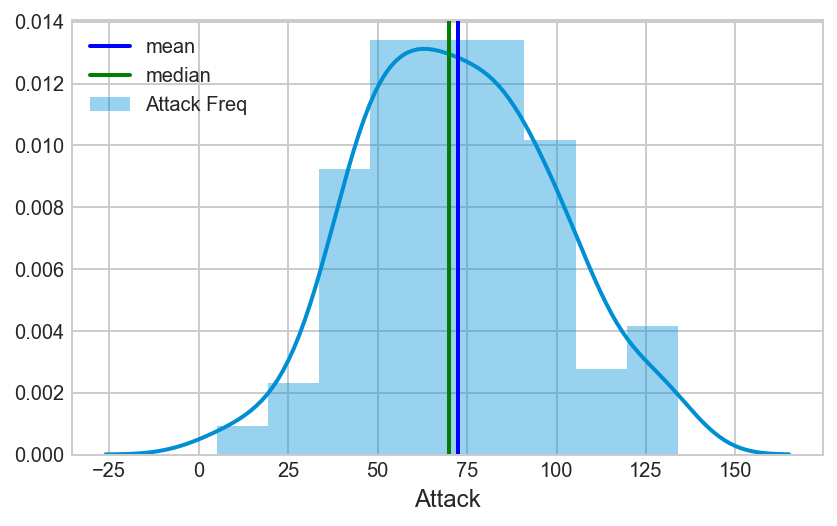

In [262]:
sns.distplot(df['Attack'], label = 'Attack Freq')
plt.axvline(df['Attack'].mean(), label ='mean', color = 'b', lw= 2)
plt.axvline(df['Attack'].median(), label ='median', color = 'g', lw= 2)
plt.legend(loc = 2)
plt.show();

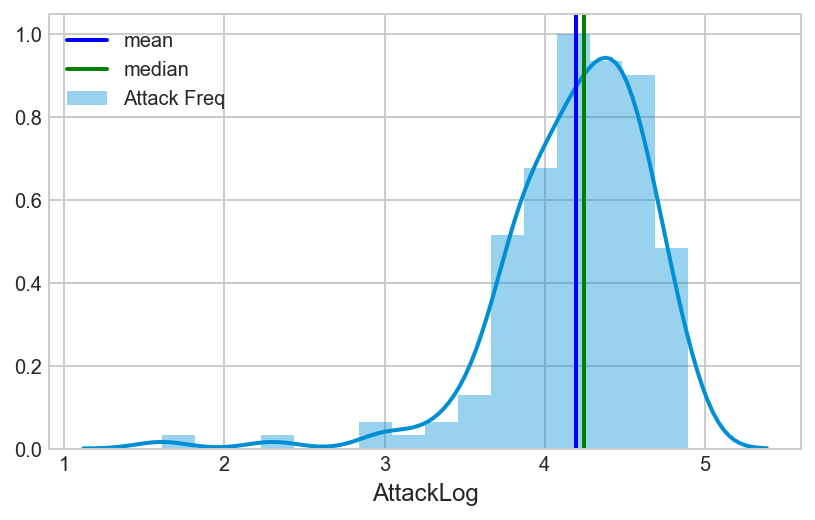

In [264]:
sns.distplot(df['AttackLog'],label = 'Attack Freq')
plt.axvline(df['AttackLog'].mean(), label ='mean', color = 'b', lw= 2)
plt.axvline(df['AttackLog'].median(), label ='median', color = 'g', lw= 2)
plt.legend(loc = 2)
plt.show();

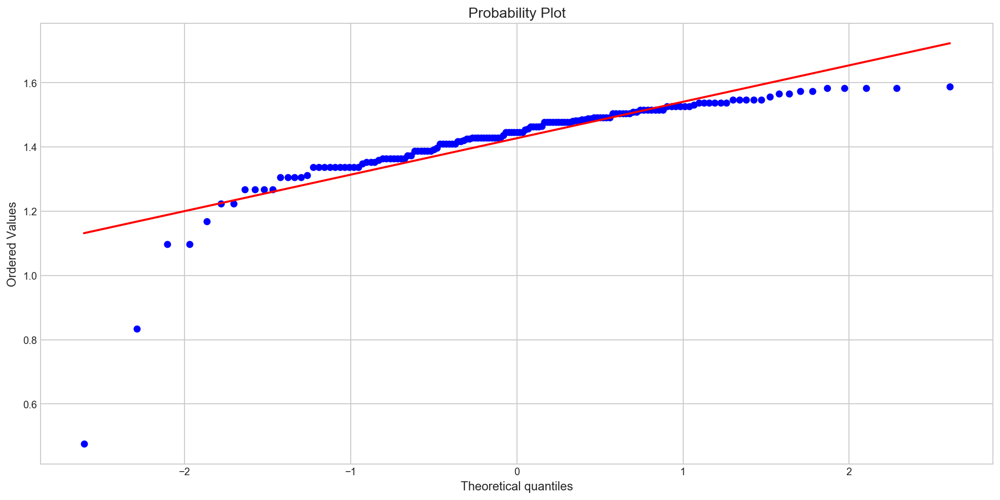

In [41]:
import scipy.stats as stats
fig = plt.figure(figsize=(15, 8))
x = df['Attack']
stats.probplot(x, plot=plt)
plt.show()

Numerical plots,

## Production
### Rerun on full test set
### Predictions
### Pipelines
### Websites

# Maths
## Combinations/Permutations
## Probabilities
### Frequentsis (counters)
### Bayes(believers)
## Matrices

In [260]:
!pwd

/Users/maartenkool/Desktop


In [43]:
word = 'abcdefghij'
print(word)
print(word[4])
print(word[:4])
print(word[4:])
print(word[2:4])
print(word[2:9:2])
print(word[-4:])
[print(word) for i in word]
[print(i) for i in word]
[print(i[:4]) for i in word]
[print(i) for i in word if i in['c', 'd', 'e']]
[print('yes') for i in word if i in['c', 'd', 'e'] if i in ['c']]
[print('yes') if i in['c', 'd', 'e'] else print(i) for i in word]
lijst = list(word)
print(lijst)

abcdefghij
e
abcd
efghij
cd
cegi
ghij
abcdefghij
abcdefghij
abcdefghij
abcdefghij
abcdefghij
abcdefghij
abcdefghij
abcdefghij
abcdefghij
abcdefghij
a
b
c
d
e
f
g
h
i
j
a
b
c
d
e
f
g
h
i
j
c
d
e
yes
a
b
yes
yes
yes
f
g
h
i
j
['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']


In [28]:
from sklearn.preprocessing import PowerTransformer

In [ ]:
ft = FunctionTransformer()

In [35]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer()
X = df.col2.values.reshape(-1, 1)
df['col8'] = pt.fit_transform(X) 
df


,Col0,Col1,col2,col3,col4,col_a,col_b,colc,ycol,col6,col5,col8
0,row1,1,1.1,-4,excellent,aaa,red,square,1,5,5,-1.712525
1,row2,2,2.2,-3,excellent,bbb,blue,square,1,5,5,-1.253380
2,row3,3,3.3,-2,very good,ccc,green,square,1,4,4,-0.840753
3,row4,4,4.4,-1,very good,ddd,orange,circle,1,4,4,-0.455700
4,row5,5,5.5,0,good,eee,yellow,circle,1,3,3,-0.089934
5,row6,6,6.6,1,good,fff,purple,circle,0,3,3,0.261163
6,row_7,7,7.7,2,fair,ggg,white,triangle,0,2,2,0.600512
7,row_8,8,8.8,Nan,fair,hhh,black,triangle,0,2,2,0.930119
8,Row9,9,9.9,4,appalling,iii,brown,triangle,0,1,1,1.251438
9,Row10,10,10.1,5,appalling,jjj,gray,triangle,0,1,1,1.309060


In [26]:
np.log(100)

4.605170185988092

In [44]:
print(lijst)
lijst.index('g')
print(lijst[4])
print(lijst[:4])
print(lijst[4:])
print(lijst[2:4])
print(lijst[2:9:2])
print(lijst[-4:])
[print(lijst) for i in lijst]
[print(i) for i in lijst]
[print(i[:4]) for i in lijst]
[print(i) for i in lijst if i in['c', 'd', 'e']]
[print('yes') for i in lijst if i in['c', 'd', 'e'] if i in ['c']]
[print('yes') if i in['c', 'd', 'e'] else print(i) for i in lijst]
lol = list(lijst for i in range(3))
lol
print(lol)





['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
e
['a', 'b', 'c', 'd']
['e', 'f', 'g', 'h', 'i', 'j']
['c', 'd']
['c', 'e', 'g', 'i']
['g', 'h', 'i', 'j']
['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
a
b
c
d
e
f
g
h
i
j
a
b
c
d
e
f
g
h
i
j
c
d
e
yes
a
b
yes
yes
yes
f
g
h
i
j
[['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j'], ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j'], ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']]


In [38]:
lol = [['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j'],
       ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j'],
       ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j'],
       ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j'],
       ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']]
print(lol[2])
print(lol[2][2])
print(lol[2].index('g'))
print(lol[3][::2])
print(lol[3][::-2])
for item in lol:
    print(item)
for item in lol:
    for i in item:
print(i[print(i) for i in lijst if i in['c', 'd', 'e']]


['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
c
6
['a', 'c', 'e', 'g', 'i']
['j', 'h', 'f', 'd', 'b']
['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j']
a
b
c
d
e
f
g
h
i
j
a
b
c
d
e
f
g
h
i
j
a
b
c
d
e
f
g
h
i
j
a
b
c
d
e
f
g
h
i
j
a
b
c
d
e
f
g
h
i
j


In [29]:
import pandas as pd  # example .apply with custom function
import numpy as np
_arr = np.random.randint(50, size=(4, 5))
df = pd.DataFrame(_arr)


def cube(x):
    return x ** 3


def sqrt_(x):
    return x ** 2


df.loc[:, 4] = df.loc[:, 4].map(sqrt_)
df.apply(cube)

,0,1,2,3,4
0,91125,729,91125,50653,1771561
1,9261,110592,1728,64,7529536
2,68921,0,1728,2197,729
3,2744,8000,42875,8,1073741824


In [2]:
list1 = 1,2,3,4,5
lista = list('abcde')
listc = list('!@#$%')


dicta = {num:letter for  num,letter in zip(list1,lista) if (num < 4) and (letter in 'ab') }
dicta
dictb = {num:letter for  num,letter in zip(list1,lista)}

In [ ]:
dictb = {key:value for key in list1 for value in {}}

In [10]:
{key:value for key in list1 for value in }

{}

In [13]:
{key:{lista[i]:listc[i]} for i,key in enumerate(list1)}

{1: {'a': '!'}, 2: {'b': '@'}, 3: {'c': '#'}, 4: {'d': '$'}, 5: {'e': '%'}}

In [2]:
dict(zip(lista,listc))

{'a': '!', 'b': '@', 'c': '#', 'd': '$', 'e': '%'}

In [9]:
dict(zip(lista,listc))

{'a': '!', 'b': '@', 'c': '#', 'd': '$', 'e': '%'}

In [8]:
dict(zip(list1,dict(zip(lista,listc)).items()))

{1: ('a', '!'), 2: ('b', '@'), 3: ('c', '#'), 4: ('d', '$'), 5: ('e', '%')}

In [59]:
listc

['!', '@', '#', '$', '%']

In [56]:
list1 = ('12345')

In [58]:
eval(list1)

12345

In [4]:
#merge 2 dicts
dictc= {**dicta, **dictb}
dictc

{1: 'a', 2: 'b', 3: 'c', 4: 'd', 5: 'e'}

In [15]:
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

In [16]:
(stats.norm().ppf([0.05,0.95]))

array([-1.64485363,  1.64485363])

In [262]:
!pwd

/Users/maartenkool/Desktop


In [ ]:
# def item_category_maker(x):
#     x = x.lower() #force lowercase
#     if 'chips' in x:
#         return 'chips'
#     elif ('burrito' in x) or ('bowl' in x):
#         return 'burrito'
#     elif 'taco' in x:
#         return 'taco'
#     elif 'salad' in x:
#         return 'salad'
#     else:
#         return 'drink'# have a left over answer
    
# chip['broad_type'] = chip.item_name.map(item_category_maker)
# print(chip.broad_type.unique())
# print(chip.broad_type.value_counts())

In [ ]:
# Filter on rows
filtering_mask = (earnings['Time'] == 2016) & (earnings['Statistics'] == 'Mean') & (
    earnings['Sex'] == 'All') & (earnings['Workingpattern'] == 'All') & (earnings['Earnings'] == 'Weekly pay - Gross')
earnings_row_filt = earnings[filtering_mask]

#sum(filtering_mask)

# Filter on columns
columns_filt = [column for column in earnings.columns if '_codelist' not in column] 
columns_filt = [column for column in columns_filt if column not in ['Data marking', 
                                                                    'Coefficient of variation',
                                                                    'Sex',
                                                                    'Workingpattern']]
earnings_col_filt = earnings_row_filt[columns_filt]

# Rename columns and reset_index
rename_cols = {'V4_2':'Value',
                 'ashe-geography':'Geography_code'}
earnings_col_filt = earnings_col_filt.rename(rename_cols, axis = 1)
earnings_col_filt = earnings_col_filt.reset_index(drop=True)

In [5]:
import numpy as np
a = np.empty(15,)
a[::2] = 1
a[1::2] = 2
a

array([1., 2., 1., 2., 1., 2., 1., 2., 1., 2., 1., 2., 1., 2., 1.])

In [22]:
a = []
for i in range(5):
    a.append(1)
    a.append(2)
a

[1, 2, 1, 2, 1, 2, 1, 2, 1, 2]

In [18]:
type(a)

list

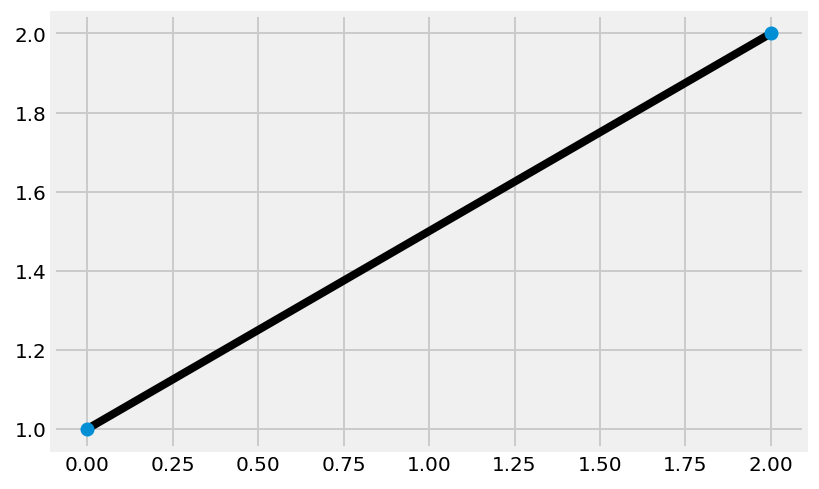

In [1]:
# Draw a straight line
#read the list of points as (x0, x1), (y0, y1)
data = [[0, 2], [1, 2]]

plt.plot(data[0], data[1], "k-")
plt.plot(data[0], data[1], "o")
plt.show()

In [247]:
#Plot x vs y 
df = pd.DataFrame(sample_data, columns=["x", "y"])

# plot the data with regplot
my_plot = df.plot(kind="scatter", x="x", y="y",
                  title="Sample Data", figsize=(10, 5))

# Add value markers because it's nice to have a visual reference to data points
for point in sample_data:
    my_plot.text(point[0] + .2, point[1] - .02, str(point))

sns.regplot(x="x", y="y", data=df)
plt.show()

NameError: name 'sample_data' is not defined

In [ ]:
# simple scatter plot with line
df.plot.scatter(x = 'x', y = 'y')
plt.plot([0,50],[100,100])

In [ ]:
#remove outlier
remove_out = pd.DataFrame({'height':height, 'weight':weight[:,0]})
height_mean = np.mean(height)
height_std = np.std(height)
remove_out['height_outlier'] = (np.abs(remove_out.height - height_mean) > 1.5*height_std)
print (remove_out.height_outlier.sum())

height_no = remove_out.height[~remove_out.height_outlier].values
weight_no = remove_out.weight[~remove_out.height_outlier].values
print (weight_no.shape)
weight_no = weight_no.reshape(weight_no.shape[0], 1)
print (height_no.shape, weight_no.shape)

In [ ]:
#trick to split ascci data
# Load the diabetes dataset
columns = "age sex bmi map tc ldl hdl tch ltg glu".split()
diabetes = datasets.load_diabetes()
df = pd.DataFrame(diabetes.data, columns=columns)
y = diabetes.target
# Take a look at the data again
print(df.head())
print(df.shape)

In [ ]:
bcw['bare_nuclei'] = bcw.bare_nuclei.map(
    lambda x: int(x) if not x == '?' else np.nan)
bcw.dropna(inplace=True)

In [ ]:
y = hsq['gender']# !!! column
X = hsq[predictors] #!!!list

In [ ]:
# new colum with 0 and 1's
data['host_wins'] = (data['HostName'] == data['winner']).astype(int)

In [ ]:
# create a folder "app"
import os
folder_ = "./app"
if not os.path.exists(folder_):
    os.makedirs(folder_)

In [261]:
!pwd

/Users/maartenkool/Desktop


# Appendix

Automatically created module for IPython interactive environment


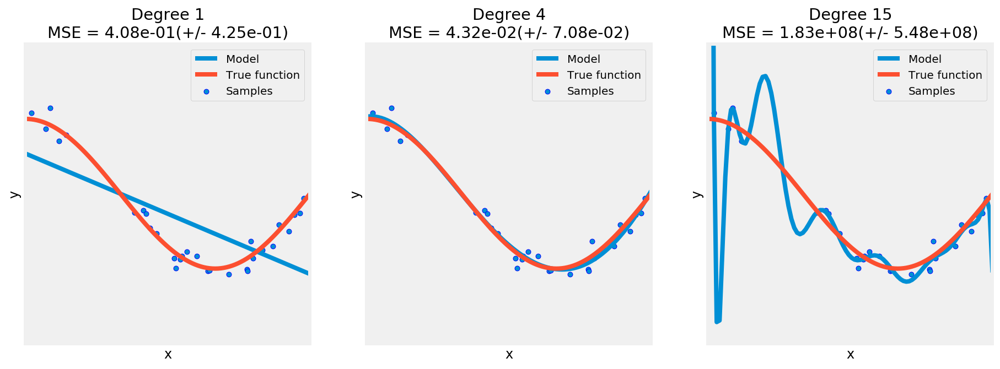

In [2]:
#SKlearn overview of underfitting and overfitting
# http://scikit-learn.org/stable/auto_examples/model_selection/plot_underfitting_overfitting.html
print(__doc__)

import numpy as np
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score


def true_fun(X):
    return np.cos(1.5 * np.pi * X)

np.random.seed(0)

n_samples = 30
degrees = [1, 4, 15]

X = np.sort(np.random.rand(n_samples))
y = true_fun(X) + np.random.randn(n_samples) * 0.1

plt.figure(figsize=(14, 5))
for i in range(len(degrees)):
    ax = plt.subplot(1, len(degrees), i + 1)
    plt.setp(ax, xticks=(), yticks=())

    polynomial_features = PolynomialFeatures(degree=degrees[i],
                                             include_bias=False)
    linear_regression = LinearRegression()
    pipeline = Pipeline([("polynomial_features", polynomial_features),
                         ("linear_regression", linear_regression)])
    pipeline.fit(X[:, np.newaxis], y)

    # Evaluate the models using crossvalidation
    scores = cross_val_score(pipeline, X[:, np.newaxis], y,
                             scoring="neg_mean_squared_error", cv=10)

    X_test = np.linspace(0, 1, 100)
    plt.plot(X_test, pipeline.predict(X_test[:, np.newaxis]), label="Model")
    plt.plot(X_test, true_fun(X_test), label="True function")
    plt.scatter(X, y, edgecolor='b', s=20, label="Samples")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.xlim((0, 1))
    plt.ylim((-2, 2))
    plt.legend(loc="best")
    plt.title("Degree {}\nMSE = {:.2e}(+/- {:.2e})".format(
        degrees[i], -scores.mean(), scores.std()))
plt.show()

Automatically created module for IPython interactive environment


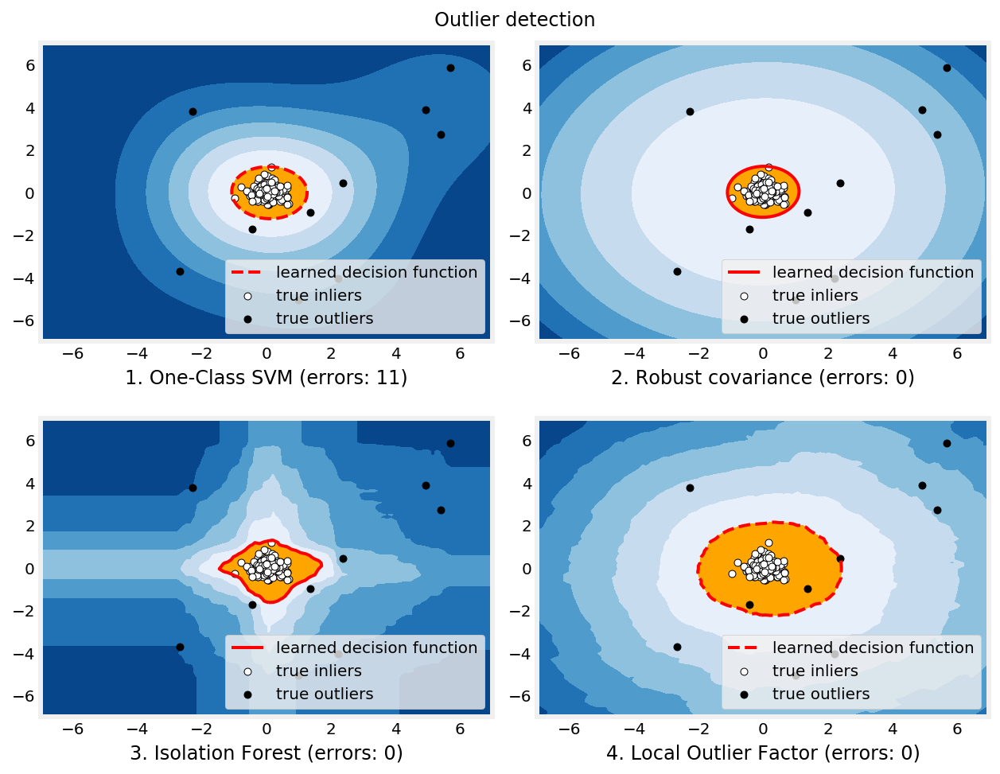

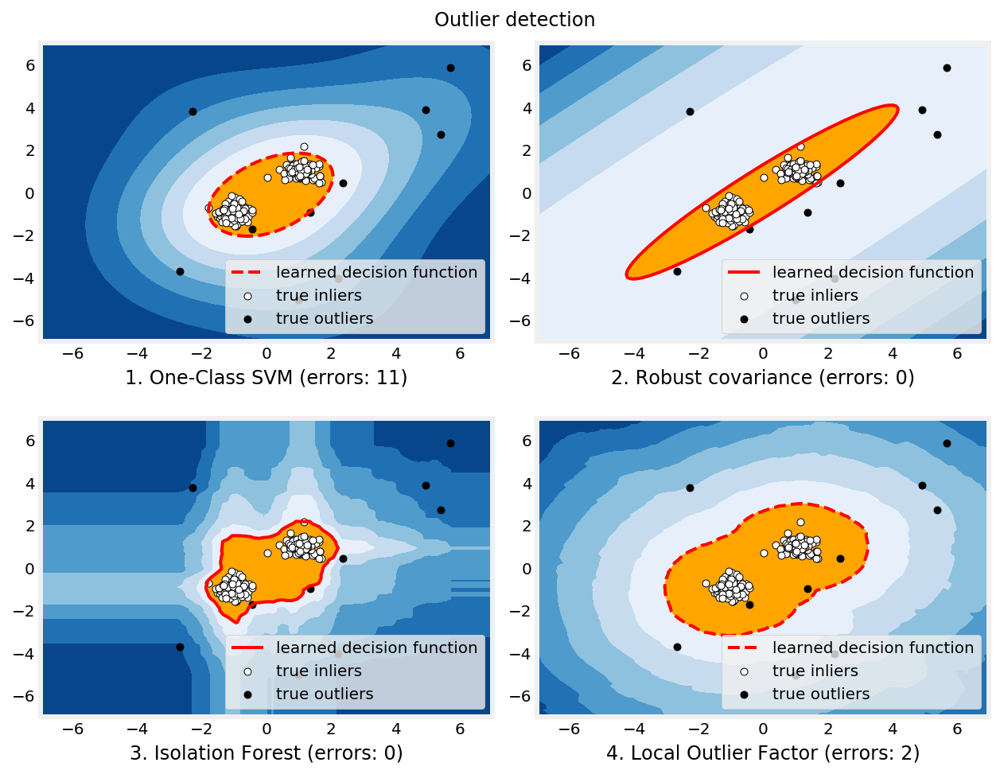

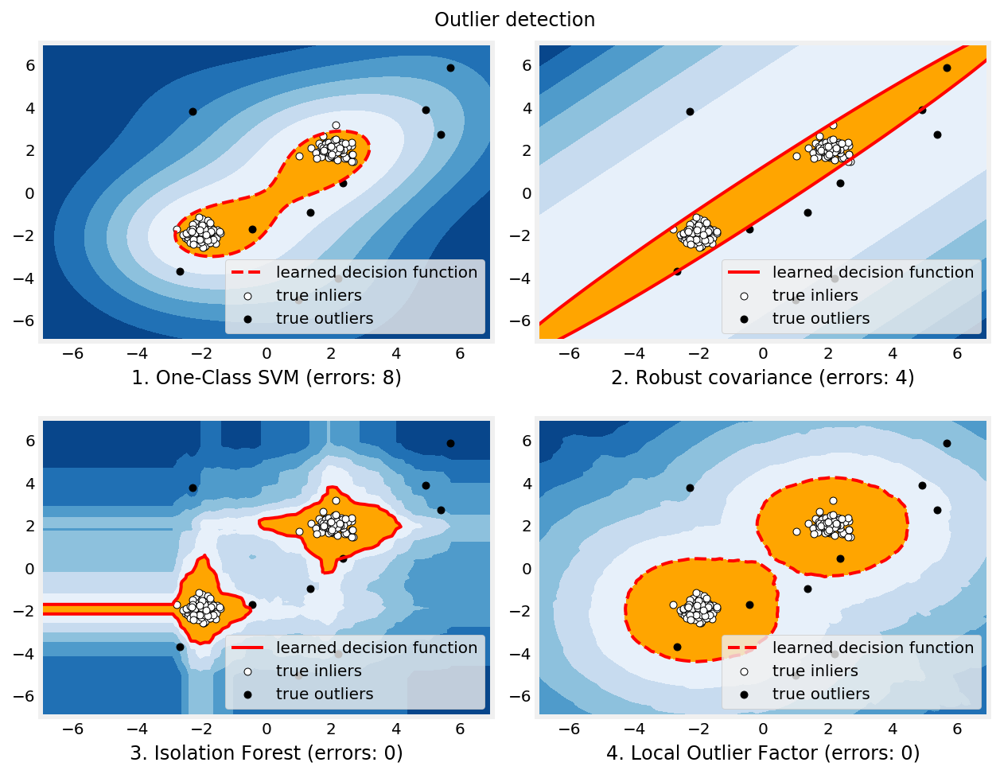

In [19]:
# SKlearn, advanced outlier example
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import matplotlib.font_manager

from sklearn import svm
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

print(__doc__)

rng = np.random.RandomState(42)

# Example settings
n_samples = 200
outliers_fraction = 0.05
clusters_separation = [0, 1, 2]

# define two outlier detection tools to be compared
classifiers = {
    "One-Class SVM": svm.OneClassSVM(nu=0.95 * outliers_fraction + 0.05,
                                     kernel="rbf", gamma=0.1),
    "Robust covariance": EllipticEnvelope(contamination=outliers_fraction),
    "Isolation Forest": IsolationForest(max_samples=n_samples,
                                        contamination=outliers_fraction,
                                        random_state=rng),
    "Local Outlier Factor": LocalOutlierFactor(
        n_neighbors=35,
        contamination=outliers_fraction)}

# Compare given classifiers under given settings
xx, yy = np.meshgrid(np.linspace(-7, 7, 100), np.linspace(-7, 7, 100))
n_inliers = int((1. - outliers_fraction) * n_samples)
n_outliers = int(outliers_fraction * n_samples)
ground_truth = np.ones(n_samples, dtype=int)
ground_truth[-n_outliers:] = -1

# Fit the problem with varying cluster separation
for i, offset in enumerate(clusters_separation):
    np.random.seed(42)
    # Data generation
    X1 = 0.3 * np.random.randn(n_inliers // 2, 2) - offset
    X2 = 0.3 * np.random.randn(n_inliers // 2, 2) + offset
    X = np.r_[X1, X2]
    # Add outliers
    X = np.r_[X, np.random.uniform(low=-6, high=6, size=(n_outliers, 2))]

    # Fit the model
    plt.figure(figsize=(9, 7))
    for i, (clf_name, clf) in enumerate(classifiers.items()):
        # fit the data and tag outliers
        if clf_name == "Local Outlier Factor":
            y_pred = clf.fit_predict(X)
            scores_pred = clf.negative_outlier_factor_
        else:
            clf.fit(X)
            scores_pred = clf.decision_function(X)
            y_pred = clf.predict(X)
        threshold = stats.scoreatpercentile(scores_pred,
                                            100 * outliers_fraction)
        n_errors = (y_pred != ground_truth).sum()
        # plot the levels lines and the points
        if clf_name == "Local Outlier Factor":
            # decision_function is private for LOF
            Z = clf._decision_function(np.c_[xx.ravel(), yy.ravel()])
        else:
            Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
        Z = Z.reshape(xx.shape)
        subplot = plt.subplot(2, 2, i + 1)
        subplot.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7),
                         cmap=plt.cm.Blues_r)
        a = subplot.contour(xx, yy, Z, levels=[threshold],
                            linewidths=2, colors='red')
        subplot.contourf(xx, yy, Z, levels=[threshold, Z.max()],
                         colors='orange')
        b = subplot.scatter(X[:-n_outliers, 0], X[:-n_outliers, 1], c='white',
                            s=20, edgecolor='k')
        c = subplot.scatter(X[-n_outliers:, 0], X[-n_outliers:, 1], c='black',
                            s=20, edgecolor='k')
        subplot.axis('tight')
        subplot.legend(
            [a.collections[0], b, c],
            ['learned decision function', 'true inliers', 'true outliers'],
            prop=matplotlib.font_manager.FontProperties(size=10),
            loc='lower right')
        subplot.set_xlabel("%d. %s (errors: %d)" % (i + 1, clf_name, n_errors))
        subplot.set_xlim((-7, 7))
        subplot.set_ylim((-7, 7))
    plt.subplots_adjust(0.04, 0.1, 0.96, 0.94, 0.1, 0.26)
    plt.suptitle("Outlier detection")

plt.show()

/anaconda3/lib/python3.6/site-packages/sklearn/svm/base.py:913: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/svm/base.py:913: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


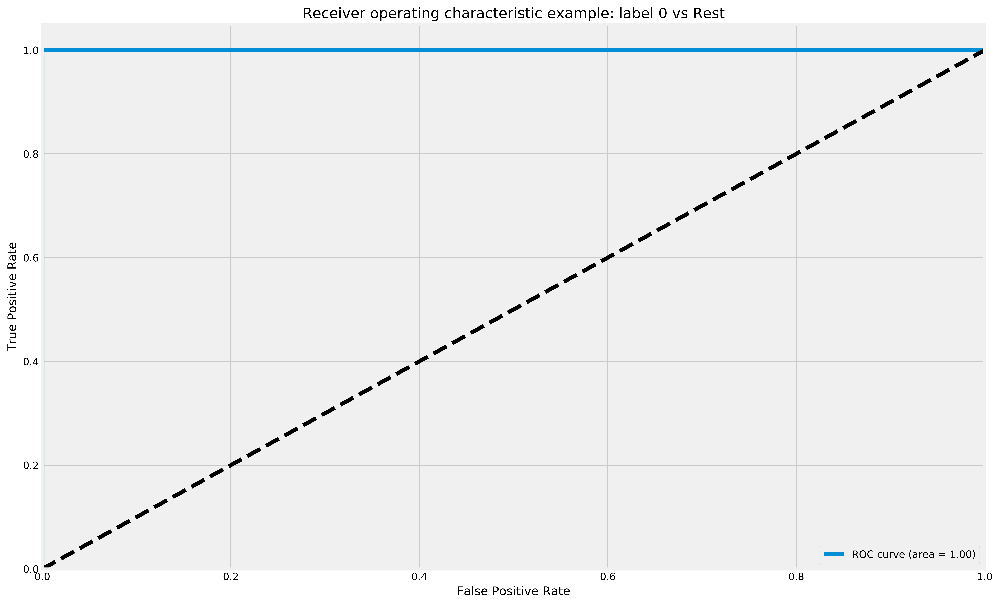

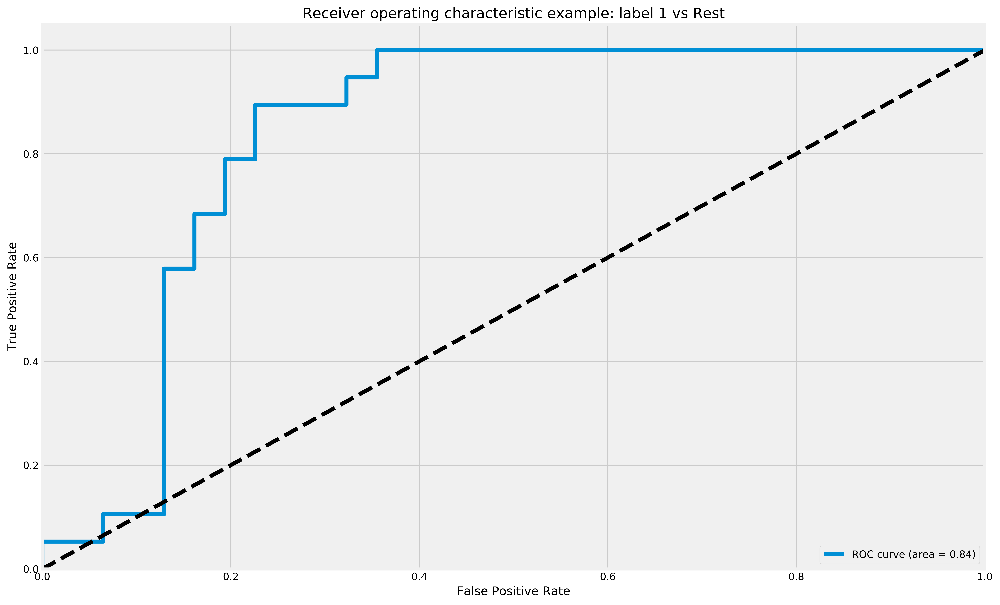

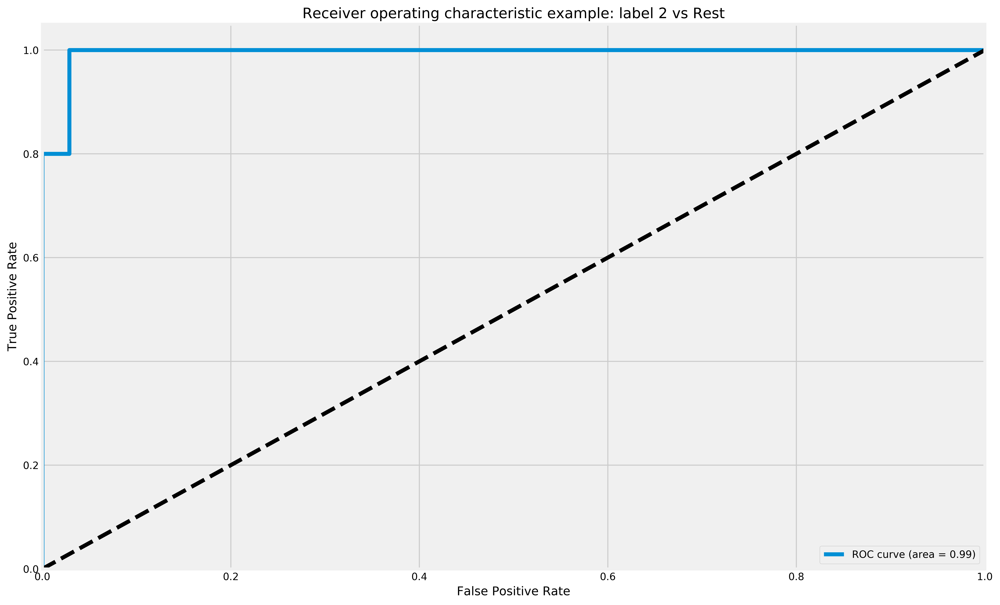

In [150]:
from sklearn.metrics import roc_curve, auc
from sklearn import datasets
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import LinearSVC
from sklearn.preprocessing import label_binarize
from sklearn.cross_validation import train_test_split
import matplotlib.pyplot as plt

iris = datasets.load_iris()
X, y = iris.data, iris.target

y = label_binarize(y, classes=[0,1,2])
n_classes = 3

# shuffle and split training and test sets
X_train, X_test, y_train, y_test =\
    train_test_split(X, y, test_size=0.33, random_state=0)

# classifier
clf = OneVsRestClassifier(LinearSVC(random_state=0))
y_score = clf.fit(X_train, y_train).decision_function(X_test)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot of a ROC curve for a specific class
for i in range(n_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver operating characteristic example: label {i} vs Rest')
    plt.legend(loc="lower right")
    plt.show()

In [146]:
n_classes

3

In [74]:
diabetes = datasets.load_diabetes()
def sklearn_to_df(sklearn_dataset):
    df = pd.DataFrame(sklearn_dataset.data, columns=sklearn_dataset.feature_names)
    df['ycol'] = pd.Series(sklearn_dataset.target)
    return df

df = sklearn_to_df(datasets.load_diabetes())
df.shape

(442, 11)

In [ ]:
sklearn.calibration.CalibratedClassifierCV

In [7]:
from sklearn.utils.testing import all_estimators

estimators = all_estimators()

for name, class_ in estimators:
    if hasattr(class_, 'predict_proba'):
        print(name)
#sklearn.calibration.CalibratedClassifierCV

AdaBoostClassifier
BaggingClassifier
BayesianGaussianMixture
BernoulliNB
CalibratedClassifierCV
ComplementNB
DPGMM
DecisionTreeClassifier
ExtraTreeClassifier
ExtraTreesClassifier
GMM
GaussianMixture
GaussianNB
GaussianProcessClassifier
GradientBoostingClassifier
KNeighborsClassifier
LabelPropagation
LabelSpreading
LinearDiscriminantAnalysis
LogisticRegression
LogisticRegressionCV
MLPClassifier
MultinomialNB
NuSVC
QuadraticDiscriminantAnalysis
RandomForestClassifier
SGDClassifier
SVC
VBGMM
_BinaryGaussianProcessClassifierLaplace
_ConstantPredictor
_DPGMMBase
_GMMBase


In [ ]:

(f' Decision boundary @ 50/50:

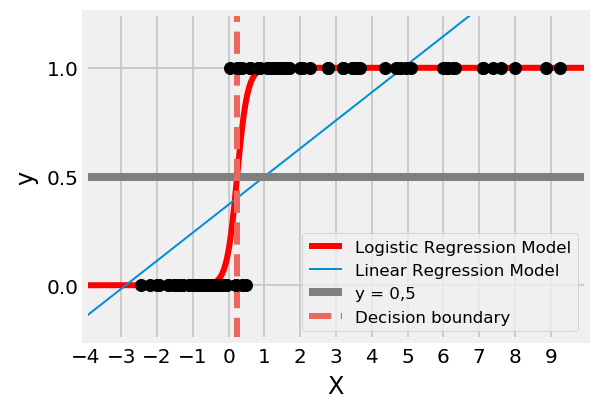

[0.]
 Decision boundary @ 50/50: 0.23869554724159595
[[0.5 0.5]]


In [23]:
# Logistic regression plot
# slightly adapted from:
# Code source: Gael Varoquaux
# License: BSD 3 clause

# Some nice colors we can use in our plots:
colors = {'blue': '#729ECE',
          'brown': '#A8786E',
          'green': '#67BF5C',
          'grey': '#A2A2A2',
          'orange': '#FF9E4A',
          'pink': '#ED97CA',
          'purple': '#AD8BC9',
          'red': '#ED665D',
          'teal': '#6DCCDA',
          'yellow': '#CDCC5D'}

import numpy as np
import matplotlib.pyplot as plt

from sklearn import linear_model

# this is our test set, it's just a straight line with some
# Gaussian noise
xmin, xmax = -5, 5
n_samples = 100
np.random.seed(0)
X = np.random.normal(size=n_samples)
y = (X > 0).astype(np.float)
X[X > 0] *= 4
X += .3 * np.random.normal(size=n_samples)

X = X[:, np.newaxis]
#run the classifier
clf = linear_model.LogisticRegression(C=1e5)
clf.fit(X, y)

# and plot the result
plt.figure(1, figsize=(4, 3))
plt.clf()
plt.scatter(X.ravel(), y, color='black', zorder=20)
X_test = np.linspace(-5, 10, 300)


def model(x):
    return 1 / (1 + np.exp(-x))
loss = model(X_test * clf.coef_ + clf.intercept_).ravel()
plt.plot(X_test, loss, color='red', linewidth=3)

ols = linear_model.LinearRegression()
ols.fit(X, y)
plt.plot(X_test, ols.coef_ * X_test + ols.intercept_, linewidth=1)
plt.axhline(.5, color='.5')

xval_chance = (-1 * clf.intercept_[0])/clf.coef_[0][0]
plt.axvline(xval_chance, lw=3, color=colors['red'], ls='dashed',
           label='gpa where P(y = 1) = 0.5')

plt.ylabel('y')
plt.xlabel('X')
plt.xticks(range(-5, 10))
plt.yticks([0, 0.5, 1])
plt.ylim(-.25, 1.25)
plt.xlim(-4, 10)
plt.legend(('Logistic Regression Model', 'Linear Regression Model', 'y = 0,5','Decision boundary'),
           loc="lower right", fontsize='small')
plt.show()
print(clf.intercept_+xval_chance*clf.coef_[0][0])
print(f' Decision boundary @ 50/50: {xval_chance}')

print(clf.predict_proba([[xval_chance]]))